**IMPLEMENTAÇÃO DE 6 ALGORITMOS DE MACHINE LEARNING PARA A PREDIÇÃO DE GESTAÇÕES DE RISCO**
<br>
*Por: Arthur, Cauã, Dakró, Leonardo, Marcelo, João e Nícolas*

In [ ]:
# INSTALAÇÃO DE BIBLIOTECAS
from IPython.display import clear_output
!pip install scikeras
!pip install scikit-learn==1.4.2
!pip install tensorflow
!pip install tabulate
!pip install seaborn
!pip install xgboost
!pip install imblearn
!pip install shap
clear_output()

In [ ]:
# BIBLIOTECAS
import pandas as pd
import copy
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import numpy as np
import xgboost as XGB
import shap

from IPython.display import clear_output
from IPython.display import HTML
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import recall_score, precision_score, f1_score, accuracy_score, confusion_matrix, classification_report, roc_curve, auc, roc_auc_score, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn import preprocessing
from scikeras.wrappers import KerasClassifier
from collections import Counter
from imblearn.over_sampling import SMOTE
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input, Dropout
from itertools import product

# **O DATASET**

## >Requisitos Iniciais

In [ ]:
# ACESSO AO DATASET
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# LEITURA DO DATASET
data = pd.read_csv(r'/content/drive/MyDrive/Maternal Health Risk Data Set.csv')
palette = {'low risk': 'yellowgreen', 'mid risk': 'gold', 'high risk': 'firebrick'}
paleta = ['yellowgreen', 'gold', 'firebrick']

## >Dataset Orginal (1)

In [ ]:
# FUNÇÃO PARA A DIVISÃO DE DADOS DO DATASET 1
def func_data_1(random_state = 42, output = True):
  # LEITURA DO BANCO DE DADOS
  data_1 = copy.deepcopy(data)

  # DIVISÃO DOS DADOS (FEATURES E TARGET)
  X = data_1[data_1.columns[:6]]
  y = data_1[data_1.columns[6]]

  # TRANSFORMANDO AS CLASSES EM VALORES NUMÉRICOS
  y = y.map({'low risk': 0, 'mid risk': 1, 'high risk': 2})

  # DIVISÃO DOS CONJUNTOS DE TREINO E DE TESTE
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = random_state, stratify = y) # 80% para treino (X_train, y_train) e 20% para teste (X_test, y_test) de forma estratificada
  rs = random_state # garante reprodutibilidade salvando o valor randomico

  # EXIBIÇÃO DE INFORMAÇÕES SOBRE O DATASET
  print('== DATASET ORGINAL ==')
  print('- Classes -\n')
  print('Baixo Risco (0):', len(data_1[data_1['RiskLevel'] == 'low risk']))
  print('Médio Risco (1):', len(data_1[data_1['RiskLevel'] == 'mid risk']))
  print('Alto Risco  (2):', len(data_1[data_1['RiskLevel'] == 'high risk']))
  print(f'\nDistribuição de targets de TREINO: {Counter(y_train)}')
  print(f'Distribuição de targets de TESTE: {Counter(y_test)}')
  print('\n- Informações Adicionais -\n')
  data_1.info()
  print('\n- Tabela -\n')
  display(data_1.head())

  if output == False:
    clear_output()

  return data_1, np.array(X_train), np.array(X_test), y_train, y_test

### >>Análise Exploratória (1)

In [ ]:
data_1, X_train, X_test, y_train, y_test = func_data_1()

== DATASET ORGINAL ==
- Classes -

Baixo Risco (0): 406
Médio Risco (1): 336
Alto Risco  (2): 272

Distribuição de targets de TREINO: Counter({0: 325, 1: 269, 2: 217})
Distribuição de targets de TESTE: Counter({0: 81, 1: 67, 2: 55})

- Informações Adicionais -

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1014 entries, 0 to 1013
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Age          1014 non-null   int64  
 1   SystolicBP   1014 non-null   int64  
 2   DiastolicBP  1014 non-null   int64  
 3   BS           1014 non-null   float64
 4   BodyTemp     1014 non-null   float64
 5   HeartRate    1014 non-null   int64  
 6   RiskLevel    1014 non-null   object 
dtypes: float64(2), int64(4), object(1)
memory usage: 55.6+ KB

- Tabela -



,Age,SystolicBP,DiastolicBP,BS,BodyTemp,HeartRate,RiskLevel
0,25,130,80,15.0,98.0,86,high risk
1,35,140,90,13.0,98.0,70,high risk
2,29,90,70,8.0,100.0,80,high risk
3,30,140,85,7.0,98.0,70,high risk
4,35,120,60,6.1,98.0,76,low risk


In [ ]:
# ESTATÍSTICAS DESCRITIVAS DO DATASET ORIGINAL
# Vetores para armazenar cada registro por classe
lowR = data_1[data_1['RiskLevel'] == 'low risk']
mediumR = data_1[data_1['RiskLevel'] == 'mid risk']
highR = data_1[data_1['RiskLevel'] == 'high risk']
# Exclui linhas vazias
lowR = lowR.reset_index(drop = True)
mediumR = mediumR.reset_index(drop = True)
highR = highR.reset_index(drop = True)

low_discribe = pd.DataFrame(lowR.describe()).round(2)
medium_discribe = pd.DataFrame(mediumR.describe()).round(2)
high_discribe = pd.DataFrame(highR.describe()).round(2)

discribe_all = pd.concat([low_discribe, medium_discribe, high_discribe], keys = ['Baixo Risco', 'Médio Risco', 'Alto Risco'])

display(discribe_all)
discribe_all.to_csv('Discribe_low_mid_high-Dataset_Original.csv')

Age  SystolicBP  DiastolicBP      BS  BodyTemp  \
Baixo Risco count  406.00      406.00       406.00  406.00    406.00   
            mean    26.87      105.87        72.53    7.22     98.37   
            std     13.12       15.89        13.05    0.65      1.11   
            min     10.00       70.00        49.00    6.00     98.00   
            25%     17.00       90.00        60.00    6.90     98.00   
            50%     22.00      120.00        75.00    7.50     98.00   
            75%     32.00      120.00        80.00    7.50     98.00   
            max     70.00      129.00       100.00   11.00    103.00   
Médio Risco count  336.00      336.00       336.00  336.00    336.00   
            mean    28.36      113.15        74.23    7.80     98.83   
            std     12.55       14.98        11.49    2.29      1.43   
            min     10.00       70.00        50.00    6.00     98.00   
            25%     19.00      100.00        65.00    6.80     98.00   
            50%     25.00      120.00        75.00    7.00     98.00   
            75%     32.00      120.00        80.00    7.80    100.00   
            max     60.00      140.00       100.00   18.00    103.00   
Alto Risco  count  272.00      272.00       272.00  272.00    272.00   
            mean    36.22      124.19        85.07   12.12     98.90   
            std     13.03       20.23        14.11    4.17      1.56   
            min     12.00       83.00        60.00    6.10     98.00   
            25%     25.00      120.00        75.00    7.90     98.00   
            50%     35.00      130.00        90.00   11.00     98.00   
            75%     48.00      140.00       100.00   15.00    100.00   
            max     65.00      160.00       100.00   19.00    103.00   

                   HeartRate  
Baixo Risco count     406.00  
            mean       72.77  
            std         8.29  
            min         7.00  
            25%        70.00  
            50%        70.00  
            75%        77.00  
            max        88.00  
Médio Risco count     336.00  
            mean       74.18  
            std         6.77  
            min        60.00  
            25%        70.00  
            50%        76.00  
            75%        78.00  
            max        88.00  
Alto Risco  count     272.00  
            mean       76.74  
            std         8.70  
            min        60.00  
            25%        70.00  
            50%        77.00  
            75%        86.00  
            max        90.00

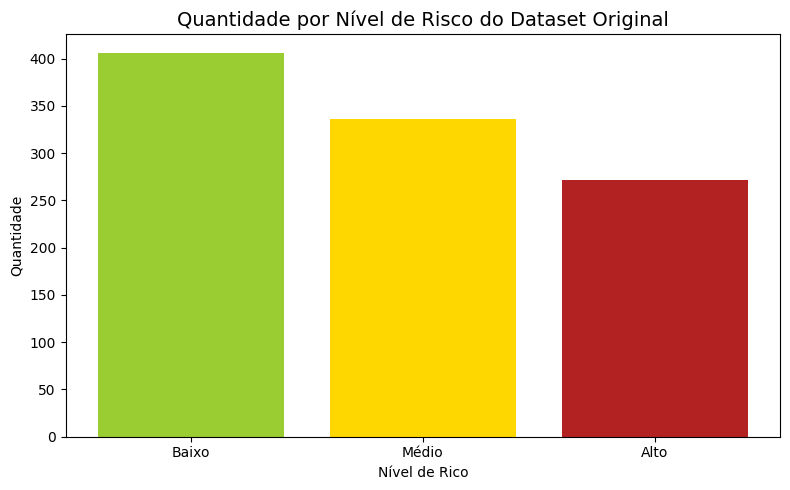

In [ ]:
# PROPORÇÃO DE DIAGNÓSTICOS
plt.figure(figsize=(8, 5))
plt.bar('Baixo', len(lowR), color =  paleta[0])
plt.bar('Médio', len(mediumR), color =  paleta[1])
plt.bar('Alto', len(highR), color =  paleta[2])
plt.title('Quantidade por Nível de Risco do Dataset Original', fontsize=14)
plt.xlabel('Nível de Rico')
plt.ylabel('Quantidade')
plt.tight_layout()
plt.show()

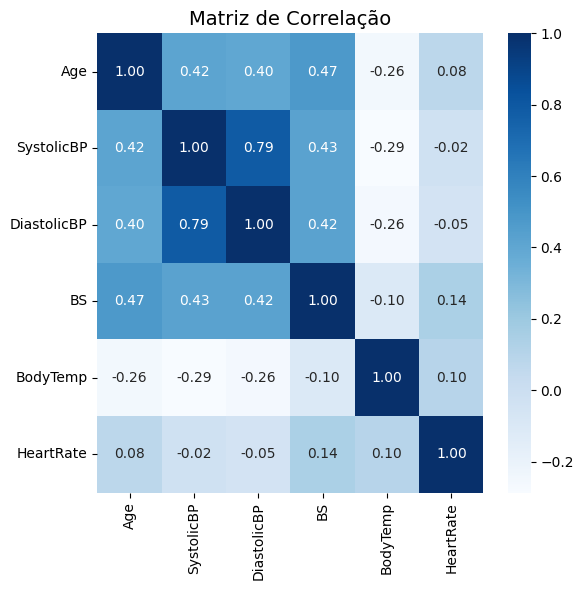

In [ ]:
# MATRIZ DE CORRELAÇÃO DOS DADOS
# Calcula a matriz de correlação
dataCORR = data_1.drop(['RiskLevel'], axis = 1)
correlation = dataCORR.corr(numeric_only=True)

# Cria o heatmap
plt.figure(figsize=(6, 6))
sns.heatmap(correlation, annot=True, fmt='0.2f',cmap='Blues')
plt.title("Matriz de Correlação", fontsize=14)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

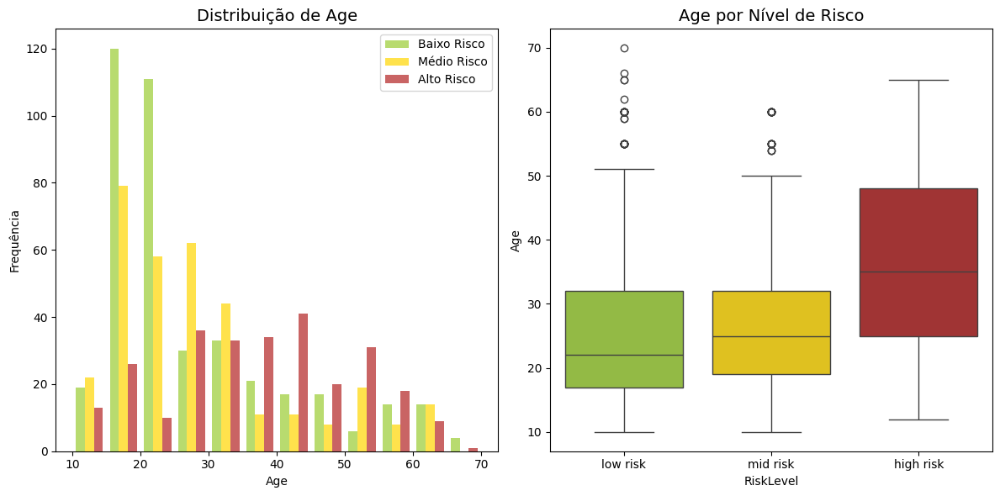

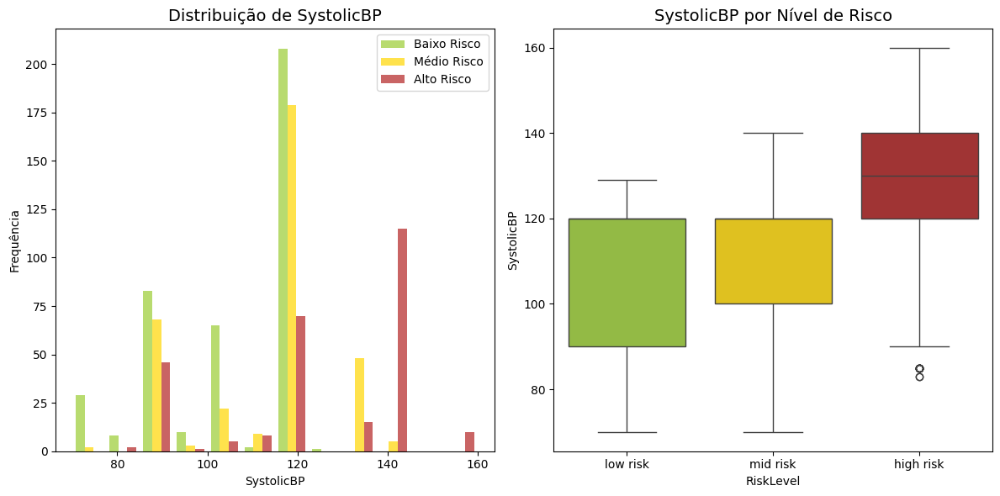

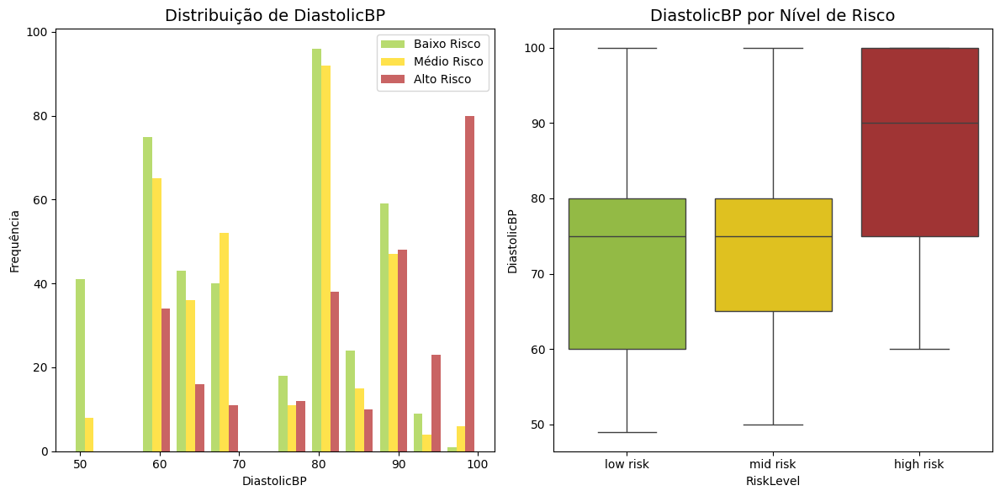

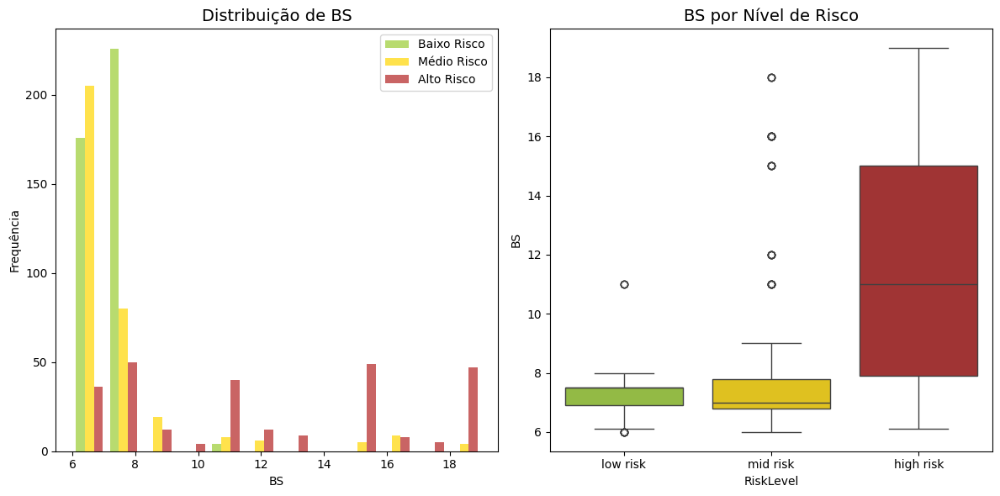

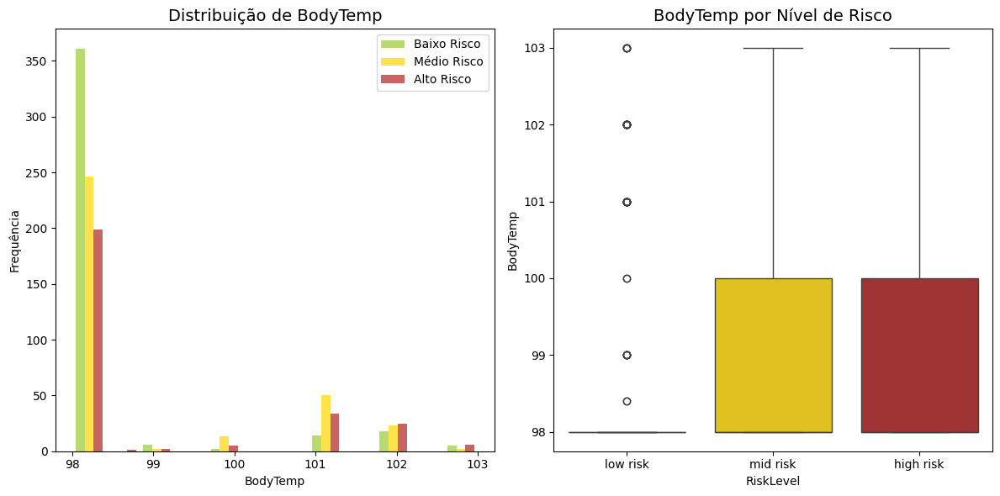

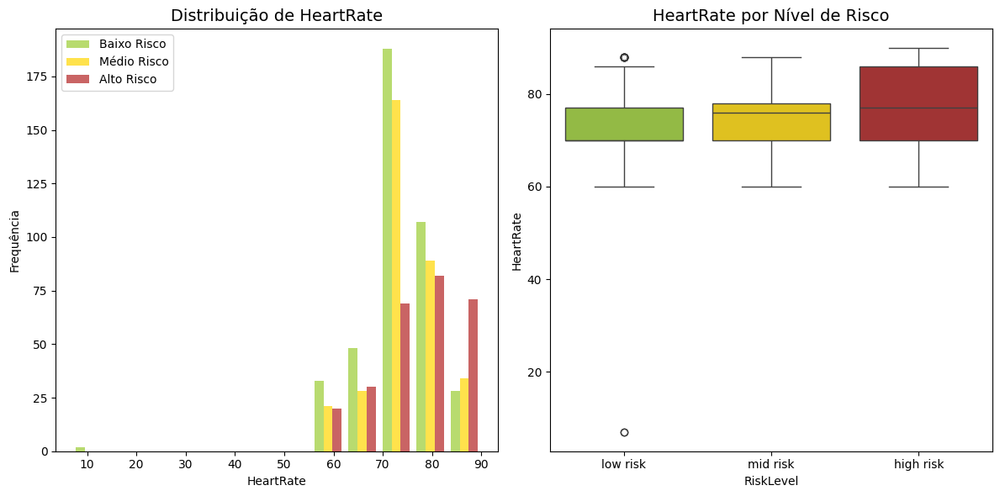

In [ ]:
# HISTOGRAMAS E BOXPLOTS
for i in range(0, len(data_1.columns) - 1 ):
  fig, ax = plt.subplots(ncols = 2, nrows = 1, figsize = (12, 6))
  ax[0].hist([lowR[data_1.columns[i]], mediumR[data_1.columns[i]], highR[data_1.columns[i]]], bins = 12, color = paleta, alpha = 0.7, label=['Baixo Risco', 'Médio Risco', 'Alto Risco'], histtype = 'bar')
  ax[0].set_title(f'Distribuição de {data_1.columns[i]}', fontsize=14)
  ax[0].set_xlabel(data_1.columns[i])
  ax[0].set_ylabel('Frequência')
  ax[0].legend()
  sns.boxplot(data = data_1, x = 'RiskLevel', y = data_1.columns[i], ax = ax[1], palette = palette, hue='RiskLevel', order = ['low risk', 'mid risk', 'high risk'])
  ax[1].set_title(f'{data_1.columns[i]} por Nível de Risco', fontsize=14)
  plt.tight_layout()
  plt.show()

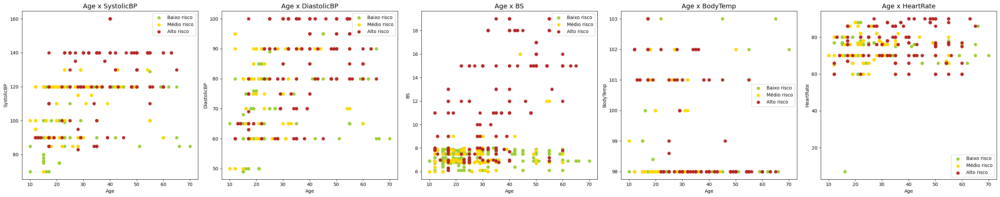

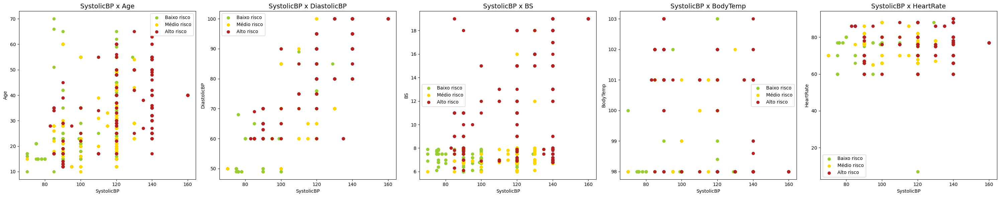

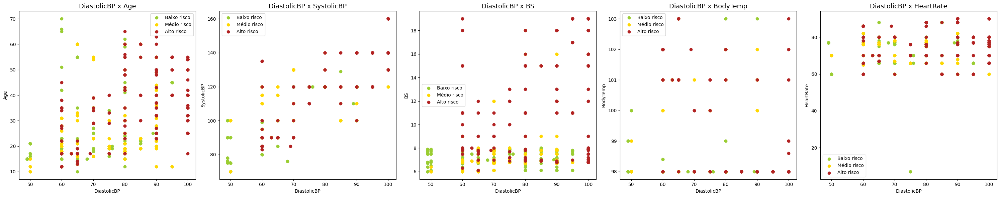

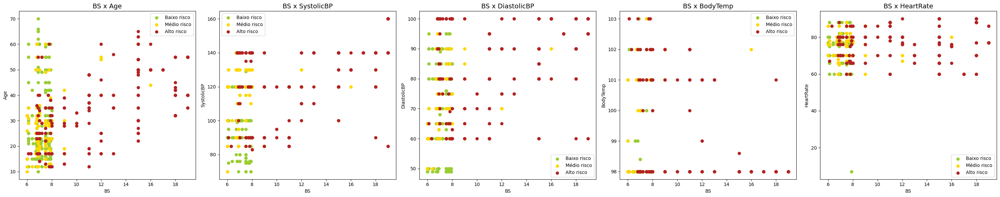

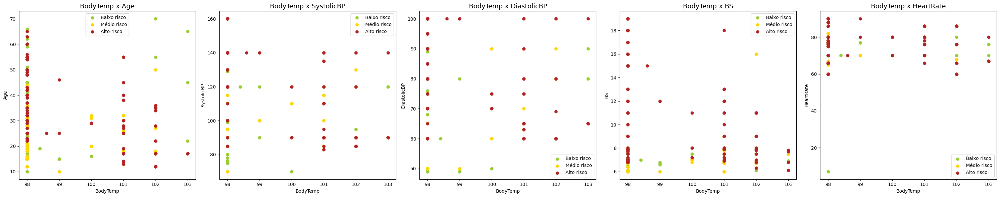

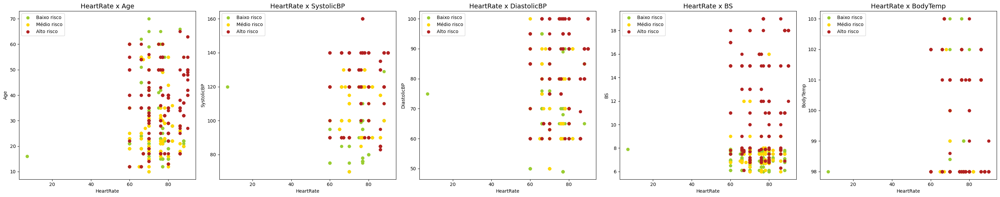

In [ ]:
# GRÁFICO DE DISPERSÃO
for i in range(0, len(data_1.columns) - 1):
  count = 0
  fig, ax = plt.subplots(ncols = 5, nrows = 1, figsize = (30, 6))
  for j in range(0, len(data_1.columns) - 1):
    if i != j:
      ax[count].scatter(lowR[data_1.columns[i]], lowR[data_1.columns[j]], color = palette['low risk'], label = 'Baixo risco')
      ax[count].scatter(mediumR[data_1.columns[i]], mediumR[data_1.columns[j]], color = palette['mid risk'], label = 'Médio risco')
      ax[count].scatter(highR[data_1.columns[i]], highR[data_1.columns[j]], color = palette['high risk'], label = 'Alto risco')
      ax[count].set_xlabel(data_1.columns[i])
      ax[count].set_ylabel(data_1.columns[j])
      ax[count].set_title(f'{data_1.columns[i]} x {data_1.columns[j]}', fontsize=14)
      ax[count].legend()
      count += 1

  plt.tight_layout()
  plt.show()

## >Dataset Refinado (2)

In [ ]:
# FUNÇÃO PARA A DIVISÃO DE DADOS DO DATASET 2
def func_data_2(random_state = 42, output = True):
  # LEITURA DO BANCO DE DADOS
  data_2 = copy.deepcopy(data)

  # REFINAMENTO
  for i in range(0, len(data['Age'])):
  # Correção do registro errado da frequência cardíaca
    if data_2['HeartRate'][i] < 20:
      data_2.loc[i, 'HeartRate'] = data_2['HeartRate'][i] * 10
  # Remoção dos registros das gestantes menores de 18
    # elif data_R['Age'][i] < 18:
    #   data_R = data_R.drop(i, axis = 0)
  data_2 = data_2.drop_duplicates().reset_index(drop = True) # Remove registros duplicados e exclui linhas vazias

  # DIVISÃO DOS DADOS
  X = data_2[data_2.columns[:6]]
  y = data_2[data_2.columns[6]]

  # TRANSFORMANDO AS CLASSES EM VALORES NUMÉRICOS
  y = y.map({'low risk': 0, 'mid risk': 1, 'high risk': 2})

  # DIVISÃO DOS CONJUNTOS DE TREINO E DE TESTE
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = random_state, stratify = y) # 80% para treino (X_train, y_train) e 20% para teste (X_test, y_test) de forma estratificada
  rs = random_state # garante reprodutibilidade salvando o valor randomico

  # NORMALIZAÇÃO DOS DADOS
  scaler = preprocessing.MinMaxScaler()
  X_train = scaler.fit_transform(X_train)
  X_test = scaler.transform(X_test)


  # EXIBIÇÃO DE INFORMAÇÕES SOBRE O DATASET
  print('== DATASET REFINADO ==')
  print('- Classes -\n')
  print('Baixo Risco (0):', len(data_2[data_2['RiskLevel'] == 'low risk']))
  print('Médio Risco (1):', len(data_2[data_2['RiskLevel'] == 'mid risk']))
  print('Alto Risco  (2):', len(data_2[data_2['RiskLevel'] == 'high risk']))
  print(f'\nDistribuição de targets de TREINO: {Counter(y_train)}')
  print(f'Distribuição de targets de TESTE: {Counter(y_test)}')
  print('\n- Informações Adicionais -\n')
  data_2.info()
  print('\n- Tabela -\n')
  display(data_2.head())

  if output == False:
    clear_output()

  return data_2, X_train, X_test, y_train, y_test

### >>Análise Exploratória (2)

In [ ]:
data_2, X_train, X_test, y_train, y_test = func_data_2()

# DATASET NORMALIZADO
y_train = y_train.reset_index(drop = True)
y_test = y_test.reset_index(drop = True)
X_concat = pd.concat([pd.DataFrame(X_train), pd.DataFrame(X_test)], axis = 0)
y_concat = pd.concat([y_train, y_test], axis = 0)
data_2_norm = pd.concat([X_concat, y_concat], axis = 1)
data_2_norm.columns = data_2.columns

== DATASET REFINADO ==
- Classes -

Baixo Risco (0): 234
Médio Risco (1): 106
Alto Risco  (2): 112

Distribuição de targets de TREINO: Counter({0: 187, 2: 89, 1: 85})
Distribuição de targets de TESTE: Counter({0: 47, 2: 23, 1: 21})

- Informações Adicionais -

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 452 entries, 0 to 451
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Age          452 non-null    int64  
 1   SystolicBP   452 non-null    int64  
 2   DiastolicBP  452 non-null    int64  
 3   BS           452 non-null    float64
 4   BodyTemp     452 non-null    float64
 5   HeartRate    452 non-null    int64  
 6   RiskLevel    452 non-null    object 
dtypes: float64(2), int64(4), object(1)
memory usage: 24.8+ KB

- Tabela -



,Age,SystolicBP,DiastolicBP,BS,BodyTemp,HeartRate,RiskLevel
0,25,130,80,15.0,98.0,86,high risk
1,35,140,90,13.0,98.0,70,high risk
2,29,90,70,8.0,100.0,80,high risk
3,30,140,85,7.0,98.0,70,high risk
4,35,120,60,6.1,98.0,76,low risk


In [ ]:
# ESTATÍSTICAS DESCRITIVAS DO DATASET ORIGINAL
# Vetores para armazenar cada registro por classe
lowR = data_2_norm[data_2_norm['RiskLevel'] == 0][data_2_norm.columns[:6]]
mediumR = data_2_norm[data_2_norm['RiskLevel'] == 1][data_2_norm.columns[:6]]
highR = data_2_norm[data_2_norm['RiskLevel'] == 2][data_2_norm.columns[:6]]

# Exclui linhas vazias
lowR = lowR.reset_index(drop = True)
mediumR = mediumR.reset_index(drop = True)
highR = highR.reset_index(drop = True)

low_discribe = pd.DataFrame(lowR.describe()).round(4)
medium_discribe = pd.DataFrame(mediumR.describe()).round(4)
high_discribe = pd.DataFrame(highR.describe()).round(4)

discribe_all = pd.concat([low_discribe, medium_discribe, high_discribe], keys = ['Baixo Risco', 'Médio Risco', 'Alto Risco'])

display(discribe_all)
discribe_all.to_csv('Discribe_low_mid_high-Dataset_Refinado.csv')

Age  SystolicBP  DiastolicBP        BS  BodyTemp  \
Baixo Risco count  234.0000    234.0000     234.0000  234.0000  234.0000   
            mean     0.2887      0.3937       0.4653    0.0924    0.0721   
            std      0.2314      0.1723       0.2565    0.0437    0.2215   
            min      0.0000      0.0000       0.0000    0.0000    0.0000   
            25%      0.1333      0.2222       0.2157    0.0692    0.0000   
            50%      0.2000      0.3333       0.5098    0.0923    0.0000   
            75%      0.3917      0.5556       0.6078    0.1154    0.0000   
            max      1.0000      0.6556       1.0000    0.3846    1.0000   
Médio Risco count  106.0000    106.0000     106.0000  106.0000  106.0000   
            mean     0.3090      0.4712       0.5076    0.1457    0.1717   
            std      0.2119      0.1673       0.2386    0.1833    0.2940   
            min      0.0000      0.0000       0.0196    0.0000    0.0000   
            25%      0.1500      0.3333       0.3137    0.0615    0.0000   
            50%      0.2583      0.5556       0.5588    0.0769    0.0000   
            75%      0.3667      0.5556       0.7059    0.1385    0.4000   
            max      0.8333      0.7778       1.0000    0.9231    1.0000   
Alto Risco  count  112.0000    112.0000     112.0000  112.0000  112.0000   
            mean     0.3955      0.5499       0.6380    0.3973    0.2457   
            std      0.2261      0.2329       0.2883    0.3028    0.3419   
            min      0.0333      0.1444       0.2157    0.0077    0.0000   
            25%      0.2500      0.3194       0.3725    0.1269    0.0000   
            50%      0.3917      0.5556       0.6078    0.3846    0.0000   
            75%      0.5333      0.7778       0.9020    0.6923    0.6000   
            max      0.9167      1.0000       1.0000    1.0000    1.0000   

                   HeartRate  
Baixo Risco count   234.0000  
            mean      0.4343  
            std       0.2337  
            min       0.0000  
            25%       0.3333  
            50%       0.3333  
            75%       0.5667  
            max       0.9333  
Médio Risco count   106.0000  
            mean      0.4632  
            std       0.2334  
            min       0.0000  
            25%       0.3333  
            50%       0.5333  
            75%       0.6000  
            max       0.9333  
Alto Risco  count   112.0000  
            mean      0.5494  
            std       0.2835  
            min       0.0000  
            25%       0.3333  
            50%       0.5667  
            75%       0.6667  
            max       1.0000

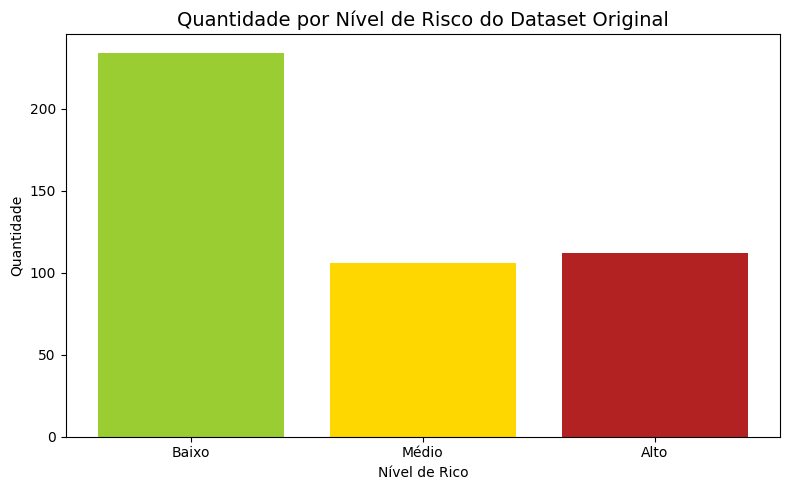

In [ ]:
# PROPORÇÃO DE DIAGNÓSTICOS
plt.figure(figsize=(8, 5))
plt.bar('Baixo', len(lowR), color = paleta[0])
plt.bar('Médio', len(mediumR), color = paleta[1])
plt.bar('Alto', len(highR), color = paleta[2])
plt.title('Quantidade por Nível de Risco do Dataset Original', fontsize=14)
plt.xlabel('Nível de Rico')
plt.ylabel('Quantidade')
plt.tight_layout()
plt.show()

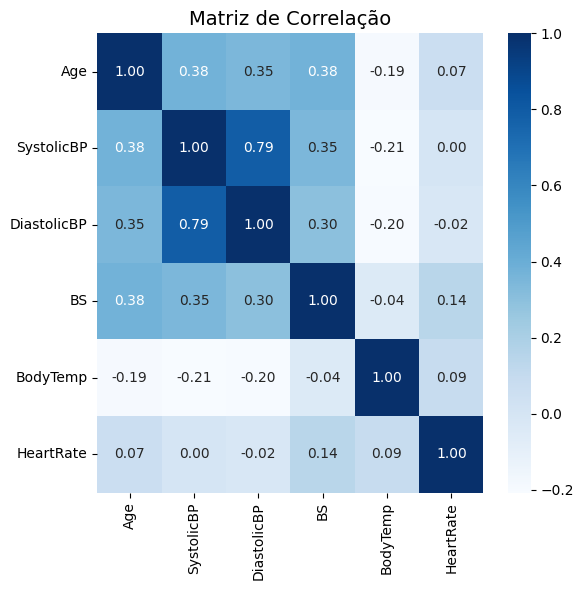

In [ ]:
# MATRIZ DE CORRELAÇÃO DOS DADOS
# Calcula a matriz de correlação
dataCORR = data_2.drop(['RiskLevel'], axis = 1)
correlation = dataCORR.corr(numeric_only=True)

# Cria o heatmap
plt.figure(figsize=(6, 6))
sns.heatmap(correlation, annot=True, fmt='0.2f',cmap='Blues')
plt.title("Matriz de Correlação", fontsize=14)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

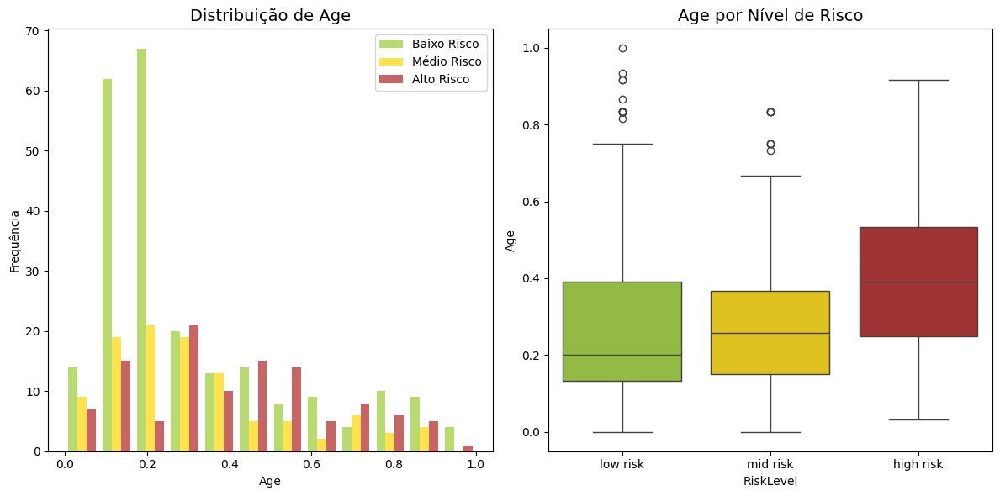

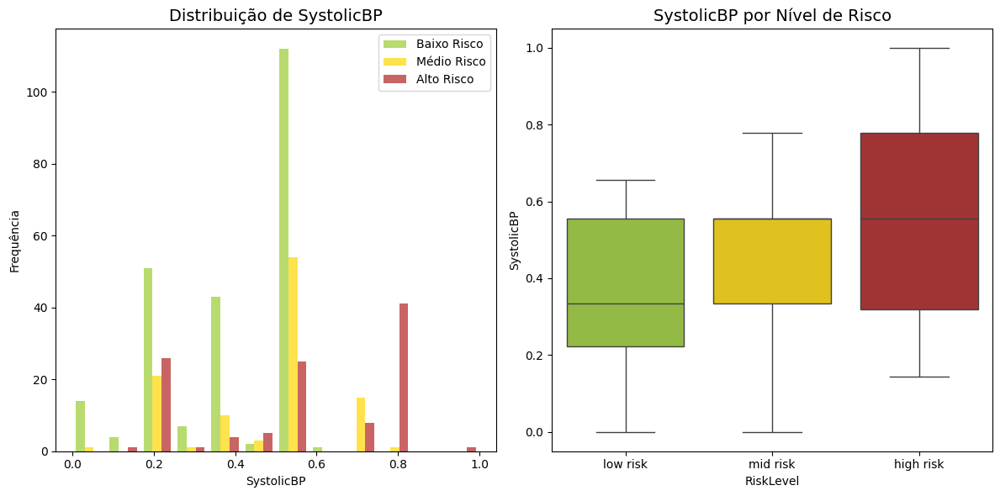

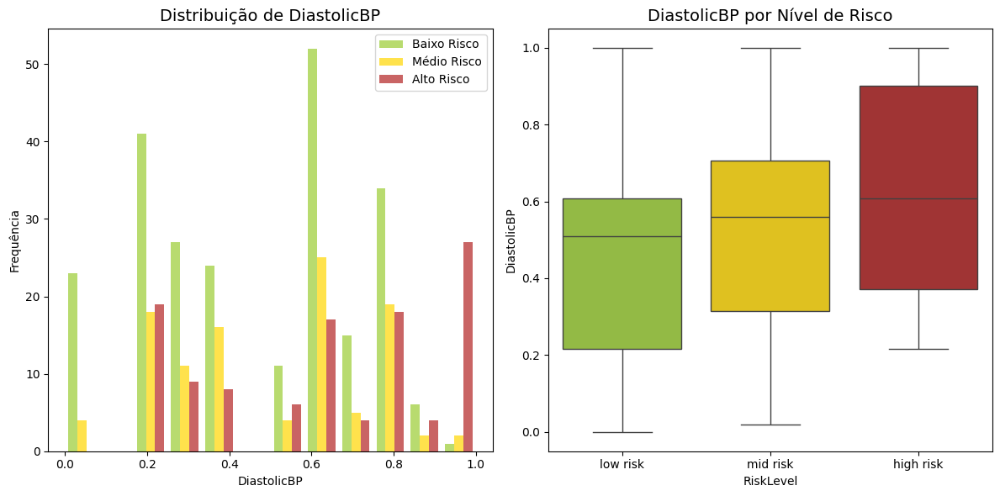

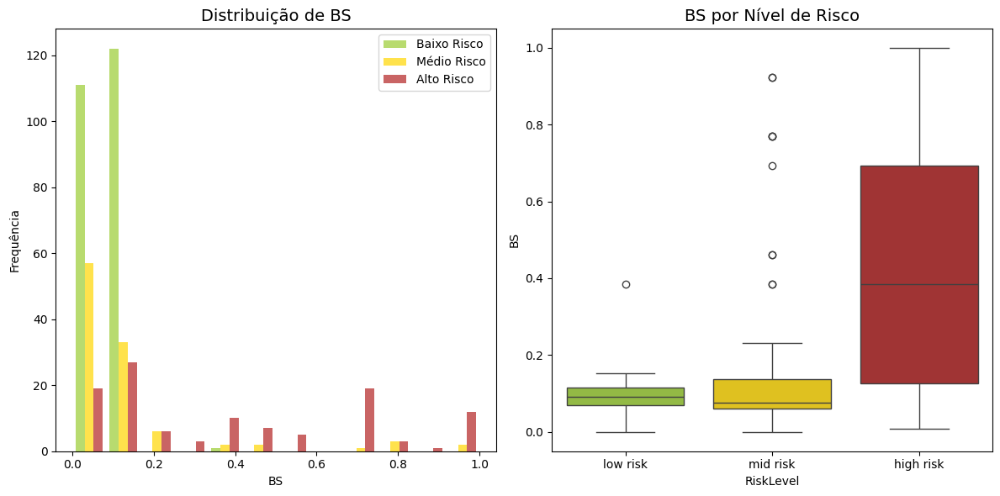

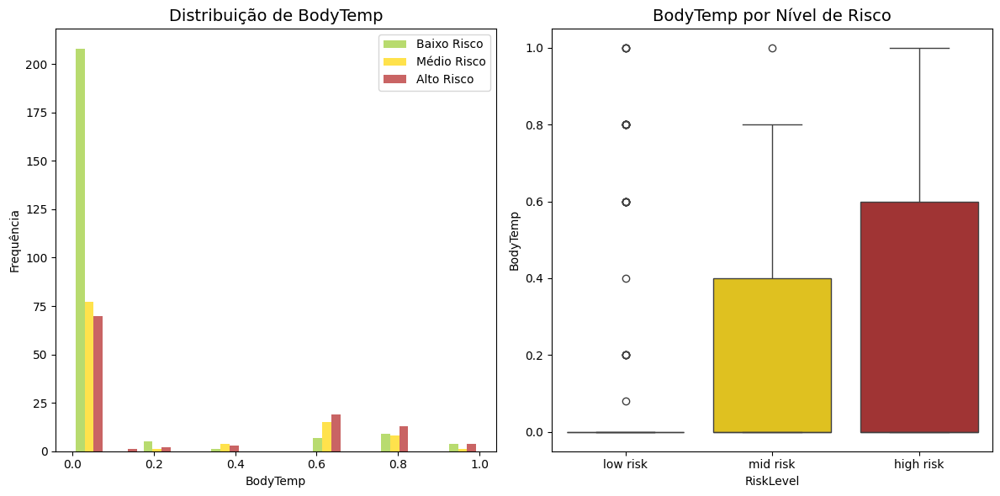

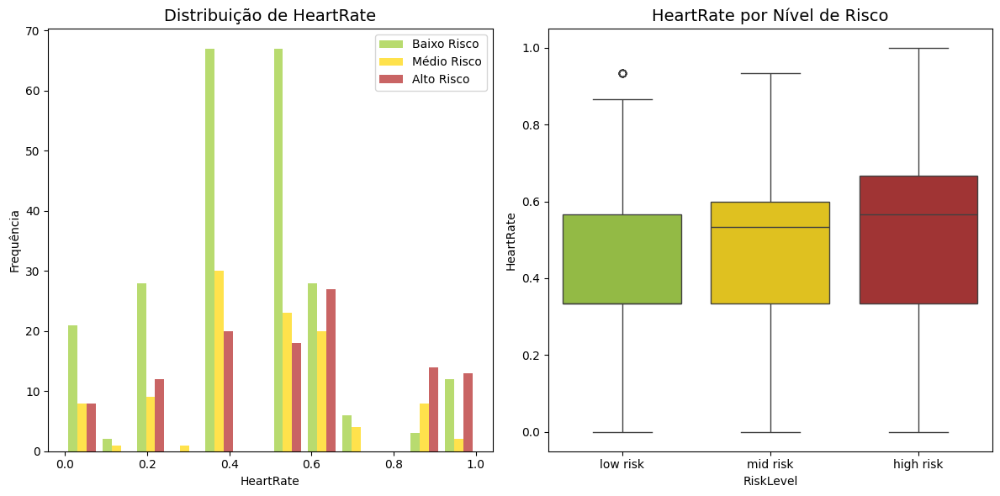

In [ ]:
# HISTOGRAMAS E BOXPLOTS
data_2_norm['RiskLevel'] = data_2_norm['RiskLevel'].map({0: 'low risk', 1: 'mid risk', 2: 'high risk'})
for i in range(0, len(data_2.columns) - 1 ):
  fig, ax = plt.subplots(ncols = 2, nrows = 1, figsize = (12, 6))
  ax[0].hist([lowR[data_2.columns[i]], mediumR[data_2.columns[i]], highR[data_2.columns[i]]], bins = 12, color = paleta, alpha = 0.7, label=['Baixo Risco', 'Médio Risco', 'Alto Risco'], histtype = 'bar')
  ax[0].set_title(f'Distribuição de {data_2.columns[i]}', fontsize=14)
  ax[0].set_xlabel(data_2.columns[i])
  ax[0].set_ylabel('Frequência')
  ax[0].legend()
  sns.boxplot(data = data_2_norm, x = 'RiskLevel', y = data_2.columns[i], ax = ax[1], palette = palette, hue='RiskLevel', order = ['low risk', 'mid risk', 'high risk'])
  ax[1].set_title(f'{data_2.columns[i]} por Nível de Risco', fontsize=14)
  plt.tight_layout()
  plt.show()

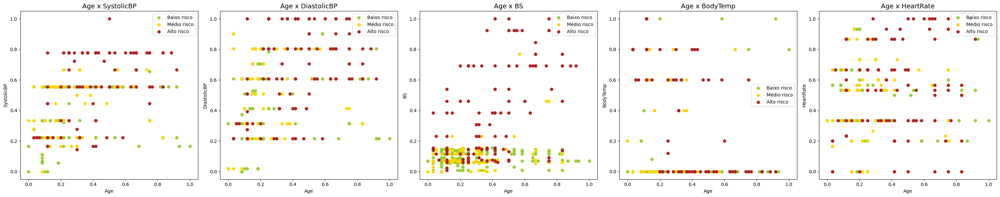

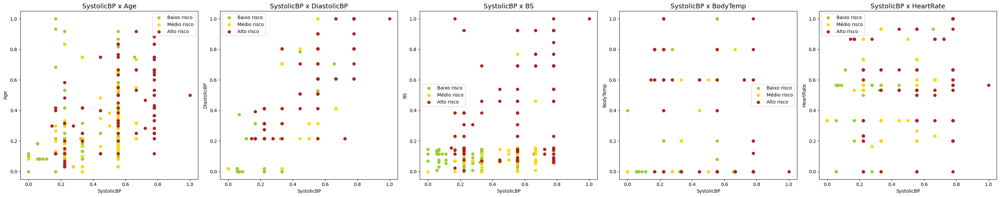

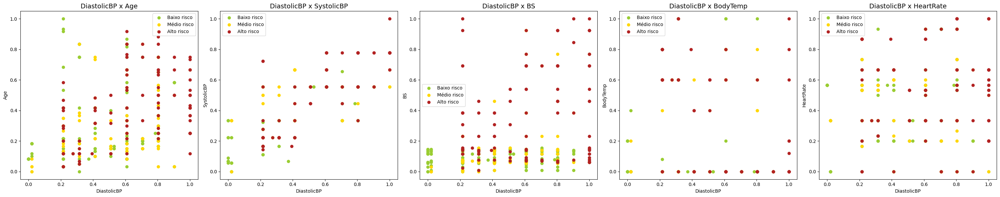

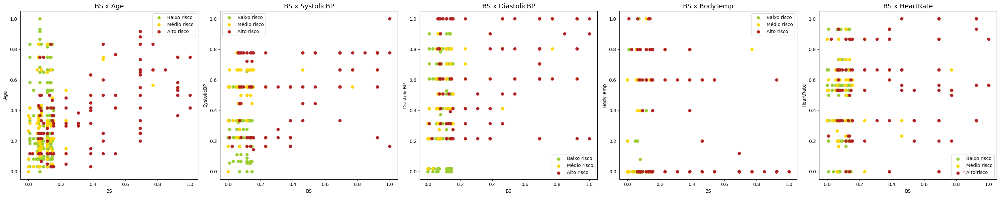

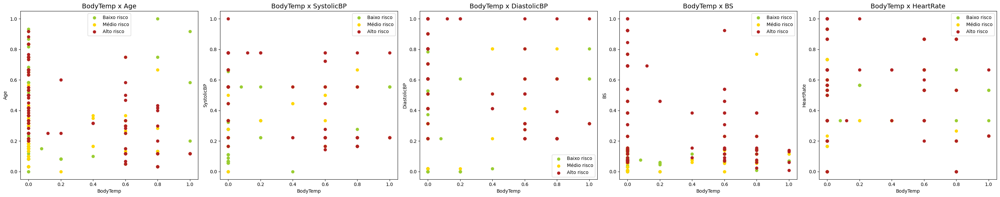

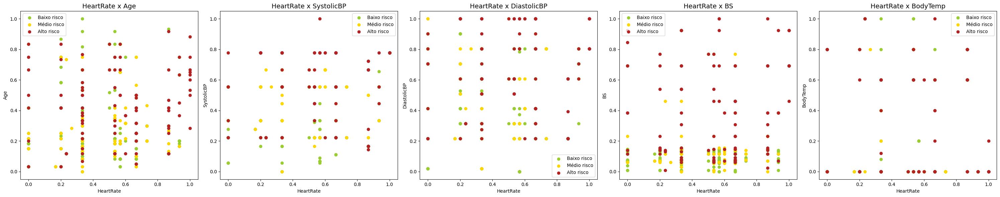

In [ ]:
# Vetores para armazenar cada registro normalizado por classe
# GRÁFICO DE DISPERSÃO
for i in range(0, len(data_2.columns) - 1):
  count = 0
  fig, ax = plt.subplots(ncols = 5, nrows = 1, figsize = (30, 6))
  for j in range(0, len(data_2.columns) - 1):
    if i != j:
      ax[count].scatter(lowR[data_2.columns[i]], lowR[data_2.columns[j]], color = palette['low risk'], label = 'Baixo risco')
      ax[count].scatter(mediumR[data_2.columns[i]], mediumR[data_2.columns[j]], color = palette['mid risk'], label = 'Médio risco')
      ax[count].scatter(highR[data_2.columns[i]], highR[data_2.columns[j]], color = palette['high risk'], label = 'Alto risco')
      ax[count].set_xlabel(data_2.columns[i])
      ax[count].set_ylabel(data_2.columns[j])
      ax[count].set_title(f'{data_2.columns[i]} x {data_2.columns[j]}', fontsize=14)
      ax[count].legend()
      count += 1

  plt.tight_layout()
  plt.show()

## >Dataset Refinado + SMOTE no set de treino (3)

In [ ]:
# FUNÇÃO PARA A DIVISÃO DE DADOS DO DATASET 3
def func_data_3(random_state = 42, output = True):
  # LEITURA DO BANCO DE DADOS
  data_3 = copy.deepcopy(data)

  # REFINAMENTO
  for i in range(0, len(data['Age'])):
  # Correção do registro errado da frequência cardíaca
    if data_3['HeartRate'][i] < 20:
      data_3.loc[i, 'HeartRate'] = data_3['HeartRate'][i] * 10
  # Remoção dos registros das gestantes menores de 18
    # elif data_R['Age'][i] < 18:
    #   data_R = data_R.drop(i, axis = 0)
  data_3 = data_3.drop_duplicates().reset_index(drop = True) # Remove registros duplicados e exclui linhas vazias

  # DIVISÃO DOS DADOS (FEATURES E TARGET)
  X = data_3[data_3.columns[:6]]
  y = data_3[data_3.columns[6]]

  # TRANSFORMANDO AS CLASSES EM VALORES NUMÉRICOS
  y = y.map({'low risk': 0, 'mid risk': 1, 'high risk': 2})

  # DIVISÃO DOS CONJUNTOS DE TREINO E DE TESTE
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = random_state, stratify = y) # 80% para treino (X_train, y_train) e 20% para teste (X_test, y_test) de forma estratificada
  rs = random_state # garante reprodutibilidade salvando o valor randomico

  # ALGORITMO SMOTE
  sm = SMOTE(random_state = random_state, k_neighbors = 5) # Configuração do SMOTE
  X_train, y_train = sm.fit_resample(X_train, y_train) # Adição do SMOTE para o set de treinamento

  # DATASET COM REGISTROS SINTÉTICOS
  X_concat = pd.concat([X_train, X_test], axis = 0)
  y_concat = pd.concat([y_train, y_test], axis = 0)
  data_3 = pd.concat([X_concat, y_concat], axis = 1)
  data_3 = data_3.replace({0: 'low risk', 1: 'mid risk', 2: 'high risk'})

  # NORMALIZAÇÃO DOS DADOS
  scaler = preprocessing.MinMaxScaler()
  X_train = scaler.fit_transform(X_train)
  X_test = scaler.transform(X_test)

  # EXIBIÇÃO DE INFORMAÇÕES SOBRE O DATASET
  print('== DATASET REFINADO ==')
  print('- Classes -\n')
  print('Baixo Risco (0):', len(data_3[data_3['RiskLevel'] == 'low risk']))
  print('Médio Risco (1):', len(data_3[data_3['RiskLevel'] == 'mid risk']))
  print('Alto Risco  (2):', len(data_3[data_3['RiskLevel'] == 'high risk']))
  print(f'\nDistribuição de targets de TREINO: {Counter(y_train)}')
  print(f'Distribuição de targets de TESTE: {Counter(y_test)}')
  print('\n- Informações Adicionais -\n')
  data_3.info()
  print('\n- Tabela -\n')
  display(data_3.head())

  if output == False:
    clear_output()

  return data_3, X_train, X_test, y_train, y_test

### >>Análise Exploratória (3)

In [ ]:
# CHAMADA DA FUNÇÃO
data_3, X_train, X_test, y_train, y_test = func_data_3()

# DATASET NORMALIZADO
y_train = y_train.reset_index(drop = True)
y_test = y_test.reset_index(drop = True)
X_concat = pd.concat([pd.DataFrame(X_train), pd.DataFrame(X_test)], axis = 0)
y_concat = pd.concat([y_train, y_test], axis = 0)
data_3_norm = pd.concat([X_concat, y_concat], axis = 1)
data_3_norm.columns = data_3.columns

== DATASET REFINADO ==
- Classes -

Baixo Risco (0): 234
Médio Risco (1): 208
Alto Risco  (2): 210

Distribuição de targets de TREINO: Counter({2: 187, 0: 187, 1: 187})
Distribuição de targets de TESTE: Counter({0: 47, 2: 23, 1: 21})

- Informações Adicionais -

<class 'pandas.core.frame.DataFrame'>
Index: 652 entries, 0 to 21
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Age          652 non-null    int64  
 1   SystolicBP   652 non-null    int64  
 2   DiastolicBP  652 non-null    int64  
 3   BS           652 non-null    float64
 4   BodyTemp     652 non-null    float64
 5   HeartRate    652 non-null    int64  
 6   RiskLevel    652 non-null    object 
dtypes: float64(2), int64(4), object(1)
memory usage: 40.8+ KB

- Tabela -



,Age,SystolicBP,DiastolicBP,BS,BodyTemp,HeartRate,RiskLevel
0,48,120,80,11.0,98.0,88,high risk
1,43,120,80,15.0,98.0,76,high risk
2,18,90,60,6.9,98.0,70,low risk
3,30,120,80,6.9,101.0,76,mid risk
4,13,90,65,7.5,101.0,80,high risk


In [ ]:
# ESTATÍSTICAS DESCRITIVAS DO DATASET ORIGINAL
# Vetores para armazenar as estatísticas descritivas
lowR = data_3_norm[data_3_norm['RiskLevel'] == 0][data_3_norm.columns[:6]]
mediumR = data_3_norm[data_3_norm['RiskLevel'] == 1][data_3_norm.columns[:6]]
highR = data_3_norm[data_3_norm['RiskLevel'] == 2][data_3_norm.columns[:6]]

# Exclui linhas vazias
lowR = lowR.reset_index(drop = True)
mediumR = mediumR.reset_index(drop = True)
highR = highR.reset_index(drop = True)

low_discribe = pd.DataFrame(lowR.describe()).round(4)
medium_discribe = pd.DataFrame(mediumR.describe()).round(4)
high_discribe = pd.DataFrame(highR.describe()).round(4)

discribe_all = pd.concat([low_discribe, medium_discribe, high_discribe], keys = ['Baixo Risco', 'Médio Risco', 'Alto Risco'])

display(discribe_all)
discribe_all.to_csv('Discribe_low_mid_high-Dataset_Refinado+SMOTE.csv')

Age  SystolicBP  DiastolicBP        BS  BodyTemp  \
Baixo Risco count  234.0000    234.0000     234.0000  234.0000  234.0000   
            mean     0.2887      0.3937       0.4653    0.0924    0.0721   
            std      0.2314      0.1723       0.2565    0.0437    0.2215   
            min      0.0000      0.0000       0.0000    0.0000    0.0000   
            25%      0.1333      0.2222       0.2157    0.0692    0.0000   
            50%      0.2000      0.3333       0.5098    0.0923    0.0000   
            75%      0.3917      0.5556       0.6078    0.1154    0.0000   
            max      1.0000      0.6556       1.0000    0.3846    1.0000   
Médio Risco count  208.0000    208.0000     208.0000  208.0000  208.0000   
            mean     0.2929      0.4518       0.4841    0.1416    0.1942   
            std      0.2068      0.1695       0.2389    0.1670    0.2831   
            min      0.0000      0.0000       0.0196    0.0000    0.0000   
            25%      0.1333      0.2306       0.2500    0.0682    0.0000   
            50%      0.2500      0.5556       0.5196    0.0965    0.0000   
            75%      0.3667      0.5556       0.6078    0.1385    0.4227   
            max      0.8333      0.7778       1.0000    0.9231    1.0000   
Alto Risco  count  210.0000    210.0000     210.0000  210.0000  210.0000   
            mean     0.3973      0.5522       0.6482    0.3884    0.2232   
            std      0.2167      0.2262       0.2803    0.2911    0.3169   
            min      0.0333      0.1444       0.2157    0.0077    0.0000   
            25%      0.2500      0.3333       0.3922    0.1385    0.0000   
            50%      0.3833      0.5556       0.6471    0.3077    0.0000   
            75%      0.5292      0.7778       0.9167    0.6923    0.5879   
            max      0.9167      1.0000       1.0000    1.0000    1.0000   

                   HeartRate  
Baixo Risco count   234.0000  
            mean      0.4343  
            std       0.2337  
            min       0.0000  
            25%       0.3333  
            50%       0.3333  
            75%       0.5667  
            max       0.9333  
Médio Risco count   208.0000  
            mean      0.4704  
            std       0.2268  
            min       0.0000  
            25%       0.3333  
            50%       0.5000  
            75%       0.6000  
            max       0.9333  
Alto Risco  count   210.0000  
            mean      0.5638  
            std       0.2666  
            min       0.0000  
            25%       0.3333  
            50%       0.6000  
            75%       0.7333  
            max       1.0000

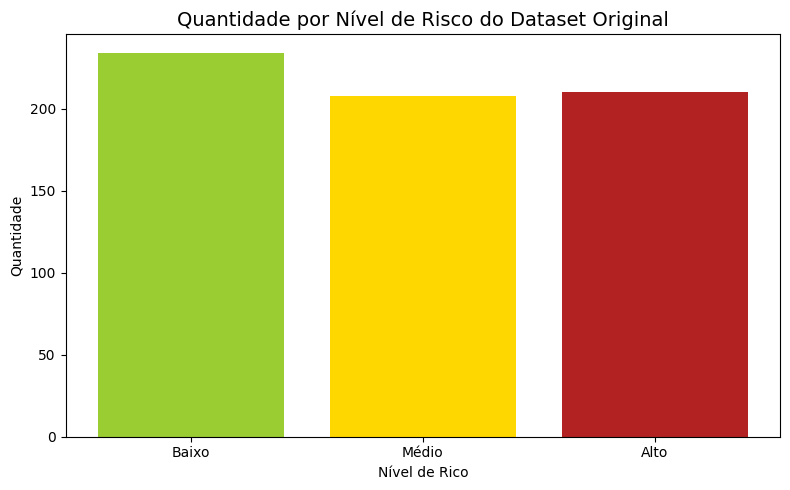

In [ ]:
# PROPORÇÃO DE DIAGNÓSTICOS
plt.figure(figsize=(8, 5))
plt.bar('Baixo', len(lowR), color = paleta[0])
plt.bar('Médio', len(mediumR), color = paleta[1])
plt.bar('Alto', len(highR), color = paleta[2])
plt.title('Quantidade por Nível de Risco do Dataset Original', fontsize=14)
plt.xlabel('Nível de Rico')
plt.ylabel('Quantidade')
plt.tight_layout()
plt.show()

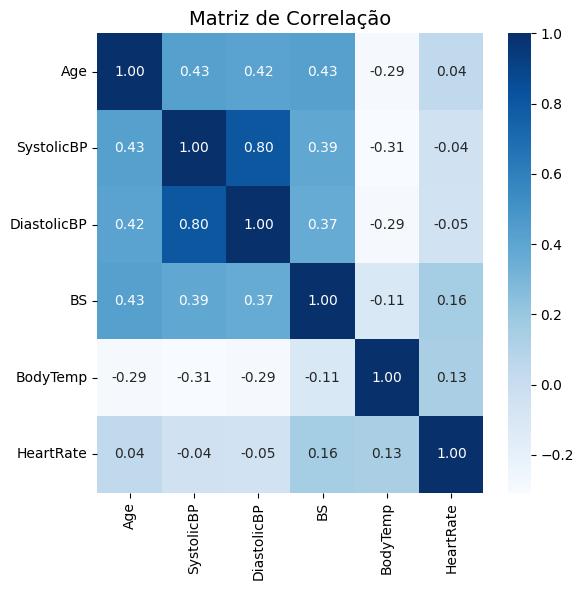

In [ ]:
# MATRIZ DE CORRELAÇÃO DOS DADOS
# Calcula a matriz de correlação
dataCORR = data_3.drop(['RiskLevel'], axis = 1)
correlation = dataCORR.corr(numeric_only=True)

# Cria o heatmap
plt.figure(figsize=(6, 6))
sns.heatmap(correlation, annot=True, fmt='0.2f',cmap='Blues')
plt.title("Matriz de Correlação", fontsize=14)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

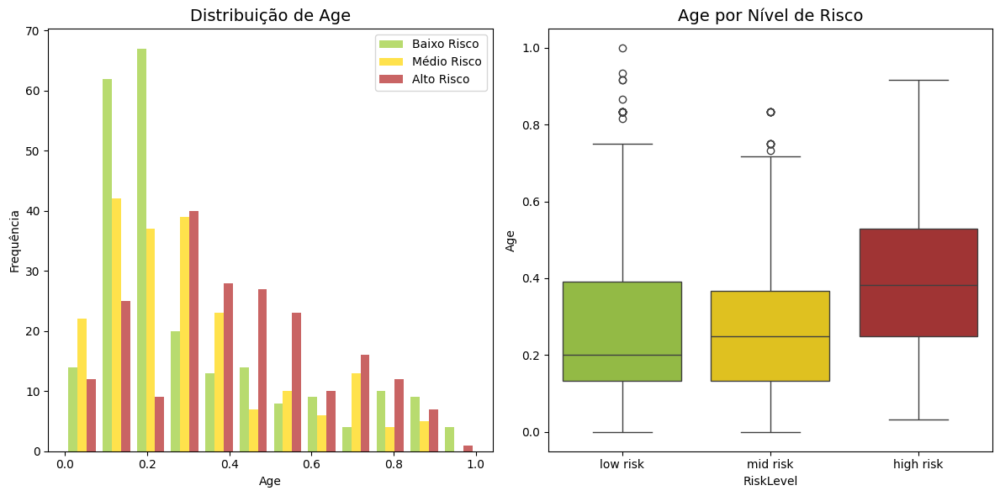

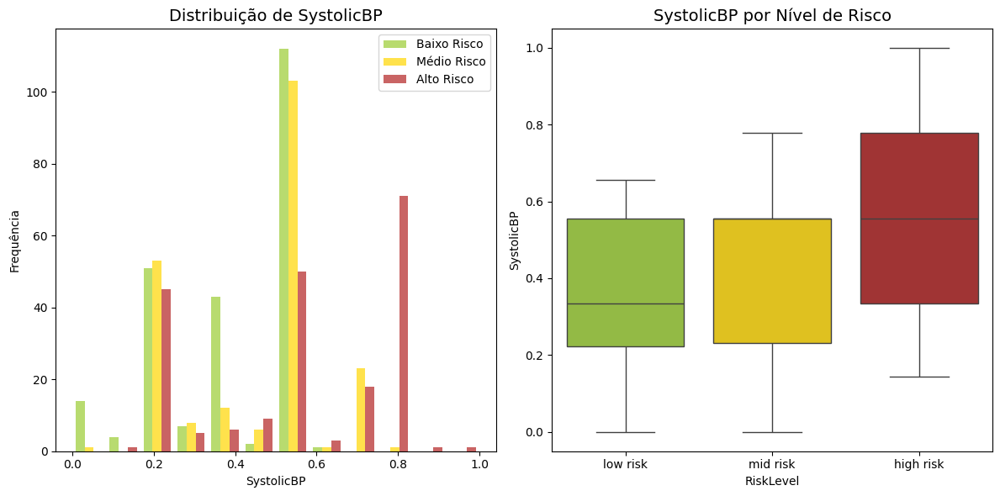

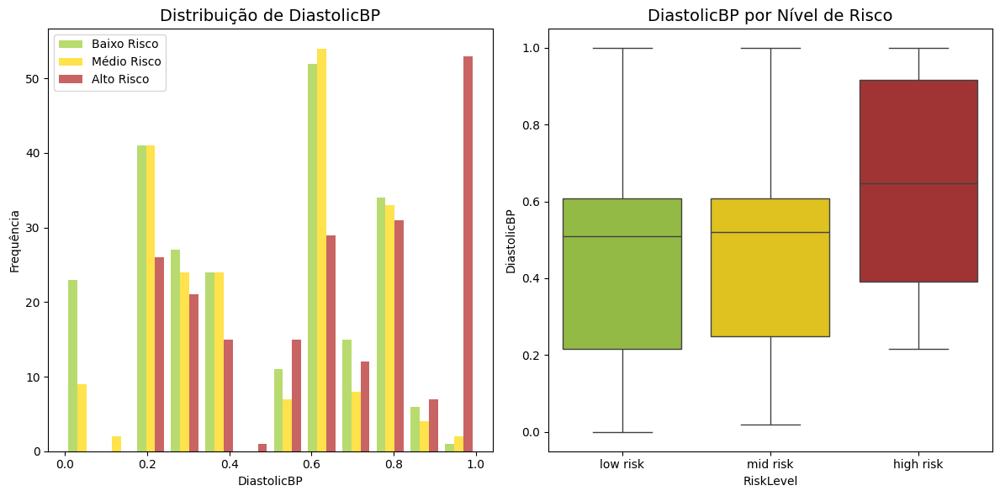

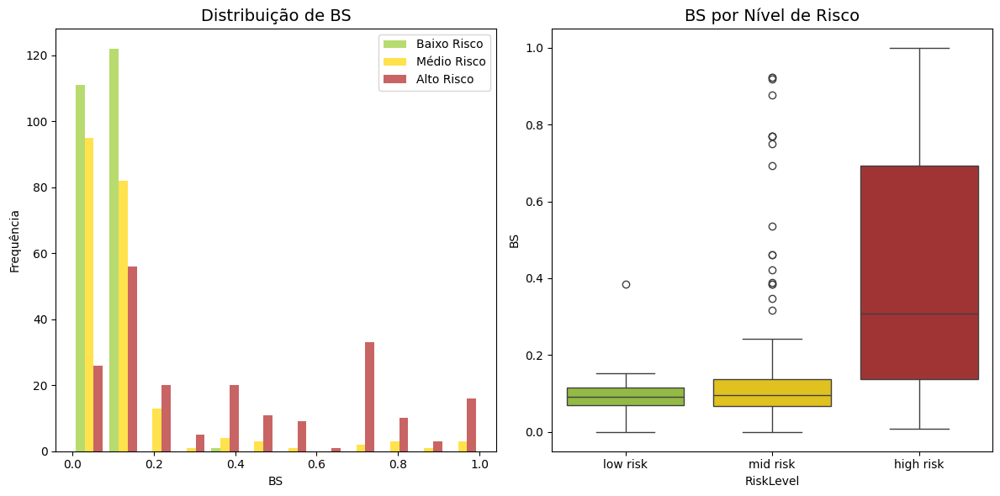

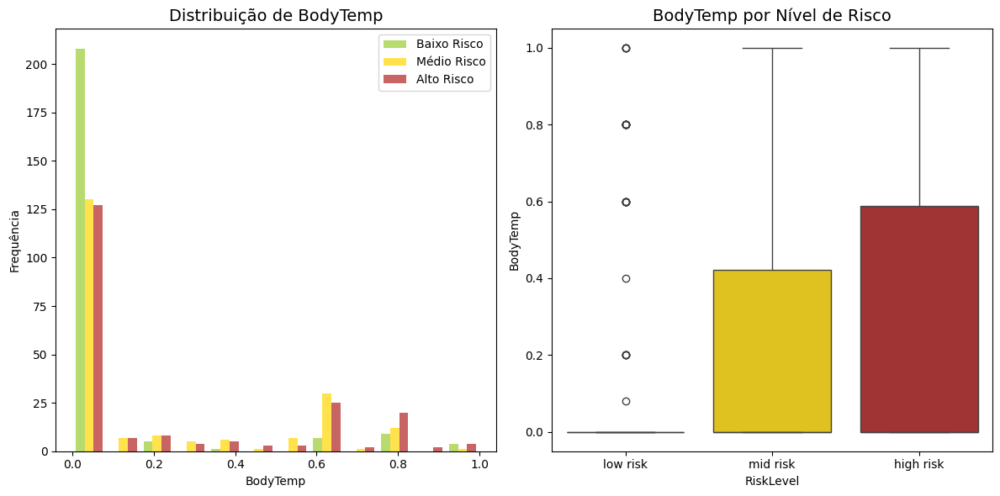

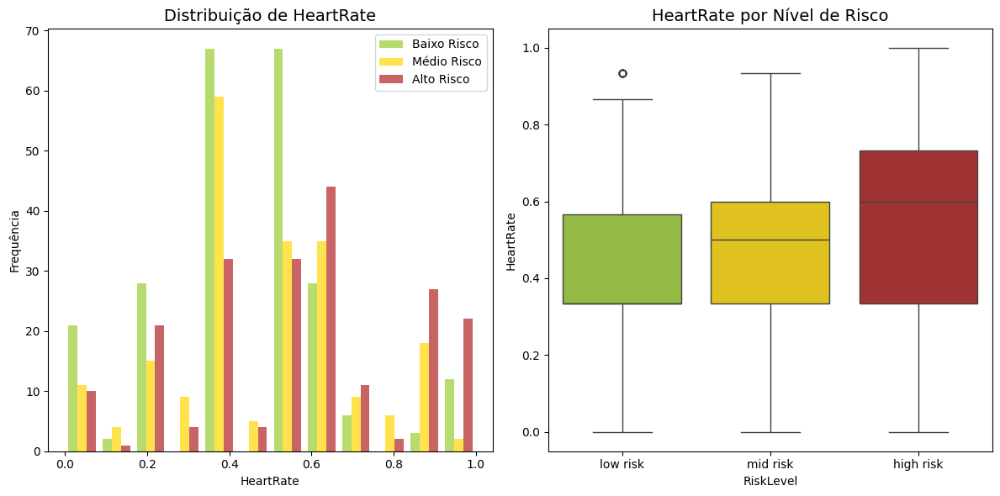

In [ ]:
# HISTOGRAMAS E BOXPLOTS
data_3_norm['RiskLevel'] = data_3_norm['RiskLevel'].map({0: 'low risk', 1: 'mid risk', 2: 'high risk'})
for i in range(0, len(data_3.columns) - 1 ):
  fig, ax = plt.subplots(ncols = 2, nrows = 1, figsize = (12, 6))
  ax[0].hist([lowR[data_3.columns[i]], mediumR[data_3.columns[i]], highR[data_3.columns[i]]], bins = 12, color = paleta, alpha = 0.7, label=['Baixo Risco', 'Médio Risco', 'Alto Risco'], histtype = 'bar')
  ax[0].set_title(f'Distribuição de {data_3.columns[i]}', fontsize=14)
  ax[0].set_xlabel(data_3.columns[i])
  ax[0].set_ylabel('Frequência')
  ax[0].legend()
  sns.boxplot(data = data_3_norm, x = 'RiskLevel', y = data_3.columns[i], ax = ax[1], palette = palette, hue='RiskLevel', order = ['low risk', 'mid risk', 'high risk'])
  ax[1].set_title(f'{data_3.columns[i]} por Nível de Risco', fontsize=14)
  plt.tight_layout()
  plt.show()

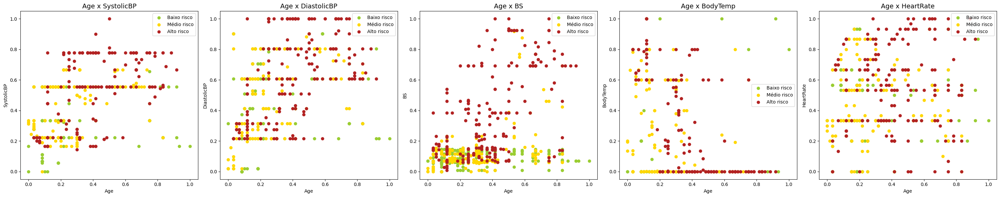

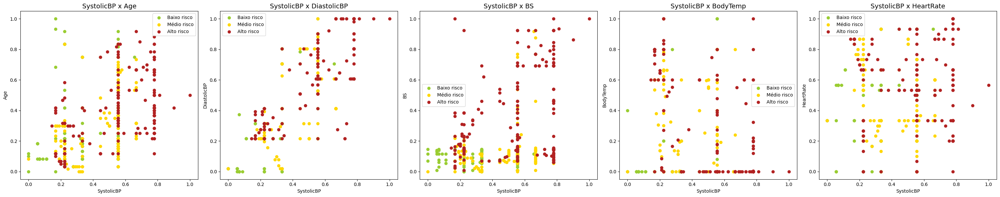

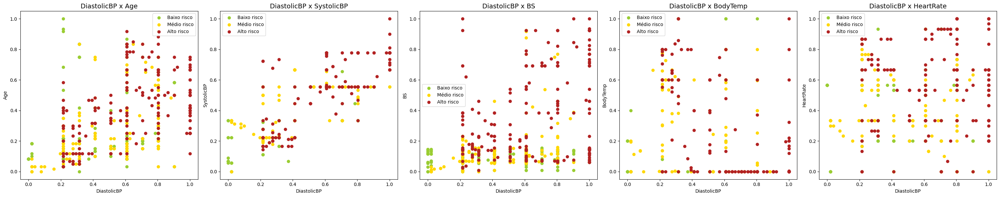

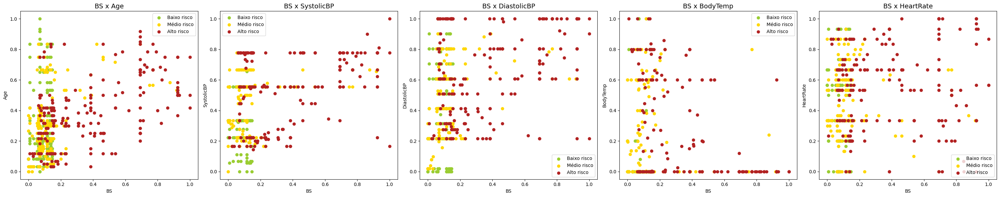

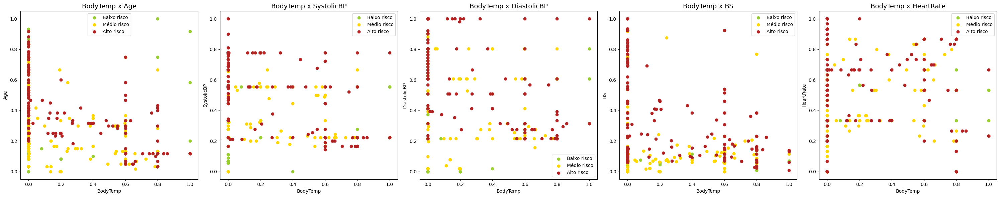

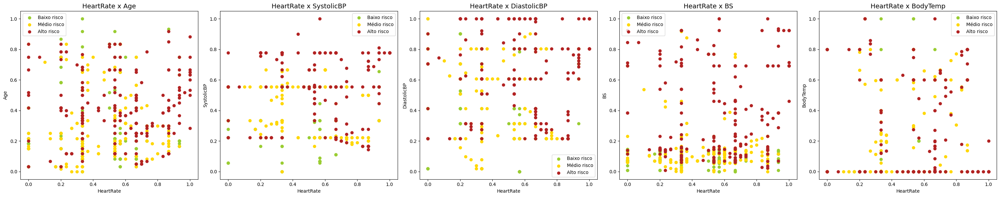

In [ ]:
# Vetores para armazenar cada registro normalizado por classe
# GRÁFICO DE DISPERSÃO
for i in range(0, len(data_3.columns) - 1):
  count = 0
  fig, ax = plt.subplots(ncols = 5, nrows = 1, figsize = (30, 6))
  for j in range(0, len(data_3.columns) - 1):
    if i != j:
      ax[count].scatter(lowR[data_3.columns[i]], lowR[data_3.columns[j]], color = palette['low risk'], label = 'Baixo risco')
      ax[count].scatter(mediumR[data_3.columns[i]], mediumR[data_3.columns[j]], color = palette['mid risk'], label = 'Médio risco')
      ax[count].scatter(highR[data_3.columns[i]], highR[data_3.columns[j]], color = palette['high risk'], label = 'Alto risco')
      ax[count].set_xlabel(data_3.columns[i])
      ax[count].set_ylabel(data_3.columns[j])
      ax[count].set_title(f'{data_3.columns[i]} x {data_3.columns[j]}', fontsize=14)
      ax[count].legend()
      count += 1

  plt.tight_layout()
  plt.show()

# **MLP**

## Método Hold-Out #1

In [ ]:
''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''
_, X_train, X_test, y_train, y_test = func_data_1(output = False) # !!! escolha o dataset alterando o número após o func_data_ !!!
''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''

# TREINO E VALIDAÇÃO HOLD-OUT
# Definição de uma função para a compilação de um modelo variável
def build_model(hidden1, hidden2, hidden3, dropout1, dropout2, dropout3, activation, learning_rate):
  model = Sequential([
      Input(shape = (6,)),
      Dense(hidden1, activation = activation),
      Dropout(dropout1),
      Dense(hidden2, activation = activation),
      Dropout(dropout2),
      Dense(hidden3, activation = activation),
      Dropout(dropout3),
      Dense(3, activation = 'softmax')
      ])
  model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate),
                loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
                metrics = ['accuracy'])
  return model

# Hiperparâmetros para teste
hidden1_options = [256]
hidden2_options = [128]
hidden3_options = [64]
dropout1_options = [0.5]
dropout2_options = [0.5]
dropout3_options = [0.0]
activation_options = ['leaky_relu']
learning_rate_options = [0.001]
batch_size_options = [32]
# hidden1_options = [128, 256, 512]
# hidden2_options = [64, 128, 256]
# hidden3_options = [32, 64, 128]
# dropout1_options = [0.0, 0.3, 0.5]
# dropout2_options = [0.0, 0.3, 0.5]
# dropout3_options = [0.0, 0.3, 0.5]
# activation_options = ['relu', 'leaky_relu']
# learning_rate_options = [0.01, 0.001]
# batch_size_options = [16, 32, 48]

tot = len(hidden1_options) * len(hidden2_options) * len(hidden3_options) * len(dropout1_options) * len(dropout2_options) * len(dropout3_options) * len(activation_options) * len(learning_rate_options) * len(batch_size_options)

# Lista para armazenar os resultados
results = []

# Definição do Eraly Stopping
callback_HoldOut_GS = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss', patience = 20, restore_best_weights = True) # Ferramenta de early stopping

count = 0
# EXECUÇÃO DO GRID SEARCH
for h1, h2, h3, dp1, dp2, dp3, act, lr, bs in product(hidden1_options, hidden2_options, hidden3_options, dropout1_options, dropout2_options, dropout3_options, activation_options, learning_rate_options, batch_size_options):
  count += 1
  print( f'Testando: hidden1 = {h1}, hidden2 = {h2}, hidden2 = {h3}, dropout1 = {dp1}, dropout1 = {dp2}, dropout1 = {dp3}, activation = {act}, learning rate = {lr}, batch_size = {bs}')
  model = build_model(h1, h2, h3, dp1, dp2, dp3, act, lr)
  model.fit(X_train, y_train, epochs = 300, batch_size = bs, callbacks = callback_HoldOut_GS, verbose = 0, validation_data = (X_test, y_test), shuffle = True) # Treina o modelo e avalia o desempenho com os dados de teste em cada época
  y_pred = np.argmax(model.predict(X_test), axis=1)
  acc = accuracy_score(y_test, y_pred)
  results.append(((h1, h2, h3, dp1, dp2, dp3, act, lr, bs), acc))
  print(f'{count}/{tot}')

Testando: hidden1 = 256, hidden2 = 128, hidden2 = 64, dropout1 = 0.5, dropout1 = 0.5, dropout1 = 0.0, activation = leaky_relu, learning rate = 0.001, batch_size = 32
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1


In [ ]:
# OBTER O MELHOR MODELO DA VALIDAÇÃO HOLD-OUT
best_model = max(results, key=lambda x: x[1])
h1, h2, h3, dp1, dp2, dp3, act, lr, bs = best_model[0]
print(f'Melhor modelo: hidden1 = {h1}, hidden2 = {h2}, hidden2 = {h3}, dropout1 = {dp1}, dropout2 = {dp2}, dropout3 = {dp3}, activation = {act}, learning rate = {lr}, batch_size = {bs}')

Melhor modelo: hidden1 = 256, hidden2 = 128, hidden2 = 64, dropout1 = 0.5, dropout2 = 0.5, dropout3 = 0.0, activation = leaky_relu, learning rate = 0.001, batch_size = 32


In [ ]:
# AVALIAR 10x O MELHOR MODELO DA VALIDAÇÃO HOLD-OUT
final_model = build_model(h1, h2, h3, dp1, dp2, dp3, act, lr)

classes = [0, 1, 2]
nome_classes = ['baixo risco', 'médio risco', 'alto risco']
n_classes = len(nome_classes)

cf_matrix_history = list()
accuracy_history = list()
precision_history = list()
precision_macro_history = list()
recall_history = list()
recall_macro_history = list()
f1_history = list()
f1_weighted_history = list()
f1_macro_history = list()
auc_history = list()

count = 0
for i in (0, 1, 2, 5, 10, 12, 123, 1234, 12345, 42):
  count += 1
  # Redefinindo os conjuntos de treino e teste
  ''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''
  data_, X_train, X_test, y_train, y_test = func_data_3(random_state = i, output = False) # !!! defina novamente o dataset a ser utilizado !!!
  ''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''

  history = final_model.fit(X_train, y_train, epochs = 500, batch_size = bs, callbacks = callback_HoldOut_GS, verbose = 0, validation_data = (X_test, y_test), shuffle = True)

  # Salvando os valores de acurácia geral e precision, recall e f1 de cada classe
  y_pred = np.argmax(final_model.predict(X_test), axis=1)

  # salvando a matriz de confusão
  cm = confusion_matrix(y_test, y_pred)
  cm = pd.DataFrame(cm, index = nome_classes, columns = nome_classes)
  cm = cm.div(cm.sum(axis = 1), axis = 0) # normalizando a matriz de confusão
  cf_matrix_history.append(cm)

  # salvando a acurácia
  accuracy = accuracy_score(y_test, y_pred)
  accuracy_history.append(accuracy)

  # salvando a precisão de cada classe e a macro
  precision = precision_score(y_test, y_pred, average = None, zero_division = 0)
  precision_history.append(precision)
  precision = precision_score(y_test, y_pred, average = 'macro', zero_division = 0)
  precision_macro_history.append(precision)

  # salvando a recall de cada classe e a macro
  recall = recall_score(y_test, y_pred, average = None, zero_division = 0)
  recall_history.append(recall)
  recall = recall_score(y_test, y_pred, average = 'macro', zero_division = 0)
  recall_macro_history.append(recall)

  # salvando o f1-score de cada classe, o macro e o weighted
  f1 = f1_score(y_test, y_pred, average = None, zero_division = 0)
  f1_history.append(f1)
  f1 = f1_score(y_test, y_pred, average = 'weighted', zero_division = 0)
  f1_weighted_history.append(f1)
  f1 = f1_score(y_test, y_pred, average = 'macro', zero_division = 0)
  f1_macro_history.append(f1)

  # salvando a média auc macro
  y_score = final_model.predict(X_test) # Previsões
  y_test_bin = preprocessing.label_binarize(y_test, classes = classes) # Binarizendo as classes verdadeiras
  auc_history.append(roc_auc_score(y_test_bin, y_score, average = 'macro'))

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


== Resultados Gerais ==
Acurácia: 0.68 ± 0.04
F1 Weighted: 0.67 ± 0.04
F1 Macro: 0.62 ± 0.05
Precision: 0.63 ± 0.05
Recall: 0.63 ± 0.05

== Resultados por Classe ==
Precision da classe baixo risco: 0.76 ± 0.03
Precision da classe médio risco: 0.38 ± 0.08
Precision da classe alto risco: 0.74 ± 0.08

Recall da classe baixo risco: 0.80 ± 0.04
Recall da classe médio risco: 0.30 ± 0.07
Recall da classe alto risco: 0.79 ± 0.09

F1 da classe baixo risco: 0.78 ± 0.03
F1 da classe médio risco: 0.33 ± 0.07
F1 da classe alto risco: 0.76 ± 0.08



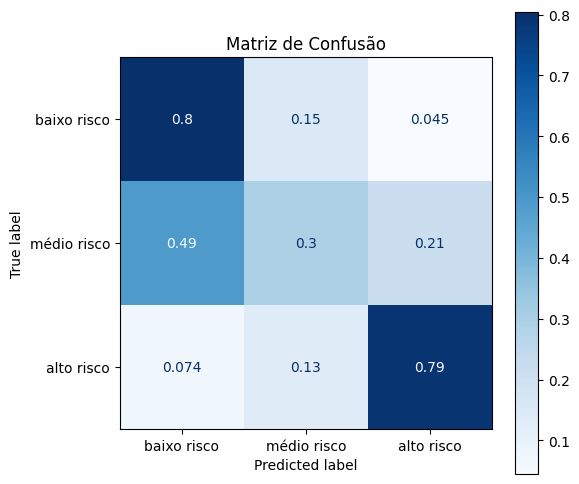

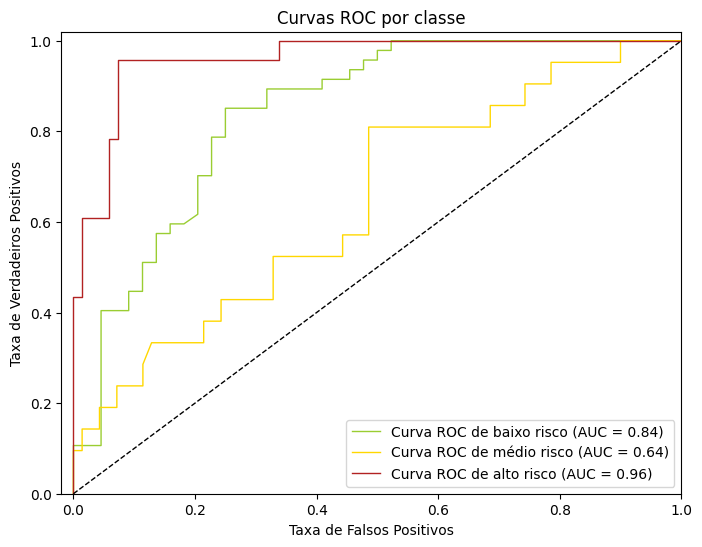

AUC geral: 0.80 ± 0.03


In [ ]:
# EXIBIÇÃO DAS MÉTRICAS
print('== Resultados Gerais ==')
print(f'Acurácia: {np.array(accuracy_history).mean():.2f} ± {np.array(accuracy_history).std():.2f}')
print(f'F1 Weighted: {np.array(f1_weighted_history).mean():.2f} ± {np.array(f1_weighted_history).std():.2f}')
print(f'F1 Macro: {np.array(f1_macro_history).mean():.2f} ± {np.array(f1_macro_history).std():.2f}')
print(f'Precision: {np.array(precision_macro_history).mean():.2f} ± {np.array(precision_macro_history).std():.2f}')
print(f'Recall: {np.array(recall_macro_history).mean():.2f} ± {np.array(recall_macro_history).std():.2f}')
print()
print('== Resultados por Classe ==')
for i in range(0, n_classes):
  print(f'Precision da classe {nome_classes[i]}: {np.array(precision_history).mean(axis=0)[i]:.2f} ± {np.array(precision_history).std(axis=0)[i]:.2f}')
print()
for i in range(0, n_classes):
  print(f'Recall da classe {nome_classes[i]}: {np.array(recall_history).mean(axis=0)[i]:.2f} ± {np.array(recall_history).std(axis=0)[i]:.2f}')
print()
for i in range(0, n_classes):
  print(f'F1 da classe {nome_classes[i]}: {np.array(f1_history).mean(axis=0)[i]:.2f} ± {np.array(f1_history).std(axis=0)[i]:.2f}')
print()

# EXIBIÇÃO DA MATRIZ DE CONFUSÃO
fig, ax = plt.subplots(figsize=(6, 6))
ax.set_title('Matriz de Confusão')
# Criação da matriz de confusão a partir da média obtida
cf_matrix = np.array(cf_matrix_history).mean(axis=0)
cm = ConfusionMatrixDisplay(confusion_matrix = cf_matrix, display_labels = nome_classes)
# Plotando a matriz de confusão
ax = cm.plot(ax=ax, cmap = 'Blues')

# EXIBIÇÃO DA CURVA ROC E SUA AUC
# Calculando fpr, tpr e auc para cada classe
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
  fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
  roc_auc[i] = auc(fpr[i], tpr[i])

# Plotagem
plt.figure(figsize=(8, 6))
for i in range(0, n_classes):
  plt.plot(fpr[i], tpr[i], color = paleta[i], label = f'Curva ROC de {nome_classes[i]} (AUC = {roc_auc[i]:.2f})', lw = 1)

plt.plot([0, 1], [0, 1], 'k--', lw = 1)
plt.xlabel('Taxa de Falsos Positivos')
plt.xlim([-0.02, 1.0])
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.ylim([0.0, 1.02])
plt.title('Curvas ROC por classe')
plt.legend(loc="lower right")
plt.show()
print(f'AUC geral: {np.array(auc_history).mean():.2f} ± {np.array(auc_history).std():.2f}')

## Validação K-Fold #2

In [ ]:
# TREINO E VALIDAÇÃO CRUZADA K-FOLD
# Hiperparâmetros para teste (os melhores do grid hold-out)
param_grid = {
    'model__hidden1': [h1],
    'model__hidden2': [h2],
    'model__hidden3': [h3],
    'model__dropout1': [dp1],
    'model__dropout2': [dp2],
    'model__dropout3': [dp3],
    'model__activation': [act],
    'model__learning_rate': [lr],
    'batch_size': [bs]
}

# Definição do Eraly Stopping
callback_KFold = tf.keras.callbacks.EarlyStopping(monitor = 'accuracy', patience = 20, restore_best_weights = True)

# Criar classificador
clf = KerasClassifier(
    model = build_model,
    callbacks = callback_KFold,
    epochs = 300,
    verbose = 0
)

# Lista para armazenar os resultados
results = []

# Aplicar GridSearchCV para K = 2, 3, ..., 5
for i in range(1, 5):
  K = i+1
  print(f'Validação K-Fold com {K} folds em andamento...')
  # Treinando o modelo no K-Fold
  grid = GridSearchCV(estimator = clf, param_grid = param_grid, scoring = 'accuracy', cv = K, verbose = 0)
  grid_result = grid.fit(X_train, y_train)
  y_pred = grid.predict(X_test)
  results.append(accuracy_score(y_test, y_pred))
  print('Concluida.')

Validação K-Fold com 2 folds em andamento...
Concluida.
Validação K-Fold com 3 folds em andamento...


Concluida.
Validação K-Fold com 4 folds em andamento...
Concluida.
Validação K-Fold com 5 folds em andamento...
Concluida.


In [ ]:
# Exibindo todas as acurácias
for i in range(1, 5):
  print(f'{i+1}-Fold, acurácia:', results[i-1])
# Exibindo o melhor K e sua acurácia
print(f'Melhor K = {results.index(max(results)) + 2} com acurácia = {max(results)}')

2-Fold, acurácia: 0.6153846153846154
3-Fold, acurácia: 0.6263736263736264
4-Fold, acurácia: 0.6373626373626373
5-Fold, acurácia: 0.6263736263736264
Melhor K = 4 com acurácia = 0.6373626373626373


In [ ]:
# AVALIAR 10x O MELHOR K DA VALIDAÇÃO K-FOLD
K = results.index(max(results)) + 2

# Definição do Eraly Stopping
callback_KFold = tf.keras.callbacks.EarlyStopping(monitor = 'accuracy', patience = 20, restore_best_weights = True)

# Criar classificador
clf = KerasClassifier(
    model = build_model,
    callbacks = callback_KFold,
    epochs = 300,
    verbose = 0
)

classes = [0, 1, 2]
nome_classes = ['baixo risco', 'médio risco', 'alto risco']
n_classes = len(nome_classes)

cf_matrix_history = list()
accuracy_history = list()
precision_history = list()
precision_macro_history = list()
recall_history = list()
recall_macro_history = list()
f1_history = list()
f1_weighted_history = list()
f1_macro_history = list()
auc_history = list()

count = 0
for i in (0, 1, 2, 5, 10, 12, 123, 1234, 12345, 42):
  count += 1

  # Redefinindo os conjuntos de treino e teste
  ''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''
  _, X_train, X_test, y_train, y_test = func_data_3(random_state = i, output = False) # !!! defina novamente o dataset a ser utilizado !!!
  ''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''

  # Treinando o modelo
  grid = GridSearchCV(estimator = clf, param_grid = param_grid, scoring = 'accuracy', cv = K, verbose = 0)
  grid_result = grid.fit(X_train, y_train)

  # Salvando os valores de acurácia geral e precision, recall e f1 de cada classe
  y_pred = grid.predict(X_test)

  # salvando a matriz de confusão
  cm = confusion_matrix(y_test, y_pred)
  cm = pd.DataFrame(cm, index = nome_classes, columns = nome_classes)
  cm = cm.div(cm.sum(axis = 1), axis = 0) # normalizando a matriz de confusão
  cf_matrix_history.append(cm)

  # salvando a acurácia
  accuracy = accuracy_score(y_test, y_pred)
  accuracy_history.append(accuracy)

  # salvando a precisão de cada classe e a macro
  precision = precision_score(y_test, y_pred, average = None, zero_division = 0)
  precision_history.append(precision)
  precision = precision_score(y_test, y_pred, average = 'macro', zero_division = 0)
  precision_macro_history.append(precision)

  # salvando a recall de cada classe e a macro
  recall = recall_score(y_test, y_pred, average = None, zero_division = 0)
  recall_history.append(recall)
  recall = recall_score(y_test, y_pred, average = 'macro', zero_division = 0)
  recall_macro_history.append(recall)

  # salvando o f1-score de cada classe, o macro e o weighted
  f1 = f1_score(y_test, y_pred, average = None, zero_division = 0)
  f1_history.append(f1)
  f1 = f1_score(y_test, y_pred, average = 'weighted', zero_division = 0)
  f1_weighted_history.append(f1)
  f1 = f1_score(y_test, y_pred, average = 'macro', zero_division = 0)
  f1_macro_history.append(f1)

  # salvando a média auc macro
  y_score = final_model.predict(X_test) # Previsões
  y_test_bin = preprocessing.label_binarize(y_test, classes = classes) # Binarizendo as classes verdadeiras
  auc_history.append(roc_auc_score(y_test_bin, y_score, average = 'macro'))

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


== Resultados Gerais ==
Acurácia: 0.64 ± 0.04
F1 Weighted: 0.63 ± 0.03
F1 Macro: 0.58 ± 0.03
Precision: 0.58 ± 0.03
Recall: 0.59 ± 0.03

== Resultados por Classe ==
Precision da classe baixo risco: 0.75 ± 0.04
Precision da classe médio risco: 0.30 ± 0.07
Precision da classe alto risco: 0.69 ± 0.06

Recall da classe baixo risco: 0.74 ± 0.07
Recall da classe médio risco: 0.27 ± 0.08
Recall da classe alto risco: 0.77 ± 0.10

F1 da classe baixo risco: 0.74 ± 0.05
F1 da classe médio risco: 0.28 ± 0.07
F1 da classe alto risco: 0.72 ± 0.05



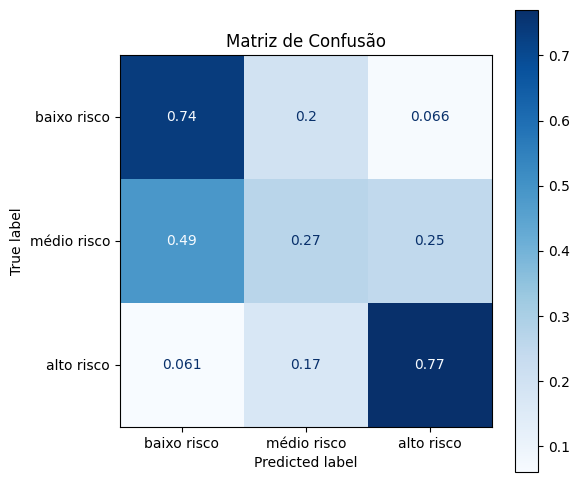

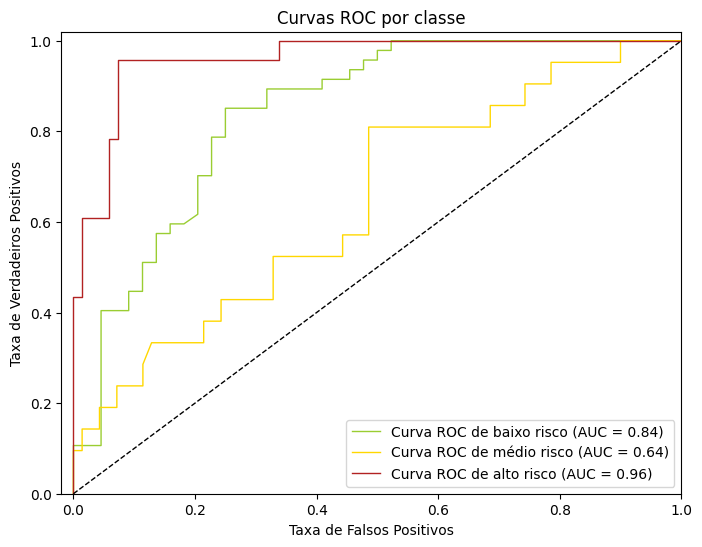

AUC geral: 0.81 ± 0.02


In [ ]:
# EXIBIÇÃO DAS MÉTRICAS
print('== Resultados Gerais ==')
print(f'Acurácia: {np.array(accuracy_history).mean():.2f} ± {np.array(accuracy_history).std():.2f}')
print(f'F1 Weighted: {np.array(f1_weighted_history).mean():.2f} ± {np.array(f1_weighted_history).std():.2f}')
print(f'F1 Macro: {np.array(f1_macro_history).mean():.2f} ± {np.array(f1_macro_history).std():.2f}')
print(f'Precision: {np.array(precision_macro_history).mean():.2f} ± {np.array(precision_macro_history).std():.2f}')
print(f'Recall: {np.array(recall_macro_history).mean():.2f} ± {np.array(recall_macro_history).std():.2f}')
print()
print('== Resultados por Classe ==')
for i in range(0, n_classes):
  print(f'Precision da classe {nome_classes[i]}: {np.array(precision_history).mean(axis=0)[i]:.2f} ± {np.array(precision_history).std(axis=0)[i]:.2f}')
print()
for i in range(0, n_classes):
  print(f'Recall da classe {nome_classes[i]}: {np.array(recall_history).mean(axis=0)[i]:.2f} ± {np.array(recall_history).std(axis=0)[i]:.2f}')
print()
for i in range(0, n_classes):
  print(f'F1 da classe {nome_classes[i]}: {np.array(f1_history).mean(axis=0)[i]:.2f} ± {np.array(f1_history).std(axis=0)[i]:.2f}')
print()

# EXIBIÇÃO DA MATRIZ DE CONFUSÃO
fig, ax = plt.subplots(figsize=(6, 6))
ax.set_title('Matriz de Confusão')
# Criação da matriz de confusão a partir da média obtida
cf_matrix = np.array(cf_matrix_history).mean(axis=0)
cm = ConfusionMatrixDisplay(confusion_matrix = cf_matrix, display_labels = nome_classes)
# Plotando a matriz de confusão
ax = cm.plot(ax=ax, cmap = 'Blues')

# EXIBIÇÃO DA CURVA ROC E SUA AUC
# Calculando fpr, tpr e auc para cada classe
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
  fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
  roc_auc[i] = auc(fpr[i], tpr[i])

# Plotagem
plt.figure(figsize=(8, 6))
for i in range(0, n_classes):
  plt.plot(fpr[i], tpr[i], color = paleta[i], label = f'Curva ROC de {nome_classes[i]} (AUC = {roc_auc[i]:.2f})', lw = 1)

plt.plot([0, 1], [0, 1], 'k--', lw = 1)
plt.xlabel('Taxa de Falsos Positivos')
plt.xlim([-0.02, 1.0])
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.ylim([0.0, 1.02])
plt.title('Curvas ROC por classe')
plt.legend(loc="lower right")
plt.show()
print(f'AUC geral: {np.array(auc_history).mean():.2f} ± {np.array(auc_history).std():.2f}')

## Gráficos SHAP

ExactExplainer explainer: 92it [00:14,  6.33it/s]                        


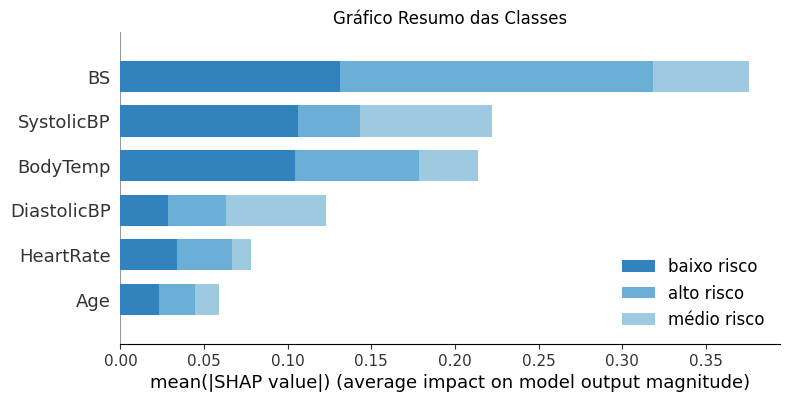

=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x


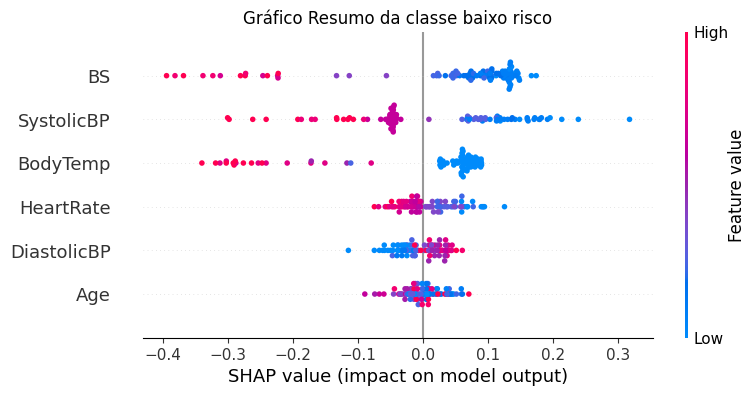

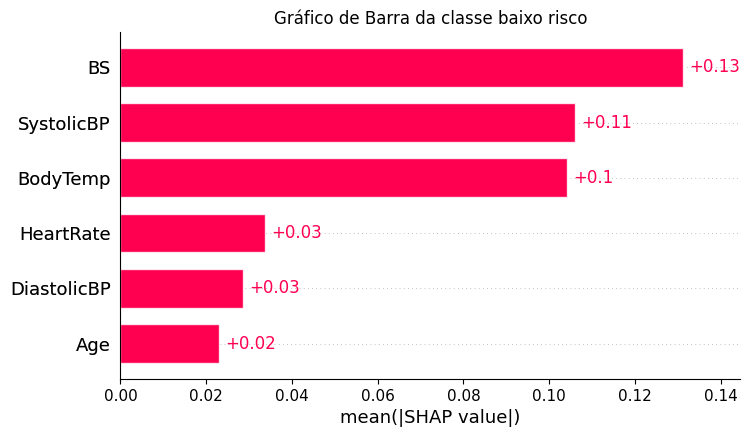

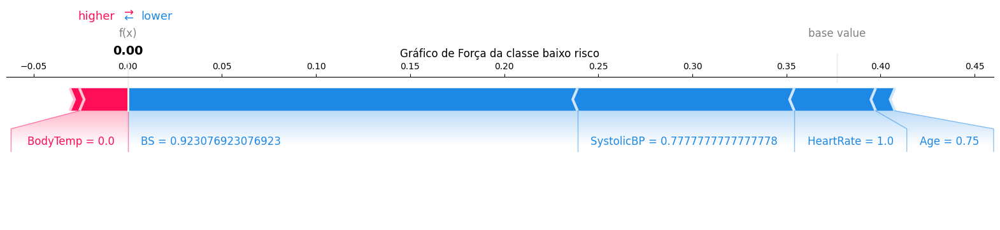

=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x


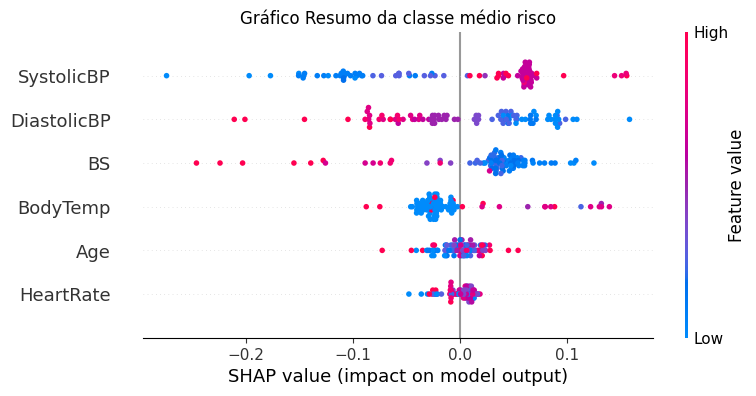

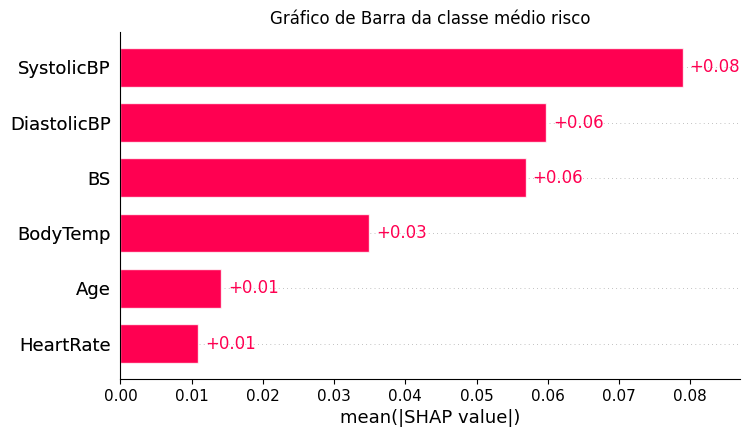

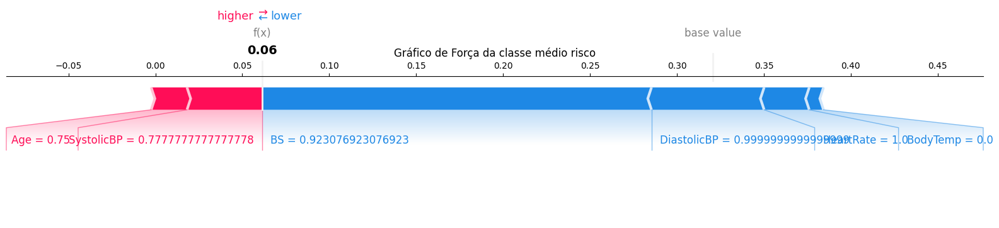

=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x


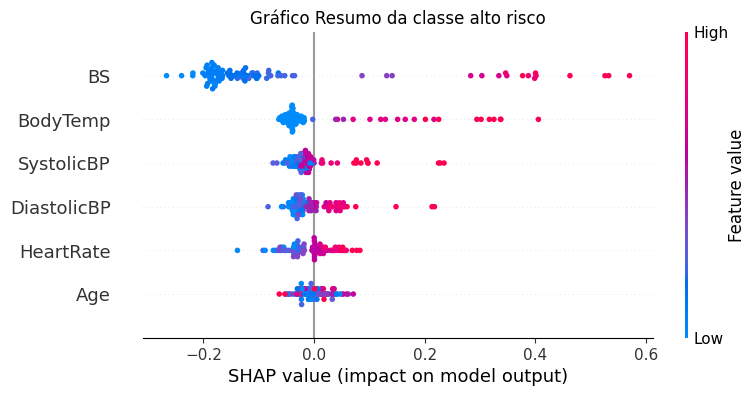

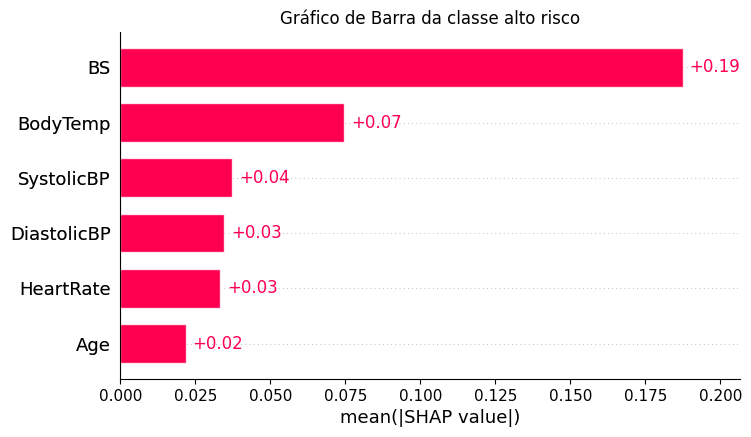

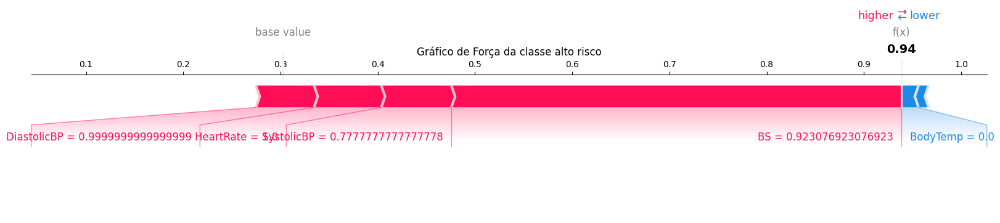

=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x


In [ ]:
# EXIBIÇÃO DOS GRÁFICOS SHAP
class_names = ['baixo risco', 'médio risco', 'alto risco']
explainer = shap.Explainer(final_model, X_train)
shap_values = explainer(X_test)

# Gráfico resumo geral
shap.summary_plot(shap_values, X_test, feature_names = np.array(data_.columns[:6]), plot_type = 'bar', show = False, class_names = class_names, color = plt.get_cmap("tab20c"))
plt.title("Gráfico Resumo das Classes")
plt.show()
print('=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x')

# Gráficos de resumo, barra e de força de cada classe
instance_index = 0 # Seleciona a instancia a ser explicada (exemplo: primeira linha do teste (X_test[0]))
for i in range(0, len(class_names)):
  shap.summary_plot(shap_values[:, :, i], X_test, feature_names = np.array(data_.columns[:6]), show = False) # quanto mais para a direita mais a influencia para a classe i
  plt.title(f'Gráfico Resumo da classe {class_names[i]}')
  plt.show()

  shap.plots.bar(shap.Explanation(values = shap_values[:, :, i], base_values = shap_values.base_values, data = X_test, feature_names = np.array(data_.columns[:6])), max_display = 6, show = False)
  plt.title(f'Gráfico de Barra da classe {class_names[i]}')
  plt.show()

  # Escolhe a classe que você quer explicar (por exemplo, a classe 0)
  class_to_explain = i

  # SHAP values para a instância e classe escolhida
  shap_values_instance_class = shap_values[instance_index, :, class_to_explain]

  # Base value (expected_value) para a classe escolhida
  base_value_for_class = shap_values.base_values[class_to_explain]

  # Valores das features para a instância escolhida
  feature_values_instance = X_test[instance_index]

  explanation_for_instance = shap.Explanation(
      values = shap_values_instance_class,
      base_values = base_value_for_class,
      data = feature_values_instance,
      feature_names = np.array(data_.columns[:6])
  )
  shap.plots.force(explanation_for_instance, matplotlib = True, show = False)
  plt.title(f'Gráfico de Força da classe {class_names[i]}')
  plt.show()
  print('=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x')

# **Random Forest**

## Hold-Out #1

In [ ]:
''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''
_, X_train, X_test, y_train, y_test = func_data_3(output = False) # !!! escolha o dataset alterando o número após o func_data_ !!!
''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''

# TREINO E VALIDAÇÃO HOLD-OUT
# Hiperparâmetros para teste
n_estimators_options = [100, 200, 300, 500, 800, 1000] # Número de árvores na floresta
max_depth_options = [None, 10, 15, 20, 25, 30, 50] # Profundidade máxima da árvore (None significa nós expandidos até que todas as folhas sejam puras ou contenham menos min_samples_split amostras)
min_samples_split_options = [2, 5, 8, 10] # Número mínimo de amostras necessárias para dividir um nó interno
min_samples_leaf_options = [1, 2, 5, 10] # Número mínimo de amostras necessárias para estar em um nó folha
max_features_options = ['sqrt', 'log2', 1.0] # Número de recursos a serem considerados ao procurar a melhor divisão ('sqrt' é geralmente padrão e bom)
bootstrap_options = [True, False] # Se amostras de bootstrap são usadas ao construir árvores

# Lista para armazenar os resultados
results = []

# EXECUÇÃO DO GRID SEARCH
for n_est, m_depth, min_split, min_leaf, max_feat, bootstrap in product(n_estimators_options, max_depth_options, min_samples_split_options, min_samples_leaf_options, max_features_options, bootstrap_options):
    print(f'Testando: n_estimators = {n_est}, max_depth = {m_depth}, min_samples_split = {min_split}, min_samples_leaf = {min_leaf}, max_features = {max_feat}, bootstrap = {bootstrap}')
    # Instanciando o modelo com os hiperparâmetros atuais
    model = RandomForestClassifier(n_estimators = n_est, max_depth = m_depth, min_samples_split = min_split, min_samples_leaf = min_leaf, max_features = max_feat, bootstrap = bootstrap)
    # Treina o modelo
    model.fit(X_train, y_train)

    # Faz previsões no conjunto de teste
    y_pred = model.predict(X_test)

    # Calcula a acurácia
    acc = accuracy_score(y_test, y_pred)
    results.append(((n_est, m_depth, min_split, min_leaf, max_feat, bootstrap), acc))

Testando: n_estimators = 100, max_depth = None, min_samples_split = 2, min_samples_leaf = 1, max_features = sqrt, bootstrap = True
Testando: n_estimators = 100, max_depth = None, min_samples_split = 2, min_samples_leaf = 1, max_features = sqrt, bootstrap = False
Testando: n_estimators = 100, max_depth = None, min_samples_split = 2, min_samples_leaf = 1, max_features = log2, bootstrap = True
Testando: n_estimators = 100, max_depth = None, min_samples_split = 2, min_samples_leaf = 1, max_features = log2, bootstrap = False
Testando: n_estimators = 100, max_depth = None, min_samples_split = 2, min_samples_leaf = 1, max_features = 1.0, bootstrap = True
Testando: n_estimators = 100, max_depth = None, min_samples_split = 2, min_samples_leaf = 1, max_features = 1.0, bootstrap = False
Testando: n_estimators = 100, max_depth = None, min_samples_split = 2, min_samples_leaf = 2, max_features = sqrt, bootstrap = True
Testando: n_estimators = 100, max_depth = None, min_samples_split = 2, min_samples

In [ ]:
# OBTER O MELHOR MODELO DA VALIDAÇÃO HOLD-OUT
best_model = max(results, key=lambda x: x[1])
n_est, m_depth, min_split, min_leaf, max_feat, bootstrap = best_model[0]
print(f'Melhor modelo: n_estimators = {n_est}, max_depth = {m_depth}, min_samples_split = {min_split}, min_samples_leaf = {min_leaf}, max_features = {max_feat}, bootstrap = {bootstrap}')

Melhor modelo: n_estimators = 100, max_depth = 10, min_samples_split = 2, min_samples_leaf = 5, max_features = 1.0, bootstrap = False


In [ ]:
# AVALIAR 10x O MELHOR MODELO DA VALIDAÇÃO HOLD-OUT
final_model = RandomForestClassifier(n_estimators = n_est, max_depth = m_depth, min_samples_split = min_split, min_samples_leaf = min_leaf, max_features = max_feat, bootstrap = bootstrap)

classes = [0, 1, 2]
nome_classes = ['baixo risco', 'médio risco', 'alto risco']
n_classes = len(nome_classes)

cf_matrix_history = list()
accuracy_history = list()
precision_history = list()
precision_macro_history = list()
recall_history = list()
recall_macro_history = list()
f1_history = list()
f1_weighted_history = list()
f1_macro_history = list()
auc_history = list()

count = 0
for i in (0, 1, 2, 5, 10, 12, 123, 1234, 12345, 42):
  count += 1
  # Redefinindo os conjuntos de treino e teste
  ''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''
  data_, X_train, X_test, y_train, y_test = func_data_3(random_state = i, output = False) # !!! defina novamente o dataset a ser utilizado !!!
  ''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''

  history = final_model.fit(X_train, y_train)

  # Salvando os valores de acurácia geral e precision, recall e f1 de cada classe
  y_pred = model.predict(X_test)

  # salvando a matriz de confusão
  cm = confusion_matrix(y_test, y_pred)
  cm = pd.DataFrame(cm, index = nome_classes, columns = nome_classes)
  cm = cm.div(cm.sum(axis = 1), axis = 0) # normalizando a matriz de confusão
  cf_matrix_history.append(cm)

  # salvando a acurácia
  accuracy = accuracy_score(y_test, y_pred)
  accuracy_history.append(accuracy)

  # salvando a precisão de cada classe e a macro
  precision = precision_score(y_test, y_pred, average = None, zero_division = 0)
  precision_history.append(precision)
  precision = precision_score(y_test, y_pred, average = 'macro', zero_division = 0)
  precision_macro_history.append(precision)

  # salvando a recall de cada classe e a macro
  recall = recall_score(y_test, y_pred, average = None, zero_division = 0)
  recall_history.append(recall)
  recall = recall_score(y_test, y_pred, average = 'macro', zero_division = 0)
  recall_macro_history.append(recall)

  # salvando o f1-score de cada classe, o macro e o weighted
  f1 = f1_score(y_test, y_pred, average = None, zero_division = 0)
  f1_history.append(f1)
  f1 = f1_score(y_test, y_pred, average = 'weighted', zero_division = 0)
  f1_weighted_history.append(f1)
  f1 = f1_score(y_test, y_pred, average = 'macro', zero_division = 0)
  f1_macro_history.append(f1)

  # salvando a média auc macro
  y_score = final_model.predict_proba(X_test) # Previsões de probabilidade
  y_test_bin = preprocessing.label_binarize(y_test, classes = classes) # Binarizendo as classes verdadeiras
  auc_history.append(roc_auc_score(y_test_bin, y_score, average = 'macro'))

== Resultados Gerais ==
Acurácia: 0.65 ± 0.10
F1 Weighted: 0.65 ± 0.11
F1 Macro: 0.63 ± 0.10
Precision: 0.66 ± 0.05
Recall: 0.65 ± 0.08

== Resultados por Classe ==
Precision da classe baixo risco: 0.82 ± 0.04
Precision da classe médio risco: 0.47 ± 0.09
Precision da classe alto risco: 0.69 ± 0.19

Recall da classe baixo risco: 0.63 ± 0.17
Recall da classe médio risco: 0.53 ± 0.12
Recall da classe alto risco: 0.79 ± 0.07

F1 da classe baixo risco: 0.70 ± 0.13
F1 da classe médio risco: 0.48 ± 0.07
F1 da classe alto risco: 0.72 ± 0.12



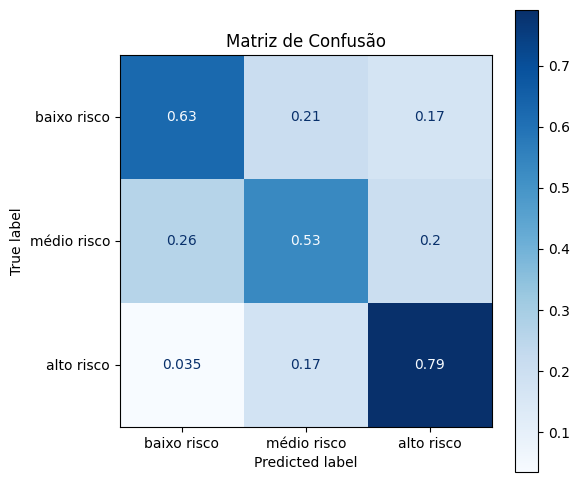

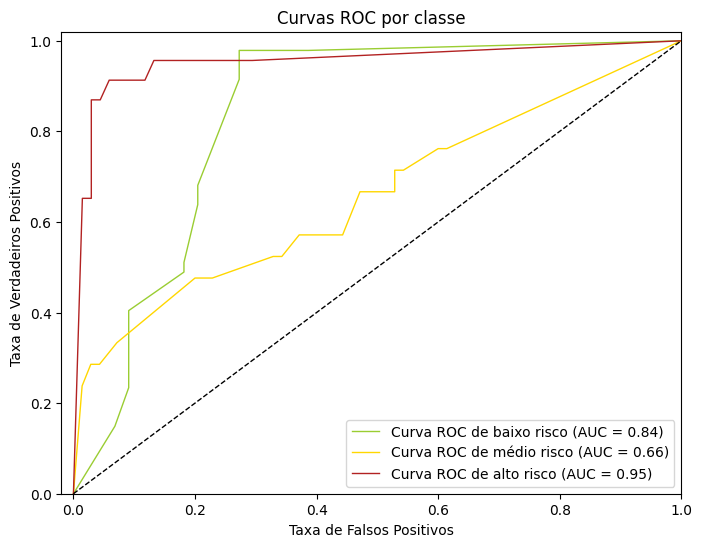

AUC geral: 0.76 ± 0.05


In [ ]:
# EXIBIÇÃO DAS MÉTRICAS
print('== Resultados Gerais ==')
print(f'Acurácia: {np.array(accuracy_history).mean():.2f} ± {np.array(accuracy_history).std():.2f}')
print(f'F1 Weighted: {np.array(f1_weighted_history).mean():.2f} ± {np.array(f1_weighted_history).std():.2f}')
print(f'F1 Macro: {np.array(f1_macro_history).mean():.2f} ± {np.array(f1_macro_history).std():.2f}')
print(f'Precision: {np.array(precision_macro_history).mean():.2f} ± {np.array(precision_macro_history).std():.2f}')
print(f'Recall: {np.array(recall_macro_history).mean():.2f} ± {np.array(recall_macro_history).std():.2f}')
print()
print('== Resultados por Classe ==')
for i in range(0, n_classes):
  print(f'Precision da classe {nome_classes[i]}: {np.array(precision_history).mean(axis=0)[i]:.2f} ± {np.array(precision_history).std(axis=0)[i]:.2f}')
print()
for i in range(0, n_classes):
  print(f'Recall da classe {nome_classes[i]}: {np.array(recall_history).mean(axis=0)[i]:.2f} ± {np.array(recall_history).std(axis=0)[i]:.2f}')
print()
for i in range(0, n_classes):
  print(f'F1 da classe {nome_classes[i]}: {np.array(f1_history).mean(axis=0)[i]:.2f} ± {np.array(f1_history).std(axis=0)[i]:.2f}')
print()

# EXIBIÇÃO DA MATRIZ DE CONFUSÃO
fig, ax = plt.subplots(figsize=(6, 6))
ax.set_title('Matriz de Confusão')
# Criação da matriz de confusão a partir da média obtida
cf_matrix = np.array(cf_matrix_history).mean(axis=0)
cm = ConfusionMatrixDisplay(confusion_matrix = cf_matrix, display_labels = nome_classes)
# Plotando a matriz de confusão
ax = cm.plot(ax=ax, cmap = 'Blues')

# EXIBIÇÃO DA CURVA ROC E SUA AUC
# Calculando fpr, tpr e auc para cada classe
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
  fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
  roc_auc[i] = auc(fpr[i], tpr[i])

# Plotagem
plt.figure(figsize=(8, 6))
for i in range(0, n_classes):
  plt.plot(fpr[i], tpr[i], color = paleta[i], label = f'Curva ROC de {nome_classes[i]} (AUC = {roc_auc[i]:.2f})', lw = 1)

plt.plot([0, 1], [0, 1], 'k--', lw = 1)
plt.xlabel('Taxa de Falsos Positivos')
plt.xlim([-0.02, 1.0])
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.ylim([0.0, 1.02])
plt.title('Curvas ROC por classe')
plt.legend(loc="lower right")
plt.show()
print(f'AUC geral: {np.array(auc_history).mean():.2f} ± {np.array(auc_history).std():.2f}')

## Validação K-Fold #2

In [ ]:
# TREINO E VALIDAÇÃO CRUZADA K-FOLD
# Hiperparâmetros para teste (os melhores do grid hold-out)
param_grid = {
    'n_estimators': [n_est],
    'max_depth': [m_depth],
    'min_samples_split': [min_split],
    'min_samples_leaf': [min_leaf],
    'max_features': [max_feat],
    'bootstrap': [bootstrap]
    }

# Lista para armazenar os resultados
results = []

# Aplicar GridSearchCV para K = 2, 3, ..., 5
for i in range(1, 5):
  K = i+1
  print(f'Validação K-Fold com {K} folds em andamento...')
  grid = GridSearchCV(estimator = RandomForestClassifier(), param_grid = param_grid, scoring = 'accuracy', cv = K, verbose = 0)
  grid_result = grid.fit(X_train, y_train)
  y_pred = grid.predict(X_test)
  results.append(accuracy_score(y_test, y_pred))
  print('Concluida.')

Validação K-Fold com 2 folds em andamento...
Concluida.
Validação K-Fold com 3 folds em andamento...
Concluida.
Validação K-Fold com 4 folds em andamento...
Concluida.
Validação K-Fold com 5 folds em andamento...
Concluida.


In [ ]:
# Exibindo todas as acurácias
for i in range(1, 5):
  print(f'{i+1}-Fold, acurácia:', results[i-1])
# Exibindo o melhor K e sua acurácia
print(f'Melhor K = {results.index(max(results)) + 2} com acurácia = {max(results)}')

2-Fold, acurácia: 0.7692307692307693
3-Fold, acurácia: 0.7692307692307693
4-Fold, acurácia: 0.7802197802197802
5-Fold, acurácia: 0.7692307692307693
Melhor K = 4 com acurácia = 0.7802197802197802


In [ ]:
# AVALIAR 10x O MELHOR K DA VALIDAÇÃO K-FOLD
K = results.index(max(results)) + 2

classes = [0, 1, 2]
nome_classes = ['baixo risco', 'médio risco', 'alto risco']
n_classes = len(nome_classes)

cf_matrix_history = list()
accuracy_history = list()
precision_history = list()
precision_macro_history = list()
recall_history = list()
recall_macro_history = list()
f1_history = list()
f1_weighted_history = list()
f1_macro_history = list()
auc_history = list()

count = 0
for i in (0, 1, 2, 5, 10, 12, 123, 1234, 12345, 42):
  count += 1

  # Redefinindo os conjuntos de treino e teste
  ''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''
  _, X_train, X_test, y_train, y_test = func_data_3(random_state = i, output = False) # !!! defina novamente o dataset a ser utilizado !!!
  ''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''

  # Treinando o modelo
  grid = GridSearchCV(estimator = RandomForestClassifier(), param_grid = param_grid, scoring = 'accuracy', cv = K, verbose = 0)
  grid_result = grid.fit(X_train, y_train)

  # Salvando os valores de acurácia geral e precision, recall e f1 de cada classe
  y_pred = grid.predict(X_test)

  # salvando a matriz de confusão
  cm = confusion_matrix(y_test, y_pred)
  cm = pd.DataFrame(cm, index = nome_classes, columns = nome_classes)
  cm = cm.div(cm.sum(axis = 1), axis = 0) # normalizando a matriz de confusão
  cf_matrix_history.append(cm)

  # salvando a acurácia
  accuracy = accuracy_score(y_test, y_pred)
  accuracy_history.append(accuracy)

  # salvando a precisão de cada classe e a macro
  precision = precision_score(y_test, y_pred, average = None, zero_division = 0)
  precision_history.append(precision)
  precision = precision_score(y_test, y_pred, average = 'macro', zero_division = 0)
  precision_macro_history.append(precision)

  # salvando a recall de cada classe e a macro
  recall = recall_score(y_test, y_pred, average = None, zero_division = 0)
  recall_history.append(recall)
  recall = recall_score(y_test, y_pred, average = 'macro', zero_division = 0)
  recall_macro_history.append(recall)

  # salvando o f1-score de cada classe, o macro e o weighted
  f1 = f1_score(y_test, y_pred, average = None, zero_division = 0)
  f1_history.append(f1)
  f1 = f1_score(y_test, y_pred, average = 'weighted', zero_division = 0)
  f1_weighted_history.append(f1)
  f1 = f1_score(y_test, y_pred, average = 'macro', zero_division = 0)
  f1_macro_history.append(f1)

  # salvando a média auc macro
  y_score = final_model.predict_proba(X_test) # Previsões
  y_test_bin = preprocessing.label_binarize(y_test, classes = classes) # Binarizendo as classes verdadeiras
  auc_history.append(roc_auc_score(y_test_bin, y_score, average = 'macro'))

== Resultados Gerais ==
Acurácia: 0.66 ± 0.07
F1 Weighted: 0.66 ± 0.06
F1 Macro: 0.63 ± 0.06
Precision: 0.64 ± 0.05
Recall: 0.63 ± 0.06

== Resultados por Classe ==
Precision da classe baixo risco: 0.76 ± 0.04
Precision da classe médio risco: 0.38 ± 0.09
Precision da classe alto risco: 0.78 ± 0.08

Recall da classe baixo risco: 0.74 ± 0.12
Recall da classe médio risco: 0.40 ± 0.10
Recall da classe alto risco: 0.74 ± 0.09

F1 da classe baixo risco: 0.75 ± 0.07
F1 da classe médio risco: 0.38 ± 0.07
F1 da classe alto risco: 0.75 ± 0.07



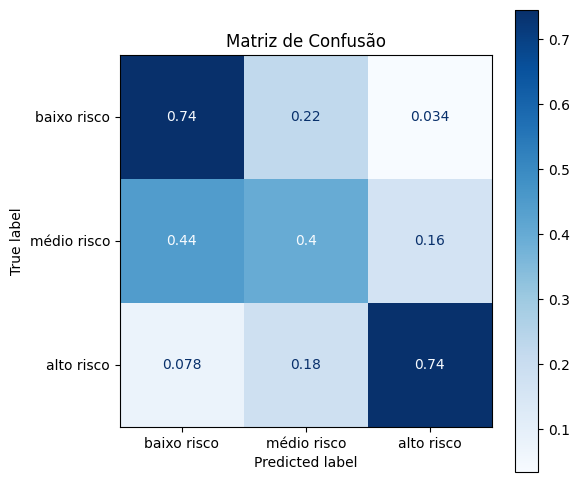

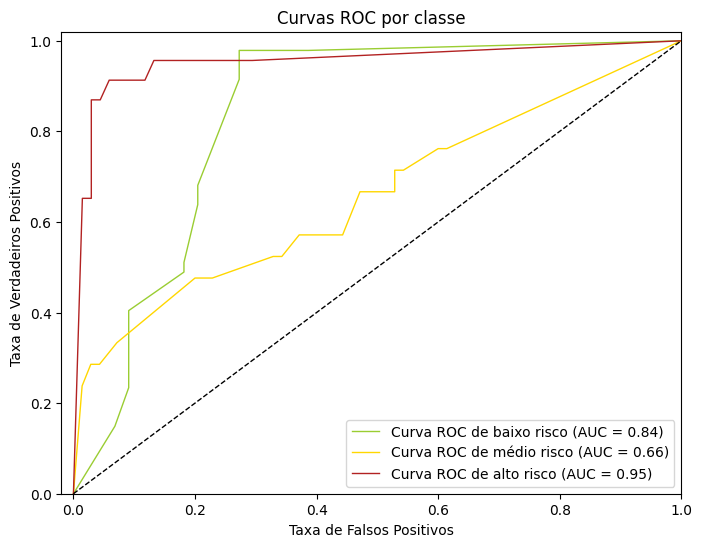

AUC geral: 0.83 ± 0.10


In [ ]:
# EXIBIÇÃO DAS MÉTRICAS
print('== Resultados Gerais ==')
print(f'Acurácia: {np.array(accuracy_history).mean():.2f} ± {np.array(accuracy_history).std():.2f}')
print(f'F1 Weighted: {np.array(f1_weighted_history).mean():.2f} ± {np.array(f1_weighted_history).std():.2f}')
print(f'F1 Macro: {np.array(f1_macro_history).mean():.2f} ± {np.array(f1_macro_history).std():.2f}')
print(f'Precision: {np.array(precision_macro_history).mean():.2f} ± {np.array(precision_macro_history).std():.2f}')
print(f'Recall: {np.array(recall_macro_history).mean():.2f} ± {np.array(recall_macro_history).std():.2f}')
print()
print('== Resultados por Classe ==')
for i in range(0, n_classes):
  print(f'Precision da classe {nome_classes[i]}: {np.array(precision_history).mean(axis=0)[i]:.2f} ± {np.array(precision_history).std(axis=0)[i]:.2f}')
print()
for i in range(0, n_classes):
  print(f'Recall da classe {nome_classes[i]}: {np.array(recall_history).mean(axis=0)[i]:.2f} ± {np.array(recall_history).std(axis=0)[i]:.2f}')
print()
for i in range(0, n_classes):
  print(f'F1 da classe {nome_classes[i]}: {np.array(f1_history).mean(axis=0)[i]:.2f} ± {np.array(f1_history).std(axis=0)[i]:.2f}')
print()

# EXIBIÇÃO DA MATRIZ DE CONFUSÃO
fig, ax = plt.subplots(figsize=(6, 6))
ax.set_title('Matriz de Confusão')
# Criação da matriz de confusão a partir da média obtida
cf_matrix = np.array(cf_matrix_history).mean(axis=0)
cm = ConfusionMatrixDisplay(confusion_matrix = cf_matrix, display_labels = nome_classes)
# Plotando a matriz de confusão
ax = cm.plot(ax=ax, cmap = 'Blues')

# EXIBIÇÃO DA CURVA ROC E SUA AUC
# Calculando fpr, tpr e auc para cada classe
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
  fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
  roc_auc[i] = auc(fpr[i], tpr[i])

# Plotagem
plt.figure(figsize=(8, 6))
for i in range(0, n_classes):
  plt.plot(fpr[i], tpr[i], color = paleta[i], label = f'Curva ROC de {nome_classes[i]} (AUC = {roc_auc[i]:.2f})', lw = 1)

plt.plot([0, 1], [0, 1], 'k--', lw = 1)
plt.xlabel('Taxa de Falsos Positivos')
plt.xlim([-0.02, 1.0])
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.ylim([0.0, 1.02])
plt.title('Curvas ROC por classe')
plt.legend(loc="lower right")
plt.show()
print(f'AUC geral: {np.array(auc_history).mean():.2f} ± {np.array(auc_history).std():.2f}')

## Gráficos SHAP

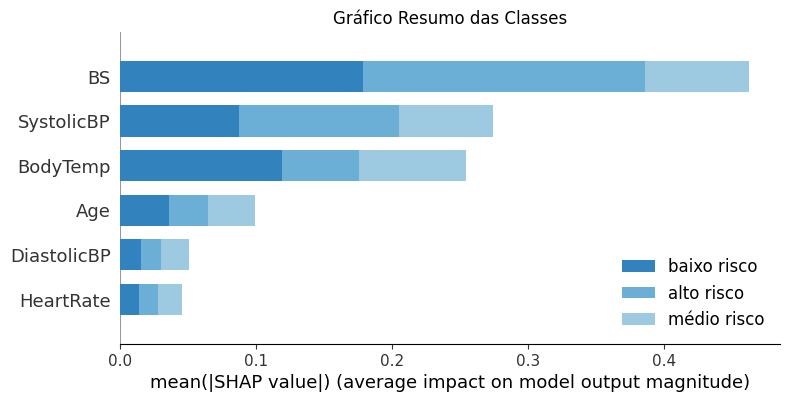

=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x


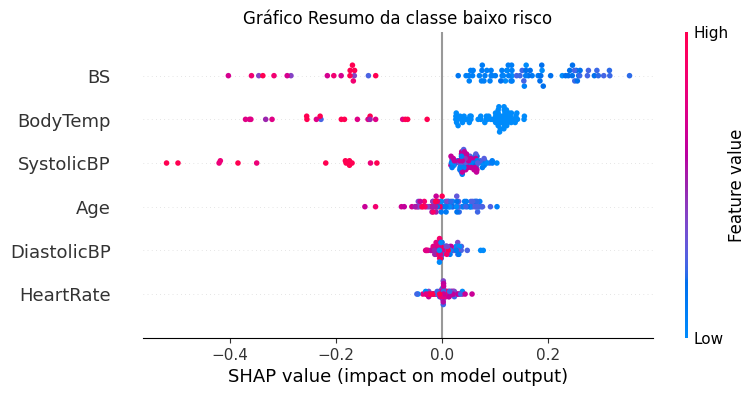

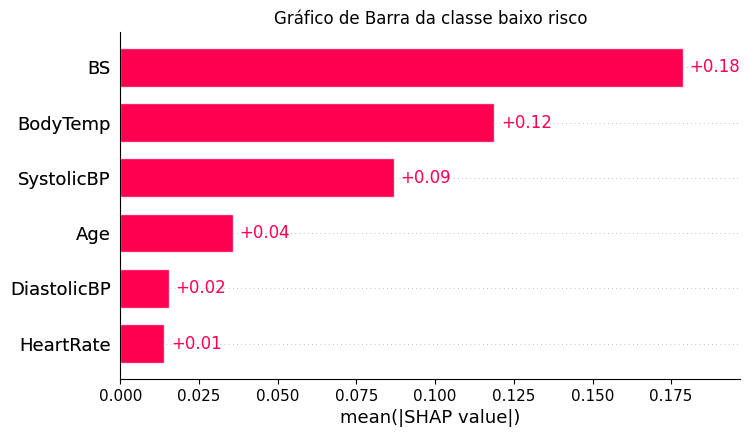

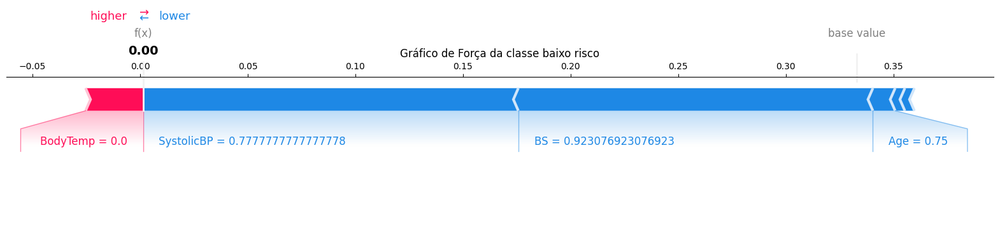

=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x


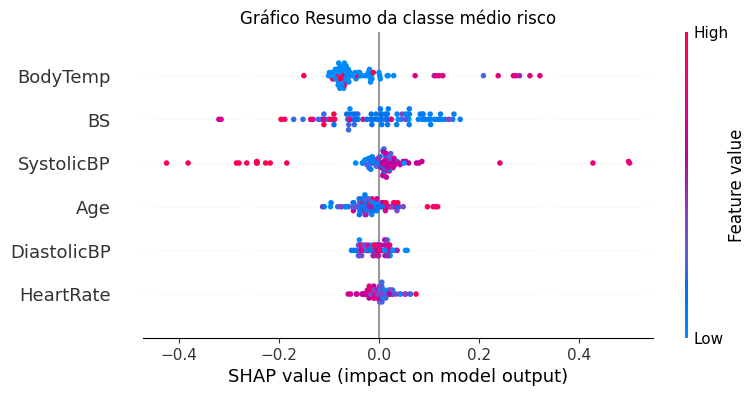

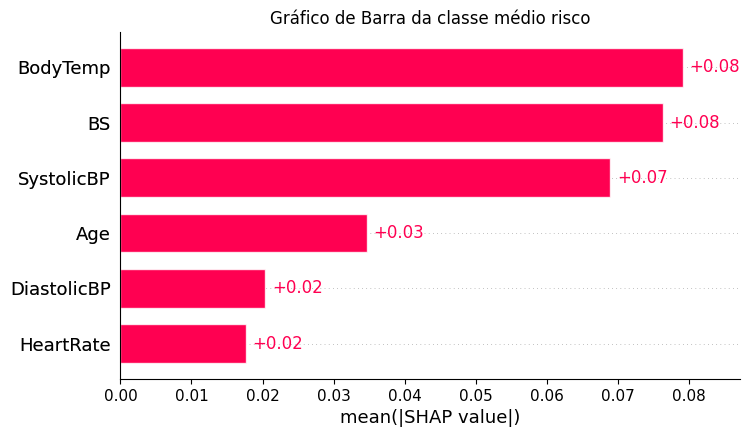

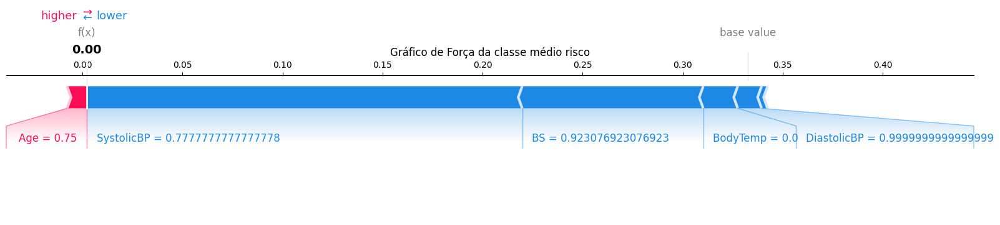

=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x


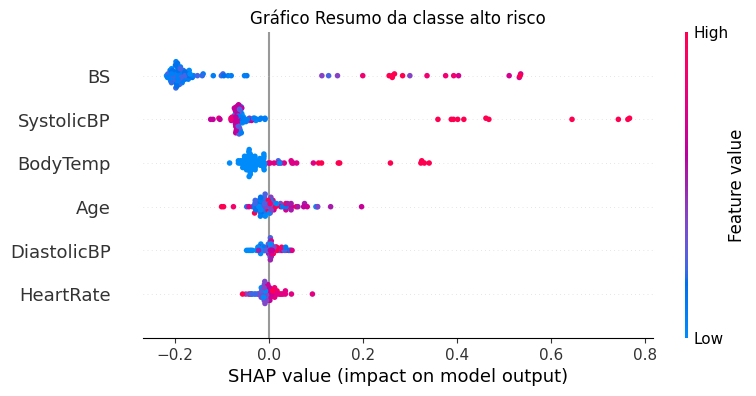

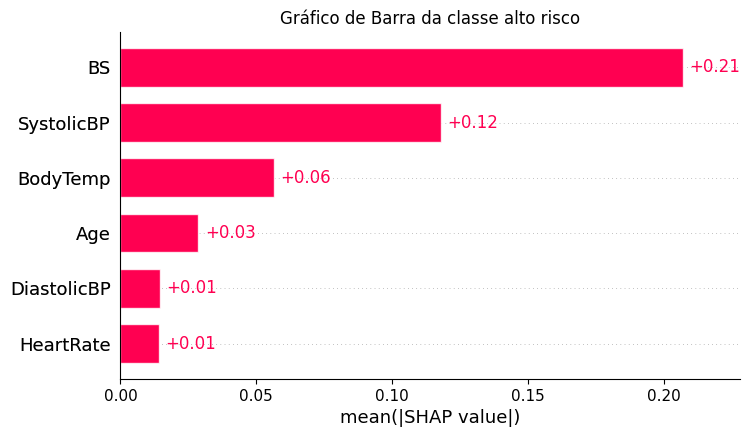

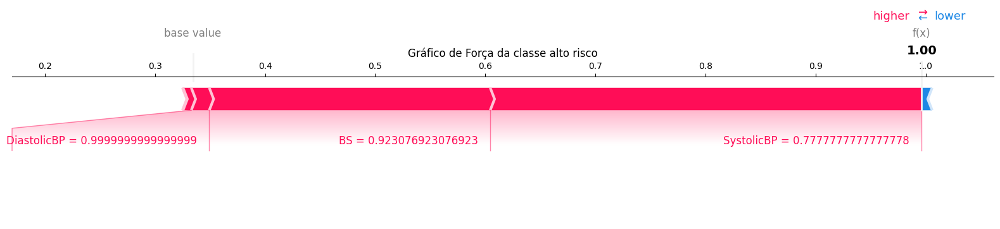

=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x


In [ ]:
# EXIBIÇÃO DOS GRÁFICOS SHAP
class_names = ['baixo risco', 'médio risco', 'alto risco']
explainer = shap.TreeExplainer(final_model)
shap_values = explainer(X_test)

# Gráfico resumo geral
shap.summary_plot(shap_values, X_test, feature_names = np.array(data_.columns[:6]), plot_type = 'bar', show = False, class_names = class_names, color = plt.get_cmap("tab20c"))
plt.title("Gráfico Resumo das Classes")
plt.show()
print('=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x')

# Gráficos de resumo, barra e de força de cada classe
instance_index = 0 # Seleciona a instancia a ser explicada (exemplo: primeira linha do teste (X_test[0]))
for i in range(0, len(class_names)):
  shap.summary_plot(shap_values[:, :, i], X_test, feature_names = np.array(data_.columns[:6]), show = False) # quanto mais para a direita mais a influencia para a classe i
  plt.title(f'Gráfico Resumo da classe {class_names[i]}')
  plt.show()

  shap.plots.bar(shap.Explanation(values = shap_values[:, :, i], base_values = shap_values.base_values, data = X_test, feature_names = np.array(data_.columns[:6])), max_display = 6, show = False)
  plt.title(f'Gráfico de Barra da classe {class_names[i]}')
  plt.show()

  # Escolhe a classe que você quer explicar (por exemplo, a classe 0)
  class_to_explain = i

  # SHAP values para a instância e classe escolhida
  shap_values_instance_class = shap_values[instance_index, :, class_to_explain]

  # Base value (expected_value) para a classe escolhida
  base_value_for_class = shap_values.base_values[class_to_explain]

  # Valores das features para a instância escolhida
  feature_values_instance = X_test[instance_index]

  explanation_for_instance = shap.Explanation(
      values = shap_values_instance_class,
      base_values = base_value_for_class,
      data = feature_values_instance,
      feature_names = np.array(data_.columns[:6])
  )
  shap.plots.force(explanation_for_instance, matplotlib = True, show = False)
  plt.title(f'Gráfico de Força da classe {class_names[i]}')
  plt.show()
  print('=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x')

# **Regressão Logística**

## Método Hold-Out #1

In [ ]:
# TREINO E VALIDAÇÃO HOLD-OUT
''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''
_, X_train, X_test, y_train, y_test = func_data_3(random_state = i, output = False) # !!! defina novamente o dataset a ser utilizado !!!
''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''

# Hiperparâmetros para teste
C_options = [0.01, 0.1, 1]
penalty_options = ['l1', 'l2', 'elasticnet']
solver_options = ['liblinear','lbfgs', 'sag', 'saga']
class_weight_options = [None, 'balanced'] # Novo parâmetro
l1_ratio_options = [0, 0.5, 1] # Novo parâmetro, relevante apenas para 'elasticnet'
max_iter_options = [1000] # Agora um array para manter a consistência com 'product'


# Lista para armazenar os resultados
results = []

# EXECUÇÃO DO GRID SEARCH
for C, penalty, solver, class_weight, l1_ratio, max_it in product(C_options, penalty_options, solver_options, class_weight_options, l1_ratio_options, max_iter_options):
    # 'elasticnet' penalty requer solver='saga'
    if penalty == 'elasticnet' and solver != 'saga':
        continue
    # 'l1_ratio' é usado SOMENTE com penalty='elasticnet'
    if penalty != 'elasticnet' and l1_ratio != l1_ratio_options[0]: # Pula se l1_ratio não for o valor padrão e penalty não for elasticnet
        continue
    if penalty == 'elasticnet' and l1_ratio is None: # elasticnet precisa de um l1_ratio
         continue # Se l1_ratio for None, e penalty for elasticnet, pula
    if penalty != 'elasticnet' and l1_ratio is not None and l1_ratio != 0:
        continue # Pula se l1_ratio for setado para algo diferente de 0/None e penalty não for elasticnet.

    # 'liblinear' suporta 'l1' e 'l2'
    if solver == 'liblinear' and penalty == 'elasticnet':
        continue # 'liblinear' não suporta 'elasticnet'

    # 'lbfgs', 'sag', 'newton-cg' suportam 'l2' e 'none'
    if solver in ['lbfgs', 'sag'] and penalty == 'l1':
        continue # Estes solvers não suportam 'l1'
    if solver in ['lbfgs', 'sag'] and penalty == 'elasticnet':
        continue # Estes solvers não suportam 'elasticnet'

    print(f'Testando: C={C}, penalty={penalty}, solver={solver}, class_weight={class_weight}, l1_ratio={l1_ratio}, max_iter={max_it}')

    # Instanciando o modelo Logistic Regression com os hiperparâmetros atuais
    model = LogisticRegression(C = C, penalty = penalty, solver = solver, class_weight = class_weight,
                                l1_ratio = l1_ratio if penalty == 'elasticnet' else None, # Passa l1_ratio apenas para elasticnet
                                max_iter = max_it)
    # Treina o modelo
    history = model.fit(X_train, y_train)

    # Faz previsões no conjunto de teste
    y_pred = model.predict(X_test)

    # Calcula a acurácia
    acc = accuracy_score(y_test, y_pred)
    results.append(((C, penalty, solver, class_weight, l1_ratio, max_it), acc))

Testando: C=0.01, penalty=l1, solver=liblinear, class_weight=None, l1_ratio=0, max_iter=1000
Testando: C=0.01, penalty=l1, solver=liblinear, class_weight=balanced, l1_ratio=0, max_iter=1000
Testando: C=0.01, penalty=l1, solver=saga, class_weight=None, l1_ratio=0, max_iter=1000
Testando: C=0.01, penalty=l1, solver=saga, class_weight=balanced, l1_ratio=0, max_iter=1000
Testando: C=0.01, penalty=l2, solver=liblinear, class_weight=None, l1_ratio=0, max_iter=1000
Testando: C=0.01, penalty=l2, solver=liblinear, class_weight=balanced, l1_ratio=0, max_iter=1000
Testando: C=0.01, penalty=l2, solver=lbfgs, class_weight=None, l1_ratio=0, max_iter=1000
Testando: C=0.01, penalty=l2, solver=lbfgs, class_weight=balanced, l1_ratio=0, max_iter=1000
Testando: C=0.01, penalty=l2, solver=sag, class_weight=None, l1_ratio=0, max_iter=1000
Testando: C=0.01, penalty=l2, solver=sag, class_weight=balanced, l1_ratio=0, max_iter=1000
Testando: C=0.01, penalty=l2, solver=saga, class_weight=None, l1_ratio=0, max_it

In [ ]:
# OBTER O MELHOR MODELO DA VALIDAÇÃO HOLD-OUT
best_model = max(results, key=lambda x: x[1])
C, penalty, solver, class_weight, l1_ratio, max_it = best_model[0]
print(f'Melhor modelo: C = {C}, penalty = {penalty}, solver = {solver}, class_weight = {class_weight}, l1_ratio = {l1_ratio}, max_iter = {max_it}')

Melhor modelo: C = 0.1, penalty = l1, solver = liblinear, class_weight = None, l1_ratio = 0, max_iter = 1000


In [ ]:
# AVALIAR 10x O MELHOR MODELO DA VALIDAÇÃO HOLD-OUT
if penalty == 'elasticnet':
  final_model = LogisticRegression(C = C, penalty = penalty, solver = solver, class_weight = class_weight, l1_ratio = l1_ratio, max_iter = max_it)
else:
  final_model = LogisticRegression(C = C, penalty = penalty, solver = solver, class_weight = class_weight, max_iter = max_it)

classes = [0, 1, 2]
nome_classes = ['baixo risco', 'médio risco', 'alto risco']
n_classes = len(nome_classes)

cf_matrix_history = list()
accuracy_history = list()
precision_history = list()
precision_macro_history = list()
recall_history = list()
recall_macro_history = list()
f1_history = list()
f1_weighted_history = list()
f1_macro_history = list()
auc_history = list()

count = 0
for i in (0, 1, 2, 5, 10, 12, 123, 1234, 12345, 42):
  count += 1
  # Redefinindo os conjuntos de treino e teste
  ''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''
  data_, X_train, X_test, y_train, y_test = func_data_3(random_state = i, output = False) # !!! defina novamente o dataset a ser utilizado !!!
  ''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''

  history = final_model.fit(X_train, y_train)

  # Salvando os valores de acurácia geral e precision, recall e f1 de cada classe
  y_pred = model.predict(X_test)

  # salvando a matriz de confusão
  cm = confusion_matrix(y_test, y_pred)
  cm = pd.DataFrame(cm, index = nome_classes, columns = nome_classes)
  cm = cm.div(cm.sum(axis = 1), axis = 0) # normalizando a matriz de confusão
  cf_matrix_history.append(cm)

  # salvando a acurácia
  accuracy = accuracy_score(y_test, y_pred)
  accuracy_history.append(accuracy)

  # salvando a precisão de cada classe e a macro
  precision = precision_score(y_test, y_pred, average = None, zero_division = 0)
  precision_history.append(precision)
  precision = precision_score(y_test, y_pred, average = 'macro', zero_division = 0)
  precision_macro_history.append(precision)

  # salvando a recall de cada classe e a macro
  recall = recall_score(y_test, y_pred, average = None, zero_division = 0)
  recall_history.append(recall)
  recall = recall_score(y_test, y_pred, average = 'macro', zero_division = 0)
  recall_macro_history.append(recall)

  # salvando o f1-score de cada classe, o macro e o weighted
  f1 = f1_score(y_test, y_pred, average = None, zero_division = 0)
  f1_history.append(f1)
  f1 = f1_score(y_test, y_pred, average = 'weighted', zero_division = 0)
  f1_weighted_history.append(f1)
  f1 = f1_score(y_test, y_pred, average = 'macro', zero_division = 0)
  f1_macro_history.append(f1)

  # salvando a média auc macro
  y_score = final_model.predict_proba(X_test) # Previsões
  y_test_bin = preprocessing.label_binarize(y_test, classes = classes) # Binarizendo as classes verdadeiras
  auc_history.append(roc_auc_score(y_test_bin, y_score, average = 'macro'))

== Resultados Gerais ==
Acurácia: 0.64 ± 0.05
F1 Weighted: 0.62 ± 0.03
F1 Macro: 0.56 ± 0.04
Precision: 0.58 ± 0.05
Recall: 0.57 ± 0.04

== Resultados por Classe ==
Precision da classe baixo risco: 0.72 ± 0.02
Precision da classe médio risco: 0.32 ± 0.10
Precision da classe alto risco: 0.69 ± 0.05

Recall da classe baixo risco: 0.82 ± 0.11
Recall da classe médio risco: 0.22 ± 0.12
Recall da classe alto risco: 0.65 ± 0.08

F1 da classe baixo risco: 0.76 ± 0.05
F1 da classe médio risco: 0.25 ± 0.09
F1 da classe alto risco: 0.67 ± 0.06



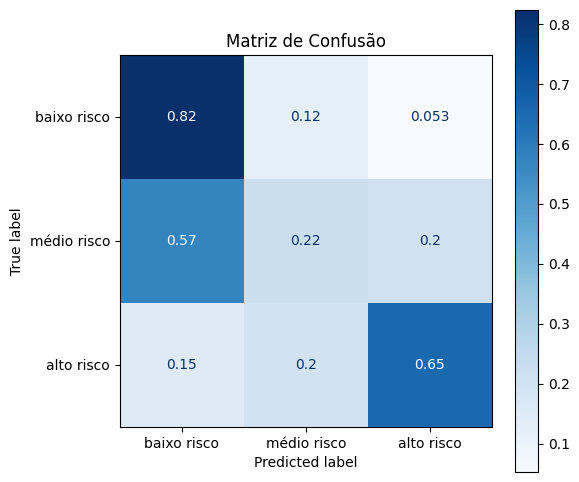

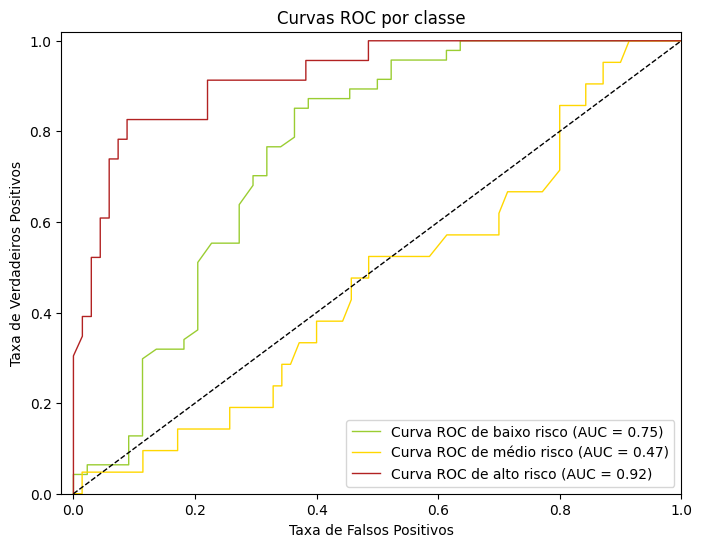

AUC geral: 0.73 ± 0.02


In [ ]:
# EXIBIÇÃO DAS MÉTRICAS
print('== Resultados Gerais ==')
print(f'Acurácia: {np.array(accuracy_history).mean():.2f} ± {np.array(accuracy_history).std():.2f}')
print(f'F1 Weighted: {np.array(f1_weighted_history).mean():.2f} ± {np.array(f1_weighted_history).std():.2f}')
print(f'F1 Macro: {np.array(f1_macro_history).mean():.2f} ± {np.array(f1_macro_history).std():.2f}')
print(f'Precision: {np.array(precision_macro_history).mean():.2f} ± {np.array(precision_macro_history).std():.2f}')
print(f'Recall: {np.array(recall_macro_history).mean():.2f} ± {np.array(recall_macro_history).std():.2f}')
print()
print('== Resultados por Classe ==')
for i in range(0, n_classes):
  print(f'Precision da classe {nome_classes[i]}: {np.array(precision_history).mean(axis=0)[i]:.2f} ± {np.array(precision_history).std(axis=0)[i]:.2f}')
print()
for i in range(0, n_classes):
  print(f'Recall da classe {nome_classes[i]}: {np.array(recall_history).mean(axis=0)[i]:.2f} ± {np.array(recall_history).std(axis=0)[i]:.2f}')
print()
for i in range(0, n_classes):
  print(f'F1 da classe {nome_classes[i]}: {np.array(f1_history).mean(axis=0)[i]:.2f} ± {np.array(f1_history).std(axis=0)[i]:.2f}')
print()

# EXIBIÇÃO DA MATRIZ DE CONFUSÃO
fig, ax = plt.subplots(figsize=(6, 6))
ax.set_title('Matriz de Confusão')
# Criação da matriz de confusão a partir da média obtida
cf_matrix = np.array(cf_matrix_history).mean(axis=0)
cm = ConfusionMatrixDisplay(confusion_matrix = cf_matrix, display_labels = nome_classes)
# Plotando a matriz de confusão
ax = cm.plot(ax=ax, cmap = 'Blues')

# EXIBIÇÃO DA CURVA ROC E SUA AUC
# Calculando fpr, tpr e auc para cada classe
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
  fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
  roc_auc[i] = auc(fpr[i], tpr[i])

# Plotagem
plt.figure(figsize=(8, 6))
for i in range(0, n_classes):
  plt.plot(fpr[i], tpr[i], color = paleta[i], label = f'Curva ROC de {nome_classes[i]} (AUC = {roc_auc[i]:.2f})', lw = 1)

plt.plot([0, 1], [0, 1], 'k--', lw = 1)
plt.xlabel('Taxa de Falsos Positivos')
plt.xlim([-0.02, 1.0])
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.ylim([0.0, 1.02])
plt.title('Curvas ROC por classe')
plt.legend(loc="lower right")
plt.show()
print(f'AUC geral: {np.array(auc_history).mean():.2f} ± {np.array(auc_history).std():.2f}')

## Validação K-Fold #1

In [ ]:
# TREINO E VALIDAÇÃO CRUZADA K-FOLD
# Hiperparâmetros para teste (os melhores do grid hold-out)
if penalty == 'elasticnet':
  param_grid = {
      'penalty': ['elasticnet'],
      'C': [C],
      'solver': [solver],
      'l1_ratio': [l1_ratio],
      'class_weight': [class_weight],
      'max_iter': [max_it]
  }
else:
  param_grid = {
      'penalty': [penalty],
      'C': [C],
      'solver': [solver],
      'class_weight': [class_weight],
      'max_iter': [max_it]
  }

# Lista para armazenar os resultados
results = []

# Aplicar GridSearchCV para K = 2, 3, ..., 5
for i in range(1, 5):
  K = i+1
  print(f'Validação K-Fold com {K} folds em andamento...')
  grid = GridSearchCV(estimator = LogisticRegression(), param_grid = param_grid, scoring = 'accuracy', cv = K, verbose = 0)
  grid_result = grid.fit(X_train, y_train)
  y_pred = grid.predict(X_test)
  results.append(accuracy_score(y_test, y_pred))
  print('Concluida.')

Validação K-Fold com 2 folds em andamento...
Concluida.
Validação K-Fold com 3 folds em andamento...
Concluida.
Validação K-Fold com 4 folds em andamento...
Concluida.
Validação K-Fold com 5 folds em andamento...
Concluida.


In [ ]:
# Exibindo todas as acurácias
for i in range(1, 5):
  print(f'{i+1}-Fold, acurácia:', results[i-1])
# Exibindo o melhor K e sua acurácia
print(f'Melhor K = {results.index(max(results)) + 2} com acurácia = {max(results)}')

2-Fold, acurácia: 0.6153846153846154
3-Fold, acurácia: 0.6153846153846154
4-Fold, acurácia: 0.6153846153846154
5-Fold, acurácia: 0.6153846153846154
Melhor K = 2 com acurácia = 0.6153846153846154


In [ ]:
# AVALIAR 10x O MELHOR K DA VALIDAÇÃO K-FOLD
K = results.index(max(results)) + 2

classes = [0, 1, 2]
nome_classes = ['baixo risco', 'médio risco', 'alto risco']
n_classes = len(nome_classes)

cf_matrix_history = list()
accuracy_history = list()
precision_history = list()
precision_macro_history = list()
recall_history = list()
recall_macro_history = list()
f1_history = list()
f1_weighted_history = list()
f1_macro_history = list()
auc_history = list()

count = 0
for i in (0, 1, 2, 5, 10, 12, 123, 1234, 12345, 42):
  count += 1

  # Redefinindo os conjuntos de treino e teste
  ''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''
  _, X_train, X_test, y_train, y_test = func_data_3(random_state = i, output = False) # !!! defina novamente o dataset a ser utilizado !!!
  ''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''

  # Treinando o modelo
  grid = GridSearchCV(estimator = LogisticRegression(), param_grid = param_grid, scoring = 'accuracy', cv = K, verbose = 0)
  grid_result = grid.fit(X_train, y_train)

  # Salvando os valores de acurácia geral e precision, recall e f1 de cada classe
  y_pred = grid.predict(X_test)

  # salvando a matriz de confusão
  cm = confusion_matrix(y_test, y_pred)
  cm = pd.DataFrame(cm, index = nome_classes, columns = nome_classes)
  cm = cm.div(cm.sum(axis = 1), axis = 0) # normalizando a matriz de confusão
  cf_matrix_history.append(cm)

  # salvando a acurácia
  accuracy = accuracy_score(y_test, y_pred)
  accuracy_history.append(accuracy)

  # salvando a precisão de cada classe e a macro
  precision = precision_score(y_test, y_pred, average = None, zero_division = 0)
  precision_history.append(precision)
  precision = precision_score(y_test, y_pred, average = 'macro', zero_division = 0)
  precision_macro_history.append(precision)

  # salvando a recall de cada classe e a macro
  recall = recall_score(y_test, y_pred, average = None, zero_division = 0)
  recall_history.append(recall)
  recall = recall_score(y_test, y_pred, average = 'macro', zero_division = 0)
  recall_macro_history.append(recall)

  # salvando o f1-score de cada classe, o macro e o weighted
  f1 = f1_score(y_test, y_pred, average = None, zero_division = 0)
  f1_history.append(f1)
  f1 = f1_score(y_test, y_pred, average = 'weighted', zero_division = 0)
  f1_weighted_history.append(f1)
  f1 = f1_score(y_test, y_pred, average = 'macro', zero_division = 0)
  f1_macro_history.append(f1)

  # salvando a média auc macro
  y_score = final_model.predict_proba(X_test) # Previsões
  y_test_bin = preprocessing.label_binarize(y_test, classes = classes) # Binarizendo as classes verdadeiras
  auc_history.append(roc_auc_score(y_test_bin, y_score, average = 'macro'))

== Resultados Gerais ==
Acurácia: 0.64 ± 0.03
F1 Weighted: 0.61 ± 0.03
F1 Macro: 0.55 ± 0.04
Precision: 0.55 ± 0.06
Recall: 0.56 ± 0.03

== Resultados por Classe ==
Precision da classe baixo risco: 0.71 ± 0.03
Precision da classe médio risco: 0.23 ± 0.13
Precision da classe alto risco: 0.72 ± 0.09

Recall da classe baixo risco: 0.82 ± 0.12
Recall da classe médio risco: 0.19 ± 0.13
Recall da classe alto risco: 0.67 ± 0.10

F1 da classe baixo risco: 0.76 ± 0.06
F1 da classe médio risco: 0.20 ± 0.11
F1 da classe alto risco: 0.68 ± 0.05



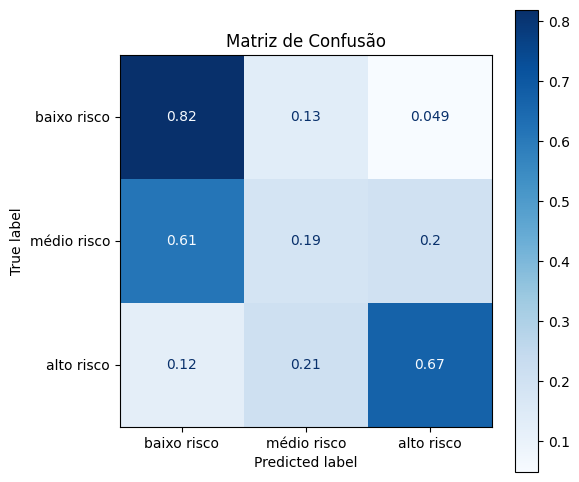

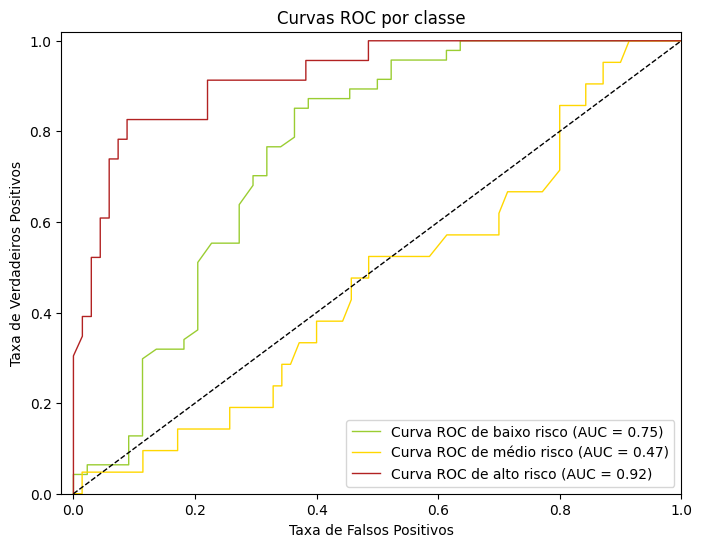

AUC geral: 0.73 ± 0.03


In [ ]:
# EXIBIÇÃO DAS MÉTRICAS
print('== Resultados Gerais ==')
print(f'Acurácia: {np.array(accuracy_history).mean():.2f} ± {np.array(accuracy_history).std():.2f}')
print(f'F1 Weighted: {np.array(f1_weighted_history).mean():.2f} ± {np.array(f1_weighted_history).std():.2f}')
print(f'F1 Macro: {np.array(f1_macro_history).mean():.2f} ± {np.array(f1_macro_history).std():.2f}')
print(f'Precision: {np.array(precision_macro_history).mean():.2f} ± {np.array(precision_macro_history).std():.2f}')
print(f'Recall: {np.array(recall_macro_history).mean():.2f} ± {np.array(recall_macro_history).std():.2f}')
print()
print('== Resultados por Classe ==')
for i in range(0, n_classes):
  print(f'Precision da classe {nome_classes[i]}: {np.array(precision_history).mean(axis=0)[i]:.2f} ± {np.array(precision_history).std(axis=0)[i]:.2f}')
print()
for i in range(0, n_classes):
  print(f'Recall da classe {nome_classes[i]}: {np.array(recall_history).mean(axis=0)[i]:.2f} ± {np.array(recall_history).std(axis=0)[i]:.2f}')
print()
for i in range(0, n_classes):
  print(f'F1 da classe {nome_classes[i]}: {np.array(f1_history).mean(axis=0)[i]:.2f} ± {np.array(f1_history).std(axis=0)[i]:.2f}')
print()

# EXIBIÇÃO DA MATRIZ DE CONFUSÃO
fig, ax = plt.subplots(figsize=(6, 6))
ax.set_title('Matriz de Confusão')
# Criação da matriz de confusão a partir da média obtida
cf_matrix = np.array(cf_matrix_history).mean(axis=0)
cm = ConfusionMatrixDisplay(confusion_matrix = cf_matrix, display_labels = nome_classes)
# Plotando a matriz de confusão
ax = cm.plot(ax=ax, cmap = 'Blues')

# EXIBIÇÃO DA CURVA ROC E SUA AUC
# Calculando fpr, tpr e auc para cada classe
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
  fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
  roc_auc[i] = auc(fpr[i], tpr[i])

# Plotagem
plt.figure(figsize=(8, 6))
for i in range(0, n_classes):
  plt.plot(fpr[i], tpr[i], color = paleta[i], label = f'Curva ROC de {nome_classes[i]} (AUC = {roc_auc[i]:.2f})', lw = 1)

plt.plot([0, 1], [0, 1], 'k--', lw = 1)
plt.xlabel('Taxa de Falsos Positivos')
plt.xlim([-0.02, 1.0])
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.ylim([0.0, 1.02])
plt.title('Curvas ROC por classe')
plt.legend(loc="lower right")
plt.show()
print(f'AUC geral: {np.array(auc_history).mean():.2f} ± {np.array(auc_history).std():.2f}')

## Gráficos SHAP

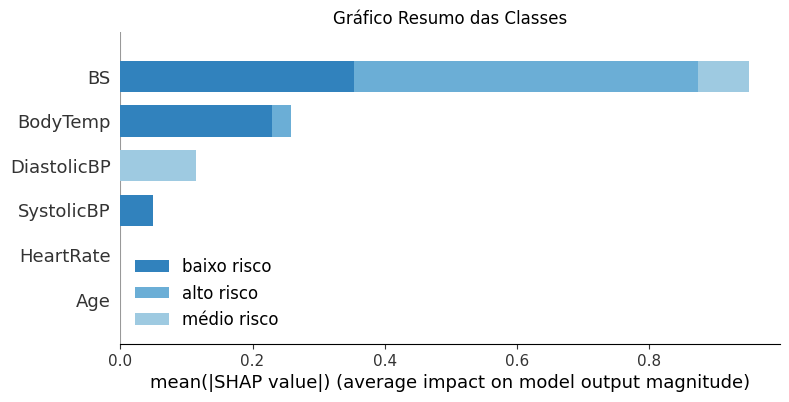

=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x


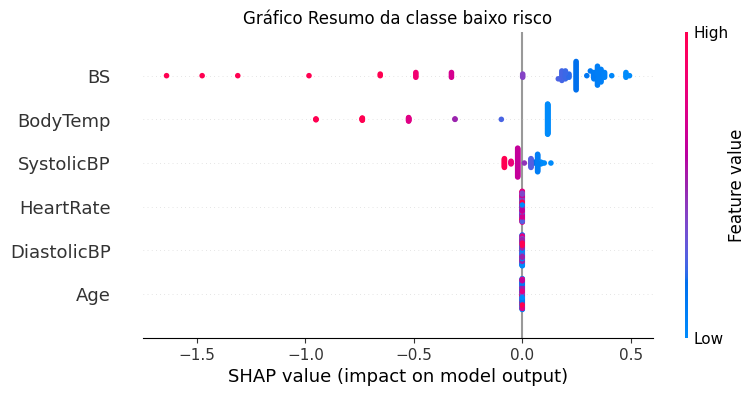

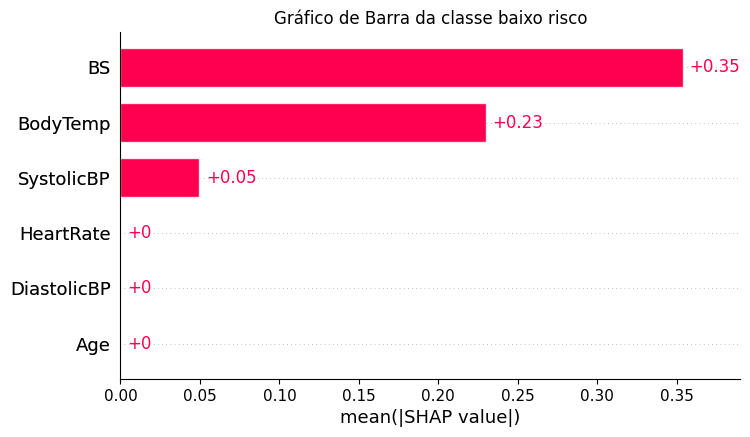

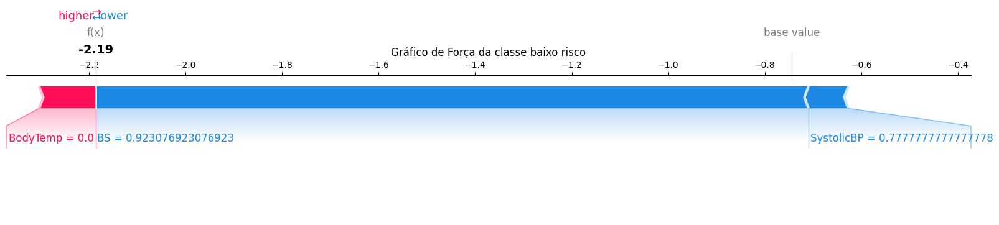

=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x


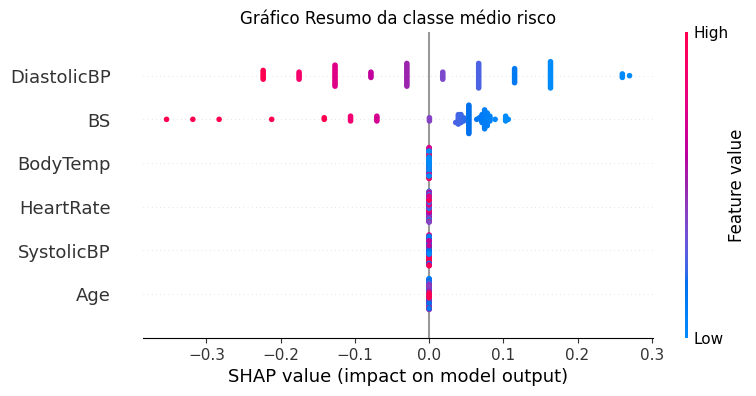

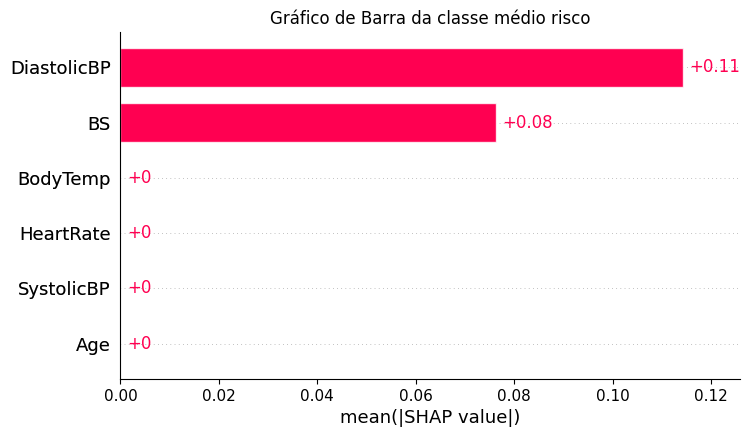

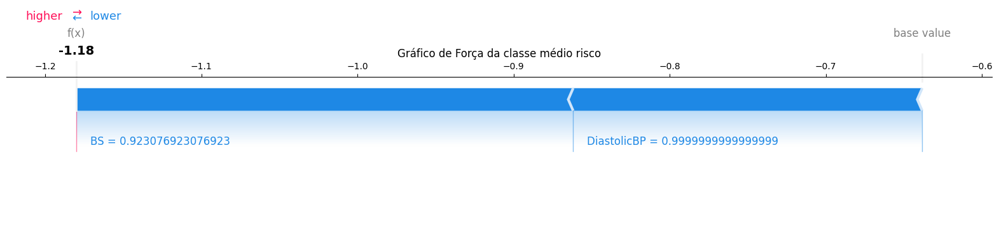

=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x


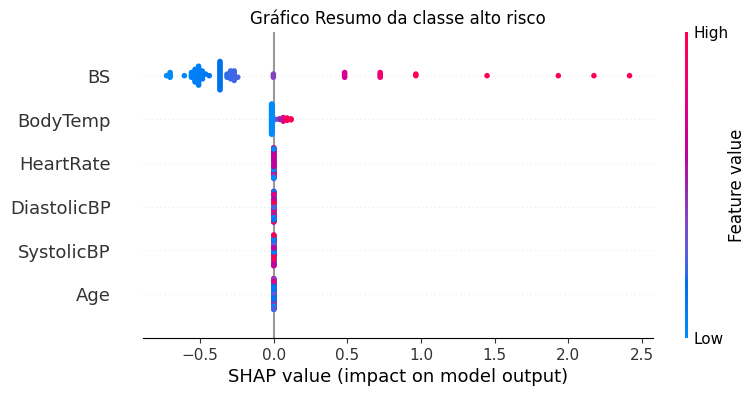

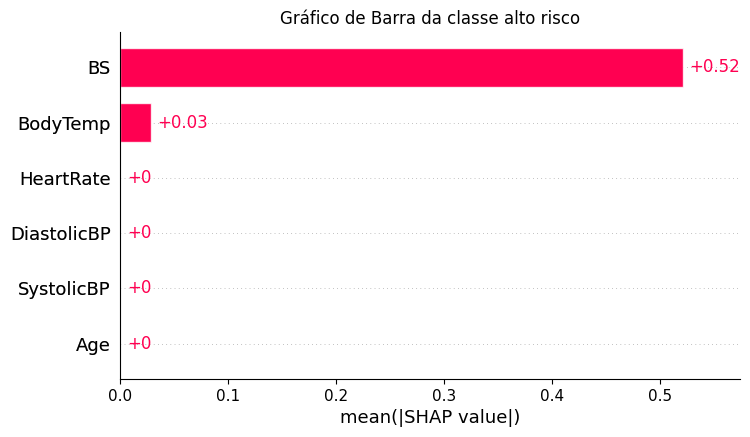

/usr/local/lib/python3.11/dist-packages/shap/plots/_force_matplotlib.py:107: RuntimeWarning: divide by zero encountered in scalar divide
  feature_contribution = np.abs(float(feature[0]) - pre_val) / np.abs(total_effect)


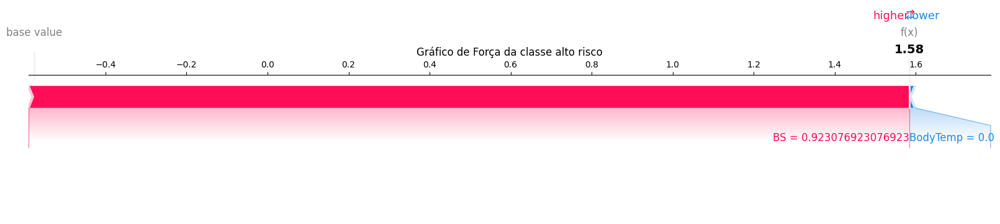

=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x


In [ ]:
# EXIBIÇÃO DOS GRÁFICOS SHAP
class_names = ['baixo risco', 'médio risco', 'alto risco']
explainer = shap.Explainer(final_model, X_train)
shap_values = explainer(X_test)

# Gráfico resumo geral
shap.summary_plot(shap_values, X_test, feature_names = np.array(data_.columns[:6]), plot_type = 'bar', show = False, class_names = class_names, color = plt.get_cmap("tab20c"))
plt.title("Gráfico Resumo das Classes")
plt.show()
print('=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x')

# Gráficos de resumo, barra e de força de cada classe
instance_index = 0 # Seleciona a instancia a ser explicada (exemplo: primeira linha do teste (X_test[0]))
for i in range(0, len(class_names)):
  shap.summary_plot(shap_values[:, :, i], X_test, feature_names = np.array(data_.columns[:6]), show = False) # quanto mais para a direita mais a influencia para a classe i
  plt.title(f'Gráfico Resumo da classe {class_names[i]}')
  plt.show()

  shap.plots.bar(shap.Explanation(values = shap_values[:, :, i], base_values = shap_values.base_values, data = X_test, feature_names = np.array(data_.columns[:6])), max_display = 6, show = False)
  plt.title(f'Gráfico de Barra da classe {class_names[i]}')
  plt.show()

  # Escolhe a classe que você quer explicar (por exemplo, a classe 0)
  class_to_explain = i

  # SHAP values para a instância e classe escolhida
  shap_values_instance_class = shap_values[instance_index, :, class_to_explain]

  # Base value (expected_value) para a classe escolhida
  base_value_for_class = shap_values.base_values[class_to_explain]

  # Valores das features para a instância escolhida
  feature_values_instance = X_test[instance_index]

  explanation_for_instance = shap.Explanation(
      values = shap_values_instance_class,
      base_values = base_value_for_class,
      data = feature_values_instance,
      feature_names = np.array(data_.columns[:6])
  )
  shap.plots.force(explanation_for_instance, matplotlib = True, show = False)
  plt.title(f'Gráfico de Força da classe {class_names[i]}')
  plt.show()
  print('=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x')

# **SVM**

## Método Hold-Out #1

In [ ]:
''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''
_, X_train, X_test, y_train, y_test = func_data_3(output = False) # !!! escolha o dataset alterando o número após o func_data_ !!!
''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''

# TREINO E VALIDAÇÃO HOLD-OUT
# Hiperparâmetros para teste
C_options = [0.1, 1, 10, 100] # Parâmetro de regularização
kernel_options = ['linear', 'poly', 'rbf', 'sigmoid'] # Tipo de kernel
gamma_options = ['scale', 'auto'] # Coeficiente do kernel (para 'rbf', 'poly' e 'sigmoid')
degree_options = [2, 3, 4] # Grau do polinômio para o kernel 'poly'

# Lista para armazenar os resultados
results = []

# EXECUÇÃO DO GRID SEARCH
for C, kernel, gamma, degree in product(C_options, kernel_options, gamma_options, degree_options):
    # Ajuste para evitar combinações inválidas (degree só se aplica a kernel='poly')
    if kernel != 'poly' and degree != degree_options[0]: # Usamos o primeiro valor como padrão quando não é poly
        continue

    print(f'Testando: C = {C}, kernel = {kernel}, gamma = {gamma}, degree = {degree}')

    # Criação do modelo SVM com os hiperparâmetros atuais
    if kernel == 'poly':
        model = SVC(C = C, kernel = kernel, gamma = gamma, degree = degree, probability = True)
    else:
        model = SVC(C = C, kernel = kernel, gamma = gamma, probability = True)

    # Treina o modelo com os dados de treino
    history = model.fit(X_train, y_train)

    # Faz previsões nos dados de teste
    y_pred = model.predict(X_test)

    # Avalia a acurácia
    acc = accuracy_score(y_test, y_pred)
    results.append(((C, kernel, gamma, degree), acc))

Testando: C = 0.1, kernel = linear, gamma = scale, degree = 2
Testando: C = 0.1, kernel = linear, gamma = auto, degree = 2
Testando: C = 0.1, kernel = poly, gamma = scale, degree = 2
Testando: C = 0.1, kernel = poly, gamma = scale, degree = 3
Testando: C = 0.1, kernel = poly, gamma = scale, degree = 4
Testando: C = 0.1, kernel = poly, gamma = auto, degree = 2
Testando: C = 0.1, kernel = poly, gamma = auto, degree = 3
Testando: C = 0.1, kernel = poly, gamma = auto, degree = 4
Testando: C = 0.1, kernel = rbf, gamma = scale, degree = 2
Testando: C = 0.1, kernel = rbf, gamma = auto, degree = 2
Testando: C = 0.1, kernel = sigmoid, gamma = scale, degree = 2
Testando: C = 0.1, kernel = sigmoid, gamma = auto, degree = 2
Testando: C = 1, kernel = linear, gamma = scale, degree = 2
Testando: C = 1, kernel = linear, gamma = auto, degree = 2
Testando: C = 1, kernel = poly, gamma = scale, degree = 2
Testando: C = 1, kernel = poly, gamma = scale, degree = 3
Testando: C = 1, kernel = poly, gamma = sca

In [ ]:
# OBTER O MELHOR MODELO DA VALIDAÇÃO HOLD-OUT
best_model = max(results, key=lambda x: x[1])
C, kernel, gamma, degree = best_model[0]
if kernel == 'poly':
  print(f'Melhor modelo: C = {C}, kernel = {kernel}, gamma = {gamma}, degree = {degree}')
else:
  print(f'Melhor modelo: C = {C}, kernel = {kernel}, gamma = {gamma}')

Melhor modelo: C = 10, kernel = poly, gamma = scale, degree = 2


In [ ]:
# AVALIAR 10x O MELHOR MODELO DA VALIDAÇÃO HOLD-OUT
if kernel == 'poly':
  final_model = SVC(C = C, kernel = kernel, gamma = gamma, degree = degree, probability = True)
else:
  final_model = SVC(C = C, kernel = kernel, gamma = gamma, probability = True)

classes = [0, 1, 2]
nome_classes = ['baixo risco', 'médio risco', 'alto risco']
n_classes = len(nome_classes)

cf_matrix_history = list()
accuracy_history = list()
precision_history = list()
precision_macro_history = list()
recall_history = list()
recall_macro_history = list()
f1_history = list()
f1_weighted_history = list()
f1_macro_history = list()
auc_history = list()

count = 0
for i in (0, 1, 2, 5, 10, 12, 123, 1234, 12345, 42):
  count += 1
  # Redefinindo os conjuntos de treino e teste
  ''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''
  _, X_train, X_test, y_train, y_test = func_data_3(random_state = i, output = False) # !!! defina novamente o dataset a ser utilizado !!!
  ''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''

  history = final_model.fit(X_train, y_train)

  # Salvando os valores de acurácia geral e precision, recall e f1 de cada classe
  y_pred = model.predict(X_test)

  # salvando a matriz de confusão
  cm = confusion_matrix(y_test, y_pred)
  cm = pd.DataFrame(cm, index = nome_classes, columns = nome_classes)
  cm = cm.div(cm.sum(axis = 1), axis = 0) # normalizando a matriz de confusão
  cf_matrix_history.append(cm)

  # salvando a acurácia
  accuracy = accuracy_score(y_test, y_pred)
  accuracy_history.append(accuracy)

  # salvando a precisão de cada classe e a macro
  precision = precision_score(y_test, y_pred, average = None, zero_division = 0)
  precision_history.append(precision)
  precision = precision_score(y_test, y_pred, average = 'macro', zero_division = 0)
  precision_macro_history.append(precision)

  # salvando a recall de cada classe e a macro
  recall = recall_score(y_test, y_pred, average = None, zero_division = 0)
  recall_history.append(recall)
  recall = recall_score(y_test, y_pred, average = 'macro', zero_division = 0)
  recall_macro_history.append(recall)

  # salvando o f1-score de cada classe, o macro e o weighted
  f1 = f1_score(y_test, y_pred, average = None, zero_division = 0)
  f1_history.append(f1)
  f1 = f1_score(y_test, y_pred, average = 'weighted', zero_division = 0)
  f1_weighted_history.append(f1)
  f1 = f1_score(y_test, y_pred, average = 'macro', zero_division = 0)
  f1_macro_history.append(f1)

  # salvando a média auc macro
  y_score = final_model.predict_proba(X_test) # Previsões
  y_test_bin = preprocessing.label_binarize(y_test, classes = classes) # Binarizendo as classes verdadeiras
  auc_history.append(roc_auc_score(y_test_bin, y_score, average = 'macro'))

== Resultados Gerais ==
Acurácia: 0.58 ± 0.03
F1 Weighted: 0.58 ± 0.02
F1 Macro: 0.53 ± 0.02
Precision: 0.54 ± 0.03
Recall: 0.54 ± 0.03

== Resultados por Classe ==
Precision da classe baixo risco: 0.74 ± 0.02
Precision da classe médio risco: 0.27 ± 0.02
Precision da classe alto risco: 0.62 ± 0.07

Recall da classe baixo risco: 0.68 ± 0.12
Recall da classe médio risco: 0.33 ± 0.13
Recall da classe alto risco: 0.60 ± 0.10

F1 da classe baixo risco: 0.70 ± 0.08
F1 da classe médio risco: 0.29 ± 0.06
F1 da classe alto risco: 0.60 ± 0.07



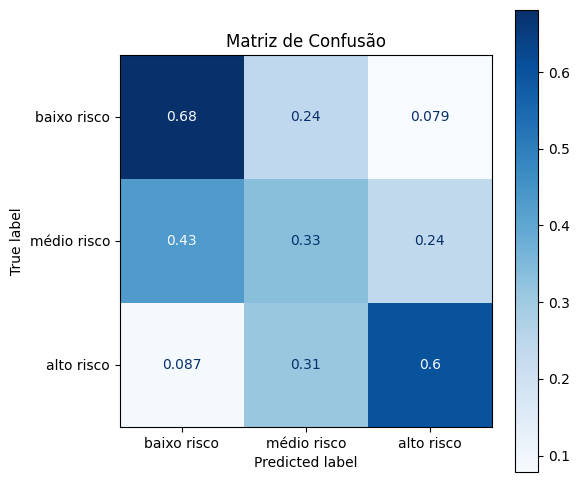

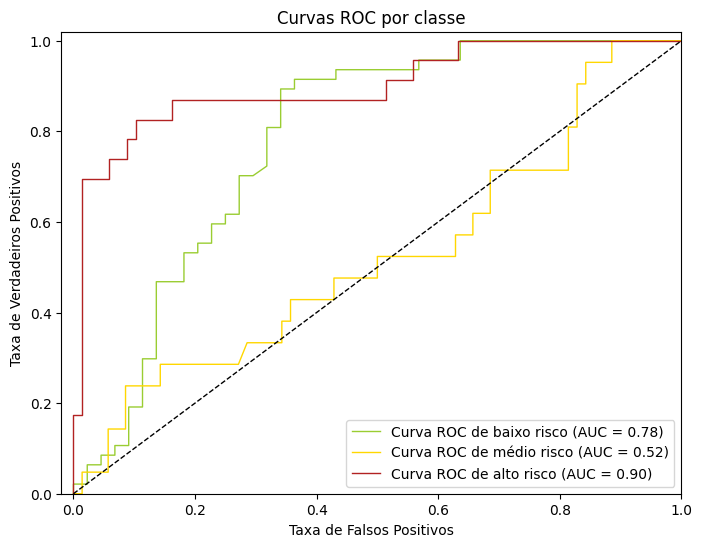

AUC geral: 0.75 ± 0.03


In [ ]:
# EXIBIÇÃO DAS MÉTRICAS
print('== Resultados Gerais ==')
print(f'Acurácia: {np.array(accuracy_history).mean():.2f} ± {np.array(accuracy_history).std():.2f}')
print(f'F1 Weighted: {np.array(f1_weighted_history).mean():.2f} ± {np.array(f1_weighted_history).std():.2f}')
print(f'F1 Macro: {np.array(f1_macro_history).mean():.2f} ± {np.array(f1_macro_history).std():.2f}')
print(f'Precision: {np.array(precision_macro_history).mean():.2f} ± {np.array(precision_macro_history).std():.2f}')
print(f'Recall: {np.array(recall_macro_history).mean():.2f} ± {np.array(recall_macro_history).std():.2f}')
print()
print('== Resultados por Classe ==')
for i in range(0, n_classes):
  print(f'Precision da classe {nome_classes[i]}: {np.array(precision_history).mean(axis=0)[i]:.2f} ± {np.array(precision_history).std(axis=0)[i]:.2f}')
print()
for i in range(0, n_classes):
  print(f'Recall da classe {nome_classes[i]}: {np.array(recall_history).mean(axis=0)[i]:.2f} ± {np.array(recall_history).std(axis=0)[i]:.2f}')
print()
for i in range(0, n_classes):
  print(f'F1 da classe {nome_classes[i]}: {np.array(f1_history).mean(axis=0)[i]:.2f} ± {np.array(f1_history).std(axis=0)[i]:.2f}')
print()

# EXIBIÇÃO DA MATRIZ DE CONFUSÃO
fig, ax = plt.subplots(figsize=(6, 6))
ax.set_title('Matriz de Confusão')
# Criação da matriz de confusão a partir da média obtida
cf_matrix = np.array(cf_matrix_history).mean(axis=0)
cm = ConfusionMatrixDisplay(confusion_matrix = cf_matrix, display_labels = nome_classes)
# Plotando a matriz de confusão
ax = cm.plot(ax=ax, cmap = 'Blues')

# EXIBIÇÃO DA CURVA ROC E SUA AUC
# Calculando fpr, tpr e auc para cada classe
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
  fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
  roc_auc[i] = auc(fpr[i], tpr[i])

# Plotagem
plt.figure(figsize=(8, 6))
for i in range(0, n_classes):
  plt.plot(fpr[i], tpr[i], color = paleta[i], label = f'Curva ROC de {nome_classes[i]} (AUC = {roc_auc[i]:.2f})', lw = 1)

plt.plot([0, 1], [0, 1], 'k--', lw = 1)
plt.xlabel('Taxa de Falsos Positivos')
plt.xlim([-0.02, 1.0])
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.ylim([0.0, 1.02])
plt.title('Curvas ROC por classe')
plt.legend(loc="lower right")
plt.show()
print(f'AUC geral: {np.array(auc_history).mean():.2f} ± {np.array(auc_history).std():.2f}')

## Validação K-Fold #2

In [ ]:
# TREINO E VALIDAÇÃO CRUZADA K-FOLD
# Hiperparâmetros para teste (os melhores do grid hold-out)
if kernel == 'poly':
  param_grid = {
        'kernel': ['poly'],
        'C': [C],
        'gamma': [gamma],
        'degree': [degree]
    }
else:
  param_grid = {
        'kernel': [kernel],
        'C': [C],
        'gamma': [gamma]
    }

# Lista para armazenar os resultados
results = []

# Aplicar GridSearchCV para K = 2, 3, ..., 5
for i in range(1, 5):
  K = i+1
  print(f'Validação K-Fold com {K} folds em andamento...')
  grid = GridSearchCV(estimator = SVC(), param_grid = param_grid, scoring = 'accuracy', cv = K, verbose = 0)
  grid_result = grid.fit(X_train, y_train)
  y_pred = grid.predict(X_test)
  results.append(accuracy_score(y_test, y_pred))
  print('Concluida.')

Validação K-Fold com 2 folds em andamento...
Concluida.
Validação K-Fold com 3 folds em andamento...
Concluida.
Validação K-Fold com 4 folds em andamento...
Concluida.
Validação K-Fold com 5 folds em andamento...
Concluida.


In [ ]:
# Exibindo todas as acurácias
for i in range(1, 5):
  print(f'{i+1}-Fold, acurácia:', results[i-1])
# Exibindo o melhor K e sua acurácia
print(f'Melhor K = {results.index(max(results)) + 2} com acurácia = {max(results)}')

2-Fold, acurácia: 0.7032967032967034
3-Fold, acurácia: 0.7032967032967034
4-Fold, acurácia: 0.7032967032967034
5-Fold, acurácia: 0.7032967032967034
Melhor K = 2 com acurácia = 0.7032967032967034


In [ ]:
# AVALIAR 10x O MELHOR K DA VALIDAÇÃO K-FOLD
K = results.index(max(results)) + 2

classes = [0, 1, 2]
nome_classes = ['baixo risco', 'médio risco', 'alto risco']
n_classes = len(nome_classes)

cf_matrix_history = list()
accuracy_history = list()
precision_history = list()
precision_macro_history = list()
recall_history = list()
recall_macro_history = list()
f1_history = list()
f1_weighted_history = list()
f1_macro_history = list()
auc_history = list()

count = 0
for i in (0, 1, 2, 5, 10, 12, 123, 1234, 12345, 42):
  count += 1

  # Redefinindo os conjuntos de treino e teste
  ''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''
  _, X_train, X_test, y_train, y_test = func_data_3(random_state = i, output = False) # !!! defina novamente o dataset a ser utilizado !!!
  ''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''

  # Treinando o modelo
  grid = GridSearchCV(estimator = SVC(), param_grid = param_grid, scoring = 'accuracy', cv = K, verbose = 0)
  grid_result = grid.fit(X_train, y_train)

  # Salvando os valores de acurácia geral e precision, recall e f1 de cada classe
  y_pred = grid.predict(X_test)

  # salvando a matriz de confusão
  cm = confusion_matrix(y_test, y_pred)
  cm = pd.DataFrame(cm, index = nome_classes, columns = nome_classes)
  cm = cm.div(cm.sum(axis = 1), axis = 0) # normalizando a matriz de confusão
  cf_matrix_history.append(cm)

  # salvando a acurácia
  accuracy = accuracy_score(y_test, y_pred)
  accuracy_history.append(accuracy)

  # salvando a precisão de cada classe e a macro
  precision = precision_score(y_test, y_pred, average = None, zero_division = 0)
  precision_history.append(precision)
  precision = precision_score(y_test, y_pred, average = 'macro', zero_division = 0)
  precision_macro_history.append(precision)

  # salvando a recall de cada classe e a macro
  recall = recall_score(y_test, y_pred, average = None, zero_division = 0)
  recall_history.append(recall)
  recall = recall_score(y_test, y_pred, average = 'macro', zero_division = 0)
  recall_macro_history.append(recall)

  # salvando o f1-score de cada classe, o macro e o weighted
  f1 = f1_score(y_test, y_pred, average = None, zero_division = 0)
  f1_history.append(f1)
  f1 = f1_score(y_test, y_pred, average = 'weighted', zero_division = 0)
  f1_weighted_history.append(f1)
  f1 = f1_score(y_test, y_pred, average = 'macro', zero_division = 0)
  f1_macro_history.append(f1)

  # salvando a média auc macro
  y_score = final_model.predict_proba(X_test) # Previsões
  y_test_bin = preprocessing.label_binarize(y_test, classes = classes) # Binarizendo as classes verdadeiras
  auc_history.append(roc_auc_score(y_test_bin, y_score, average = 'macro'))

== Resultados Gerais ==
Acurácia: 0.65 ± 0.04
F1 Weighted: 0.64 ± 0.03
F1 Macro: 0.59 ± 0.03
Precision: 0.60 ± 0.03
Recall: 0.59 ± 0.03

== Resultados por Classe ==
Precision da classe baixo risco: 0.73 ± 0.03
Precision da classe médio risco: 0.33 ± 0.05
Precision da classe alto risco: 0.72 ± 0.06

Recall da classe baixo risco: 0.79 ± 0.08
Recall da classe médio risco: 0.30 ± 0.07
Recall da classe alto risco: 0.68 ± 0.08

F1 da classe baixo risco: 0.76 ± 0.05
F1 da classe médio risco: 0.31 ± 0.05
F1 da classe alto risco: 0.70 ± 0.06



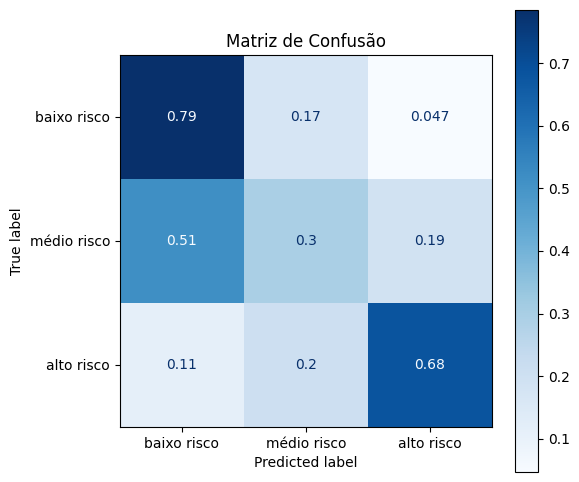

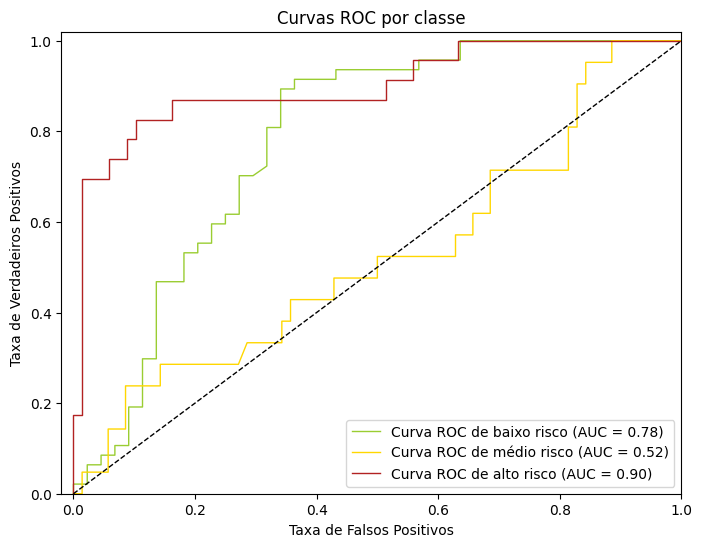

AUC geral: 0.79 ± 0.03


In [ ]:
# EXIBIÇÃO DAS MÉTRICAS
print('== Resultados Gerais ==')
print(f'Acurácia: {np.array(accuracy_history).mean():.2f} ± {np.array(accuracy_history).std():.2f}')
print(f'F1 Weighted: {np.array(f1_weighted_history).mean():.2f} ± {np.array(f1_weighted_history).std():.2f}')
print(f'F1 Macro: {np.array(f1_macro_history).mean():.2f} ± {np.array(f1_macro_history).std():.2f}')
print(f'Precision: {np.array(precision_macro_history).mean():.2f} ± {np.array(precision_macro_history).std():.2f}')
print(f'Recall: {np.array(recall_macro_history).mean():.2f} ± {np.array(recall_macro_history).std():.2f}')
print()
print('== Resultados por Classe ==')
for i in range(0, n_classes):
  print(f'Precision da classe {nome_classes[i]}: {np.array(precision_history).mean(axis=0)[i]:.2f} ± {np.array(precision_history).std(axis=0)[i]:.2f}')
print()
for i in range(0, n_classes):
  print(f'Recall da classe {nome_classes[i]}: {np.array(recall_history).mean(axis=0)[i]:.2f} ± {np.array(recall_history).std(axis=0)[i]:.2f}')
print()
for i in range(0, n_classes):
  print(f'F1 da classe {nome_classes[i]}: {np.array(f1_history).mean(axis=0)[i]:.2f} ± {np.array(f1_history).std(axis=0)[i]:.2f}')
print()

# EXIBIÇÃO DA MATRIZ DE CONFUSÃO
fig, ax = plt.subplots(figsize=(6, 6))
ax.set_title('Matriz de Confusão')
# Criação da matriz de confusão a partir da média obtida
cf_matrix = np.array(cf_matrix_history).mean(axis=0)
cm = ConfusionMatrixDisplay(confusion_matrix = cf_matrix, display_labels = nome_classes)
# Plotando a matriz de confusão
ax = cm.plot(ax=ax, cmap = 'Blues')

# EXIBIÇÃO DA CURVA ROC E SUA AUC
# Calculando fpr, tpr e auc para cada classe
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
  fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
  roc_auc[i] = auc(fpr[i], tpr[i])

# Plotagem
plt.figure(figsize=(8, 6))
for i in range(0, n_classes):
  plt.plot(fpr[i], tpr[i], color = paleta[i], label = f'Curva ROC de {nome_classes[i]} (AUC = {roc_auc[i]:.2f})', lw = 1)

plt.plot([0, 1], [0, 1], 'k--', lw = 1)
plt.xlabel('Taxa de Falsos Positivos')
plt.xlim([-0.02, 1.0])
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.ylim([0.0, 1.02])
plt.title('Curvas ROC por classe')
plt.legend(loc="lower right")
plt.show()
print(f'AUC geral: {np.array(auc_history).mean():.2f} ± {np.array(auc_history).std():.2f}')

## Gráficos SHAP

  0%|          | 0/91 [00:00<?, ?it/s]

<ipython-input-104-f252d8fe1ecb>:7: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test, feature_names = np.array(data_.columns[:6]), plot_type = 'bar', show = False, class_names = class_names, color = plt.get_cmap("tab20c"))


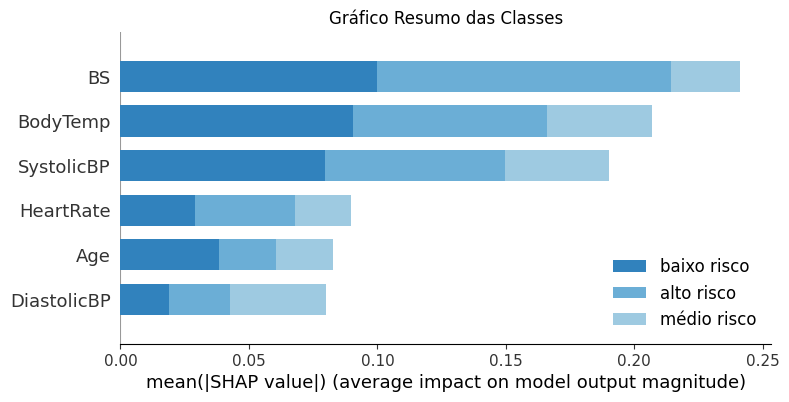

=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x


<ipython-input-104-f252d8fe1ecb>:15: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values[:, :, i], X_test, feature_names = np.array(data_.columns[:6]), show = False) # quanto mais para a direita mais a influencia para a classe i


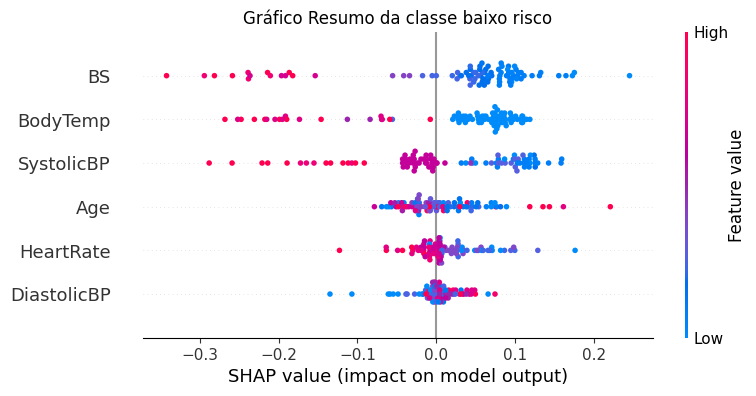

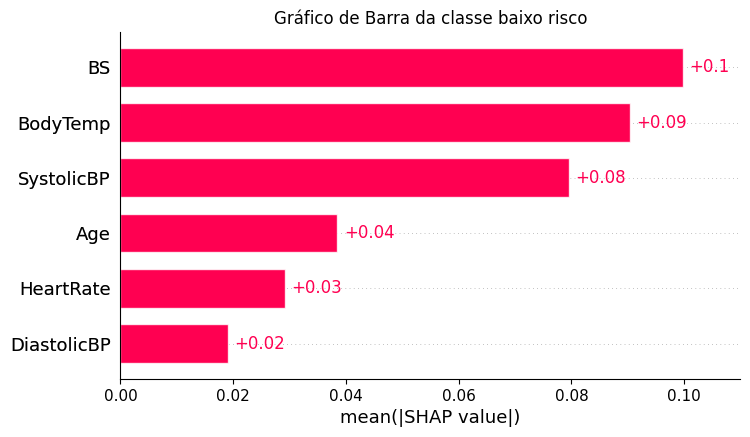

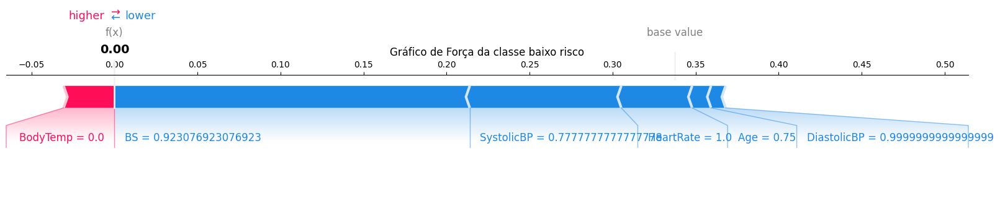

=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x


<ipython-input-104-f252d8fe1ecb>:15: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values[:, :, i], X_test, feature_names = np.array(data_.columns[:6]), show = False) # quanto mais para a direita mais a influencia para a classe i


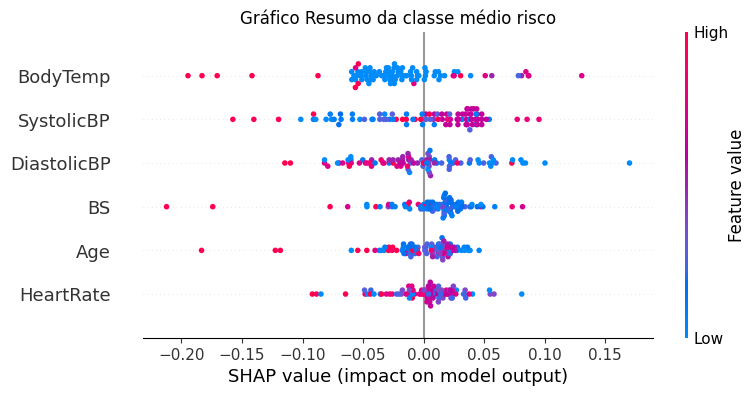

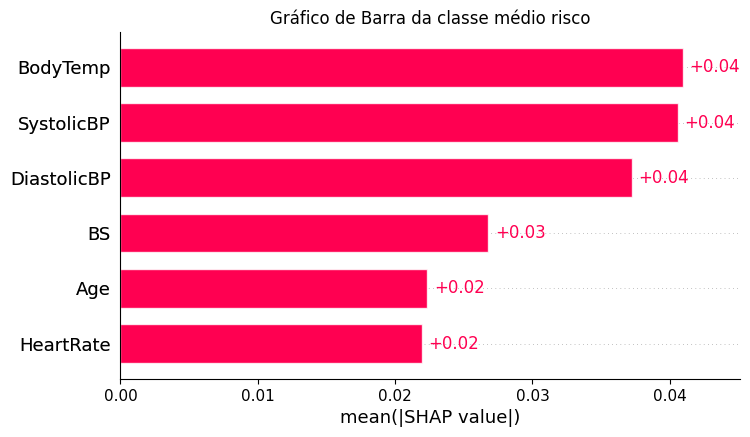

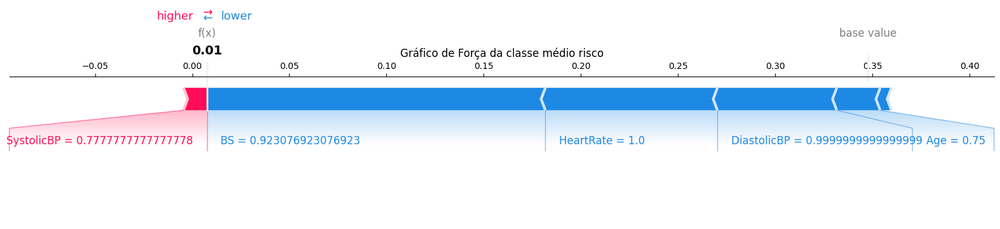

=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x


<ipython-input-104-f252d8fe1ecb>:15: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values[:, :, i], X_test, feature_names = np.array(data_.columns[:6]), show = False) # quanto mais para a direita mais a influencia para a classe i


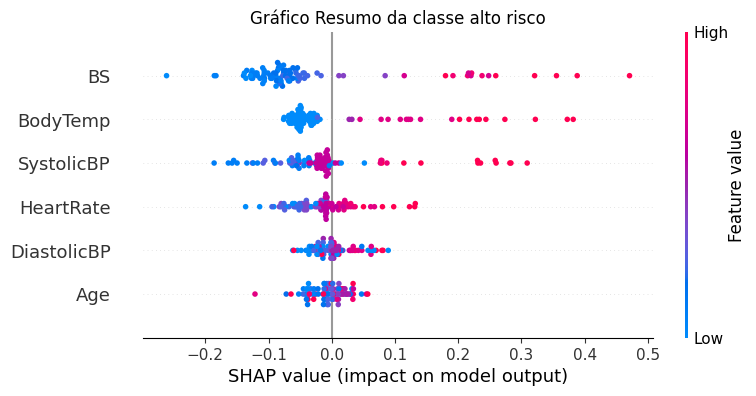

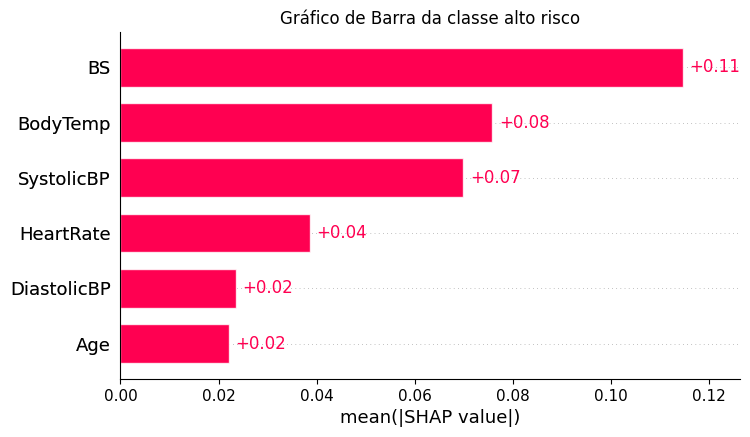

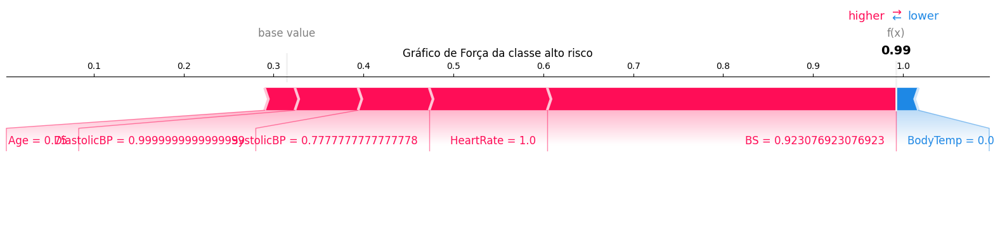

=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x


In [ ]:
# EXIBIÇÃO DOS GRÁFICOS SHAP
class_names = ['baixo risco', 'médio risco', 'alto risco']
explainer = shap.KernelExplainer(final_model.predict_proba, X_train)
shap_values = explainer(X_test)

# Gráfico resumo geral
shap.summary_plot(shap_values, X_test, feature_names = np.array(data_.columns[:6]), plot_type = 'bar', show = False, class_names = class_names, color = plt.get_cmap("tab20c"))
plt.title("Gráfico Resumo das Classes")
plt.show()
print('=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x')

# Gráficos de resumo, barra e de força de cada classe
instance_index = 0 # Seleciona a instancia a ser explicada (exemplo: primeira linha do teste (X_test[0]))
for i in range(0, len(class_names)):
  shap.summary_plot(shap_values[:, :, i], X_test, feature_names = np.array(data_.columns[:6]), show = False) # quanto mais para a direita mais a influencia para a classe i
  plt.title(f'Gráfico Resumo da classe {class_names[i]}')
  plt.show()

  shap.plots.bar(shap.Explanation(values = shap_values[:, :, i], base_values = shap_values.base_values, data = X_test, feature_names = np.array(data_.columns[:6])), max_display = 6, show = False)
  plt.title(f'Gráfico de Barra da classe {class_names[i]}')
  plt.show()

  # Escolhe a classe que você quer explicar (por exemplo, a classe 0)
  class_to_explain = i

  # SHAP values para a instância e classe escolhida
  shap_values_instance_class = shap_values[instance_index, :, class_to_explain]

  # Base value (expected_value) para a classe escolhida
  base_value_for_class = shap_values.base_values[class_to_explain]

  # Valores das features para a instância escolhida
  feature_values_instance = X_test[instance_index]

  explanation_for_instance = shap.Explanation(
      values = shap_values_instance_class,
      base_values = base_value_for_class,
      data = feature_values_instance,
      feature_names = np.array(data_.columns[:6])
  )
  shap.plots.force(explanation_for_instance, matplotlib = True, show = False)
  plt.title(f'Gráfico de Força da classe {class_names[i]}')
  plt.show()
  print('=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x')

# **Árvore de Decisão**

## Método Hold-Out #1

In [ ]:
''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''
_, X_train, X_test, y_train, y_test = func_data_3(output = False) # !!! escolha o dataset alterando o número após o func_data_ !!!
''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''

# TREINO E VALIDAÇÃO HOLD-OUT
# Hiperparâmetros para teste
criterion_options = ['gini', 'entropy'] # Função para medir a qualidade de uma divisão
splitter_options = ['best', 'random'] # Estratégia usada para escolher a divisão em cada nó
max_depth_options = [None, 5, 10, 20, 30] # Profundidade máxima da árvore (None significa nós expandidos até que todas as folhas sejam puras ou contenham menos de min_samples_split amostras)
min_samples_split_options = [2, 5, 10] # Número mínimo de amostras necessárias para dividir um nó interno
min_samples_leaf_options = [1, 2, 4] # Número mínimo de amostras necessárias para estar em um nó folha
max_features_options = [None, 'sqrt', 'log2'] # Número de features a considerar ao procurar a melhor divisão

# Lista para armazenar os resultados
results = []

# EXECUÇÃO DO GRID SEARCH
for criterion, splitter, max_depth, min_samples_split, min_samples_leaf, max_features in product(criterion_options, splitter_options, max_depth_options, min_samples_split_options,
                                                                                                 min_samples_leaf_options, max_features_options):
    print(f'Testando: criterion = {criterion}, splitter = {splitter}, max_depth = {max_depth}, min_samples_split = {min_samples_split}, min_samples_leaf = {min_samples_leaf}, max_features = {max_features}')
    # Criação do modelo de Árvore de Decisão com os hiperparâmetros atuais
    model = DecisionTreeClassifier(criterion = criterion, splitter = splitter, max_depth = max_depth, min_samples_split = min_samples_split, min_samples_leaf = min_samples_leaf, max_features = max_features)
    # Treina o modelo
    model.fit(X_train, y_train)
    # Faz previsões nos dados de teste
    y_pred = model.predict(X_test)
    # Avalia a acurácia
    acc = accuracy_score(y_test, y_pred)
    # Armazena os resultados
    results.append(((criterion, splitter, max_depth, min_samples_split, min_samples_leaf, max_features), acc))

Testando: criterion = gini, splitter = best, max_depth = None, min_samples_split = 2, min_samples_leaf = 1, max_features = None
Testando: criterion = gini, splitter = best, max_depth = None, min_samples_split = 2, min_samples_leaf = 1, max_features = sqrt
Testando: criterion = gini, splitter = best, max_depth = None, min_samples_split = 2, min_samples_leaf = 1, max_features = log2
Testando: criterion = gini, splitter = best, max_depth = None, min_samples_split = 2, min_samples_leaf = 2, max_features = None
Testando: criterion = gini, splitter = best, max_depth = None, min_samples_split = 2, min_samples_leaf = 2, max_features = sqrt
Testando: criterion = gini, splitter = best, max_depth = None, min_samples_split = 2, min_samples_leaf = 2, max_features = log2
Testando: criterion = gini, splitter = best, max_depth = None, min_samples_split = 2, min_samples_leaf = 4, max_features = None
Testando: criterion = gini, splitter = best, max_depth = None, min_samples_split = 2, min_samples_leaf =

In [ ]:
# OBTER O MELHOR MODELO DA VALIDAÇÃO HOLD-OUT
best_model = max(results, key=lambda x: x[1])
criterion, splitter, max_depth, min_samples_split, min_samples_leaf, max_features = best_model[0]
print(f'Melhor modelo: criterion = {criterion}, splitter = {splitter}, max_depth = {max_depth}, min_samples_split = {min_samples_split}, min_samples_leaf = {min_samples_leaf}, max_features = {max_features}')

Melhor modelo: criterion = gini, splitter = best, max_depth = 20, min_samples_split = 5, min_samples_leaf = 4, max_features = log2


In [ ]:
# AVALIAR 10x O MELHOR MODELO DA VALIDAÇÃO HOLD-OUT
final_model = DecisionTreeClassifier(criterion = criterion, splitter = splitter, max_depth = max_depth, min_samples_split = min_samples_split, min_samples_leaf = min_samples_leaf, max_features = max_features)

classes = [0, 1, 2]
nome_classes = ['baixo risco', 'médio risco', 'alto risco']
n_classes = len(nome_classes)

cf_matrix_history = list()
accuracy_history = list()
precision_history = list()
precision_macro_history = list()
recall_history = list()
recall_macro_history = list()
f1_history = list()
f1_weighted_history = list()
f1_macro_history = list()
auc_history = list()

count = 0
for i in (0, 1, 2, 5, 10, 12, 123, 1234, 12345, 42):
  count += 1
  # Redefinindo os conjuntos de treino e teste
  ''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''
  data_, X_train, X_test, y_train, y_test = func_data_3(random_state = i, output = False) # !!! defina novamente o dataset a ser utilizado !!!
  ''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''

  history = final_model.fit(X_train, y_train)

  # Salvando os valores de acurácia geral e precision, recall e f1 de cada classe
  y_pred = model.predict(X_test)

  # salvando a matriz de confusão
  cm = confusion_matrix(y_test, y_pred)
  cm = pd.DataFrame(cm, index = nome_classes, columns = nome_classes)
  cm = cm.div(cm.sum(axis = 1), axis = 0) # normalizando a matriz de confusão
  cf_matrix_history.append(cm)

  # salvando a acurácia
  accuracy = accuracy_score(y_test, y_pred)
  accuracy_history.append(accuracy)

  # salvando a precisão de cada classe e a macro
  precision = precision_score(y_test, y_pred, average = None, zero_division = 0)
  precision_history.append(precision)
  precision = precision_score(y_test, y_pred, average = 'macro', zero_division = 0)
  precision_macro_history.append(precision)

  # salvando a recall de cada classe e a macro
  recall = recall_score(y_test, y_pred, average = None, zero_division = 0)
  recall_history.append(recall)
  recall = recall_score(y_test, y_pred, average = 'macro', zero_division = 0)
  recall_macro_history.append(recall)

  # salvando o f1-score de cada classe, o macro e o weighted
  f1 = f1_score(y_test, y_pred, average = None, zero_division = 0)
  f1_history.append(f1)
  f1 = f1_score(y_test, y_pred, average = 'weighted', zero_division = 0)
  f1_weighted_history.append(f1)
  f1 = f1_score(y_test, y_pred, average = 'macro', zero_division = 0)
  f1_macro_history.append(f1)

  # salvando a média auc macro
  y_score = final_model.predict_proba(X_test) # Previsões
  y_test_bin = preprocessing.label_binarize(y_test, classes = classes) # Binarizendo as classes verdadeiras
  auc_history.append(roc_auc_score(y_test_bin, y_score, average = 'macro'))

== Resultados Gerais ==
Acurácia: 0.62 ± 0.08
F1 Weighted: 0.62 ± 0.07
F1 Macro: 0.58 ± 0.07
Precision: 0.61 ± 0.07
Recall: 0.58 ± 0.07

== Resultados por Classe ==
Precision da classe baixo risco: 0.72 ± 0.04
Precision da classe médio risco: 0.35 ± 0.13
Precision da classe alto risco: 0.76 ± 0.10

Recall da classe baixo risco: 0.70 ± 0.16
Recall da classe médio risco: 0.39 ± 0.09
Recall da classe alto risco: 0.65 ± 0.10

F1 da classe baixo risco: 0.70 ± 0.10
F1 da classe médio risco: 0.36 ± 0.10
F1 da classe alto risco: 0.69 ± 0.05



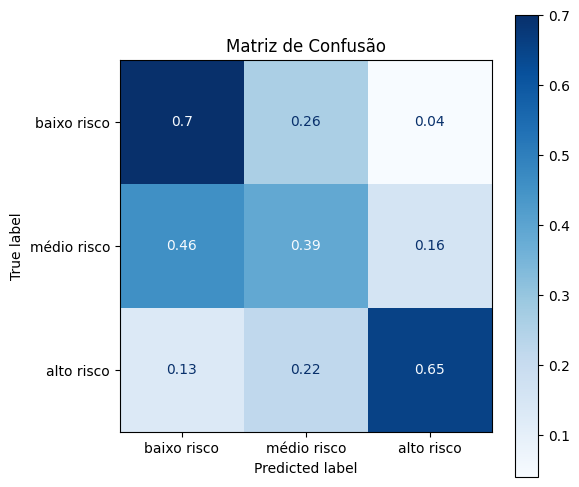

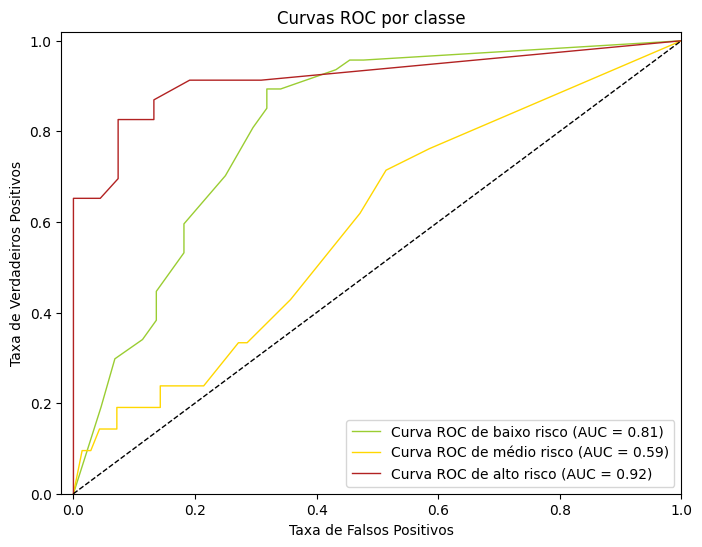

AUC geral: 0.75 ± 0.03


In [ ]:
# EXIBIÇÃO DAS MÉTRICAS
print('== Resultados Gerais ==')
print(f'Acurácia: {np.array(accuracy_history).mean():.2f} ± {np.array(accuracy_history).std():.2f}')
print(f'F1 Weighted: {np.array(f1_weighted_history).mean():.2f} ± {np.array(f1_weighted_history).std():.2f}')
print(f'F1 Macro: {np.array(f1_macro_history).mean():.2f} ± {np.array(f1_macro_history).std():.2f}')
print(f'Precision: {np.array(precision_macro_history).mean():.2f} ± {np.array(precision_macro_history).std():.2f}')
print(f'Recall: {np.array(recall_macro_history).mean():.2f} ± {np.array(recall_macro_history).std():.2f}')
print()
print('== Resultados por Classe ==')
for i in range(0, n_classes):
  print(f'Precision da classe {nome_classes[i]}: {np.array(precision_history).mean(axis=0)[i]:.2f} ± {np.array(precision_history).std(axis=0)[i]:.2f}')
print()
for i in range(0, n_classes):
  print(f'Recall da classe {nome_classes[i]}: {np.array(recall_history).mean(axis=0)[i]:.2f} ± {np.array(recall_history).std(axis=0)[i]:.2f}')
print()
for i in range(0, n_classes):
  print(f'F1 da classe {nome_classes[i]}: {np.array(f1_history).mean(axis=0)[i]:.2f} ± {np.array(f1_history).std(axis=0)[i]:.2f}')
print()

# EXIBIÇÃO DA MATRIZ DE CONFUSÃO
fig, ax = plt.subplots(figsize=(6, 6))
ax.set_title('Matriz de Confusão')
# Criação da matriz de confusão a partir da média obtida
cf_matrix = np.array(cf_matrix_history).mean(axis=0)
cm = ConfusionMatrixDisplay(confusion_matrix = cf_matrix, display_labels = nome_classes)
# Plotando a matriz de confusão
ax = cm.plot(ax=ax, cmap = 'Blues')

# EXIBIÇÃO DA CURVA ROC E SUA AUC
# Calculando fpr, tpr e auc para cada classe
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
  fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
  roc_auc[i] = auc(fpr[i], tpr[i])

# Plotagem
plt.figure(figsize=(8, 6))
for i in range(0, n_classes):
  plt.plot(fpr[i], tpr[i], color = paleta[i], label = f'Curva ROC de {nome_classes[i]} (AUC = {roc_auc[i]:.2f})', lw = 1)

plt.plot([0, 1], [0, 1], 'k--', lw = 1)
plt.xlabel('Taxa de Falsos Positivos')
plt.xlim([-0.02, 1.0])
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.ylim([0.0, 1.02])
plt.title('Curvas ROC por classe')
plt.legend(loc="lower right")
plt.show()
print(f'AUC geral: {np.array(auc_history).mean():.2f} ± {np.array(auc_history).std():.2f}')

## Validação K-Fold #2

In [ ]:
# TREINO E VALIDAÇÃO CRUZADA K-FOLD
# Hiperparâmetros para teste (os melhores do grid hold-out)
param_grid = {
        'criterion': [criterion],
        'splitter': [splitter],
        'max_depth': [max_depth],
        'min_samples_split': [min_samples_split],
        'min_samples_leaf': [min_samples_leaf],
        'max_features': [max_features]
}

# Lista para armazenar os resultados
results = []

# Aplicar GridSearchCV para K = 2, 3, ..., 5
for i in range(1, 5):
  K = i+1
  print(f'Validação K-Fold com {K} folds em andamento...')
  grid = GridSearchCV(estimator = DecisionTreeClassifier(), param_grid = param_grid, scoring = 'accuracy', cv = K, verbose = 0)
  grid_result = grid.fit(X_train, y_train)
  y_pred = grid.predict(X_test)
  results.append(accuracy_score(y_test, y_pred))
  print('Concluida.')

Validação K-Fold com 2 folds em andamento...
Concluida.
Validação K-Fold com 3 folds em andamento...
Concluida.
Validação K-Fold com 4 folds em andamento...
Concluida.
Validação K-Fold com 5 folds em andamento...
Concluida.


In [ ]:
# Exibindo todas as acurácias
for i in range(1, 5):
  print(f'{i+1}-Fold, acurácia:', results[i-1])
# Exibindo o melhor K e sua acurácia
print(f'Melhor K = {results.index(max(results)) + 2} com acurácia = {max(results)}')

2-Fold, acurácia: 0.6813186813186813
3-Fold, acurácia: 0.6153846153846154
4-Fold, acurácia: 0.6923076923076923
5-Fold, acurácia: 0.5494505494505495
Melhor K = 4 com acurácia = 0.6923076923076923


In [ ]:
# AVALIAR 10x O MELHOR K DA VALIDAÇÃO K-FOLD
K = results.index(max(results)) + 2

classes = [0, 1, 2]
nome_classes = ['baixo risco', 'médio risco', 'alto risco']
n_classes = len(nome_classes)

cf_matrix_history = list()
accuracy_history = list()
precision_history = list()
precision_macro_history = list()
recall_history = list()
recall_macro_history = list()
f1_history = list()
f1_weighted_history = list()
f1_macro_history = list()
auc_history = list()

count = 0
for i in (0, 1, 2, 5, 10, 12, 123, 1234, 12345, 42):
  count += 1

  # Redefinindo os conjuntos de treino e teste
  ''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''
  _, X_train, X_test, y_train, y_test = func_data_3(random_state = i, output = False) # !!! defina novamente o dataset a ser utilizado !!!
  ''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''

  # Treinando o modelo
  grid = GridSearchCV(estimator = DecisionTreeClassifier(), param_grid = param_grid, scoring = 'accuracy', cv = K, verbose = 0)
  grid_result = grid.fit(X_train, y_train)

  # Salvando os valores de acurácia geral e precision, recall e f1 de cada classe
  y_pred = grid.predict(X_test)

  # salvando a matriz de confusão
  cm = confusion_matrix(y_test, y_pred)
  cm = pd.DataFrame(cm, index = nome_classes, columns = nome_classes)
  cm = cm.div(cm.sum(axis = 1), axis = 0) # normalizando a matriz de confusão
  cf_matrix_history.append(cm)

  # salvando a acurácia
  accuracy = accuracy_score(y_test, y_pred)
  accuracy_history.append(accuracy)

  # salvando a precisão de cada classe e a macro
  precision = precision_score(y_test, y_pred, average = None, zero_division = 0)
  precision_history.append(precision)
  precision = precision_score(y_test, y_pred, average = 'macro', zero_division = 0)
  precision_macro_history.append(precision)

  # salvando a recall de cada classe e a macro
  recall = recall_score(y_test, y_pred, average = None, zero_division = 0)
  recall_history.append(recall)
  recall = recall_score(y_test, y_pred, average = 'macro', zero_division = 0)
  recall_macro_history.append(recall)

  # salvando o f1-score de cada classe, o macro e o weighted
  f1 = f1_score(y_test, y_pred, average = None, zero_division = 0)
  f1_history.append(f1)
  f1 = f1_score(y_test, y_pred, average = 'weighted', zero_division = 0)
  f1_weighted_history.append(f1)
  f1 = f1_score(y_test, y_pred, average = 'macro', zero_division = 0)
  f1_macro_history.append(f1)

  # salvando a média auc macro
  y_score = final_model.predict_proba(X_test) # Previsões
  y_test_bin = preprocessing.label_binarize(y_test, classes = classes) # Binarizendo as classes verdadeiras
  auc_history.append(roc_auc_score(y_test_bin, y_score, average = 'macro'))

== Resultados Gerais ==
Acurácia: 0.62 ± 0.06
F1 Weighted: 0.62 ± 0.06
F1 Macro: 0.58 ± 0.07
Precision: 0.58 ± 0.07
Recall: 0.58 ± 0.07

== Resultados por Classe ==
Precision da classe baixo risco: 0.72 ± 0.03
Precision da classe médio risco: 0.29 ± 0.09
Precision da classe alto risco: 0.73 ± 0.10

Recall da classe baixo risco: 0.73 ± 0.09
Recall da classe médio risco: 0.30 ± 0.13
Recall da classe alto risco: 0.70 ± 0.12

F1 da classe baixo risco: 0.72 ± 0.05
F1 da classe médio risco: 0.29 ± 0.11
F1 da classe alto risco: 0.71 ± 0.10



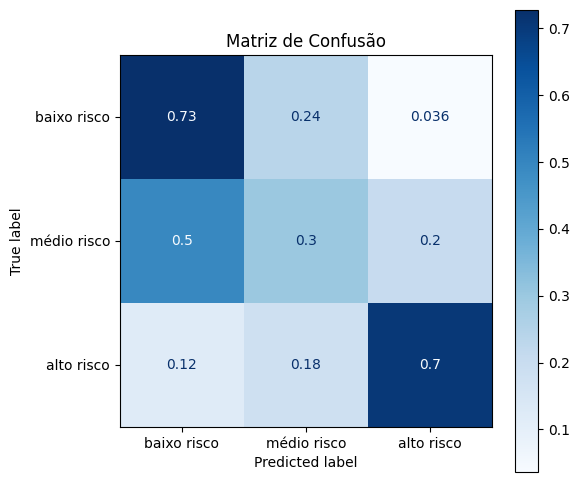

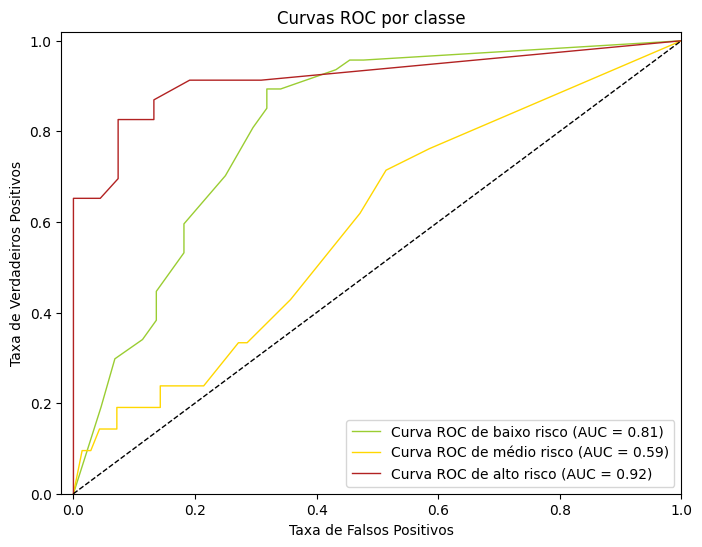

AUC geral: 0.84 ± 0.05


In [ ]:
# EXIBIÇÃO DAS MÉTRICAS
print('== Resultados Gerais ==')
print(f'Acurácia: {np.array(accuracy_history).mean():.2f} ± {np.array(accuracy_history).std():.2f}')
print(f'F1 Weighted: {np.array(f1_weighted_history).mean():.2f} ± {np.array(f1_weighted_history).std():.2f}')
print(f'F1 Macro: {np.array(f1_macro_history).mean():.2f} ± {np.array(f1_macro_history).std():.2f}')
print(f'Precision: {np.array(precision_macro_history).mean():.2f} ± {np.array(precision_macro_history).std():.2f}')
print(f'Recall: {np.array(recall_macro_history).mean():.2f} ± {np.array(recall_macro_history).std():.2f}')
print()
print('== Resultados por Classe ==')
for i in range(0, n_classes):
  print(f'Precision da classe {nome_classes[i]}: {np.array(precision_history).mean(axis=0)[i]:.2f} ± {np.array(precision_history).std(axis=0)[i]:.2f}')
print()
for i in range(0, n_classes):
  print(f'Recall da classe {nome_classes[i]}: {np.array(recall_history).mean(axis=0)[i]:.2f} ± {np.array(recall_history).std(axis=0)[i]:.2f}')
print()
for i in range(0, n_classes):
  print(f'F1 da classe {nome_classes[i]}: {np.array(f1_history).mean(axis=0)[i]:.2f} ± {np.array(f1_history).std(axis=0)[i]:.2f}')
print()

# EXIBIÇÃO DA MATRIZ DE CONFUSÃO
fig, ax = plt.subplots(figsize=(6, 6))
ax.set_title('Matriz de Confusão')
# Criação da matriz de confusão a partir da média obtida
cf_matrix = np.array(cf_matrix_history).mean(axis=0)
cm = ConfusionMatrixDisplay(confusion_matrix = cf_matrix, display_labels = nome_classes)
# Plotando a matriz de confusão
ax = cm.plot(ax=ax, cmap = 'Blues')

# EXIBIÇÃO DA CURVA ROC E SUA AUC
# Calculando fpr, tpr e auc para cada classe
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
  fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
  roc_auc[i] = auc(fpr[i], tpr[i])

# Plotagem
plt.figure(figsize=(8, 6))
for i in range(0, n_classes):
  plt.plot(fpr[i], tpr[i], color = paleta[i], label = f'Curva ROC de {nome_classes[i]} (AUC = {roc_auc[i]:.2f})', lw = 1)

plt.plot([0, 1], [0, 1], 'k--', lw = 1)
plt.xlabel('Taxa de Falsos Positivos')
plt.xlim([-0.02, 1.0])
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.ylim([0.0, 1.02])
plt.title('Curvas ROC por classe')
plt.legend(loc="lower right")
plt.show()
print(f'AUC geral: {np.array(auc_history).mean():.2f} ± {np.array(auc_history).std():.2f}')

## Gráficos SHAP

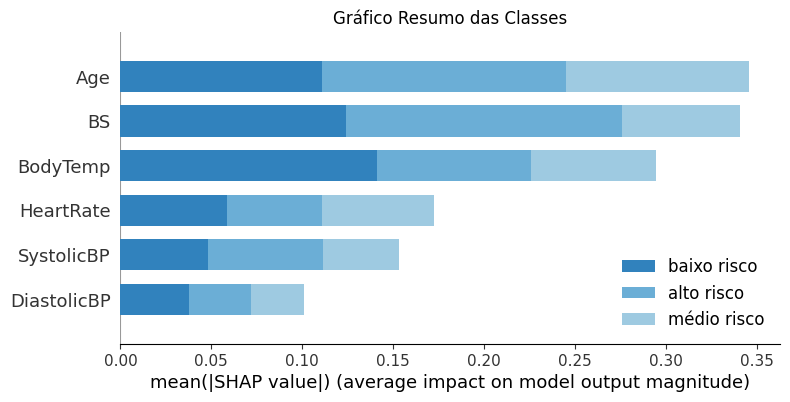

=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x


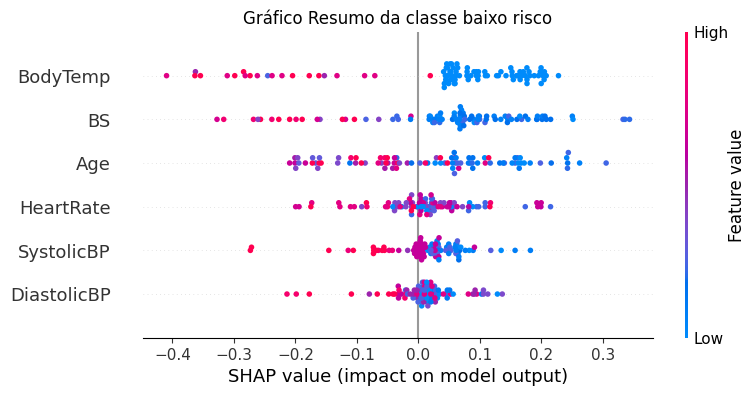

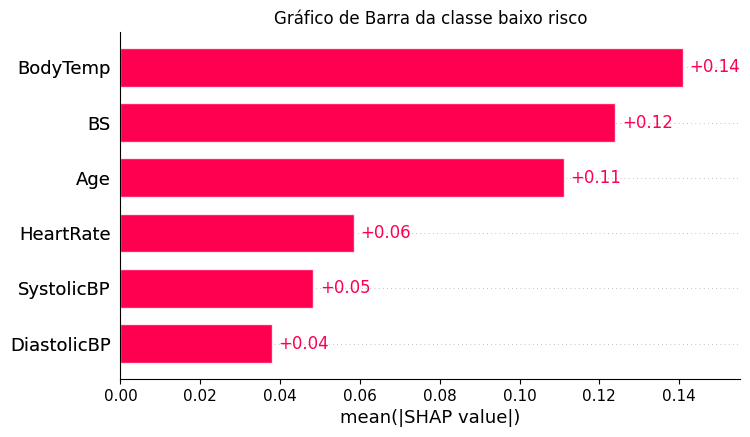

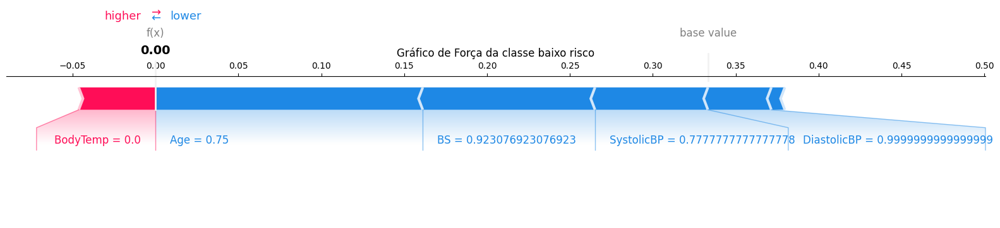

=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x


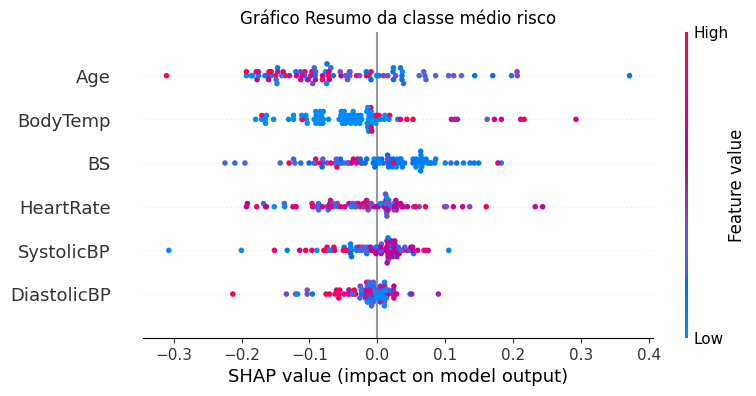

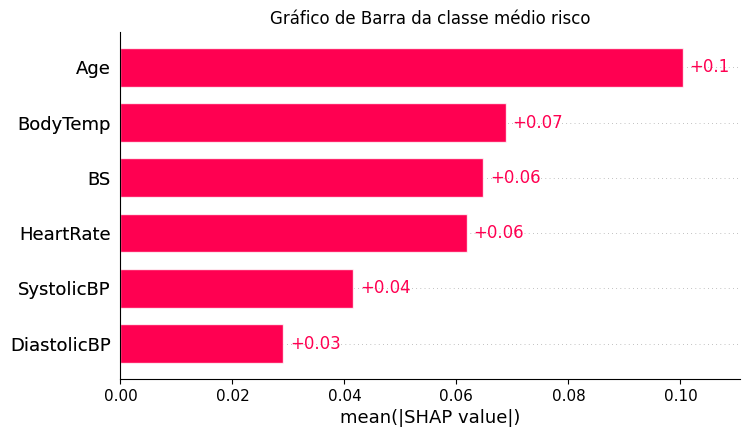

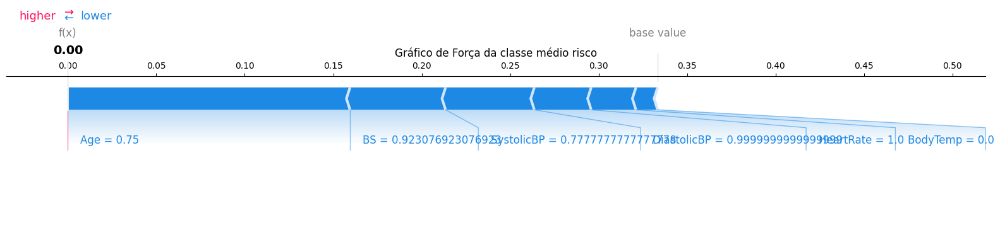

=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x


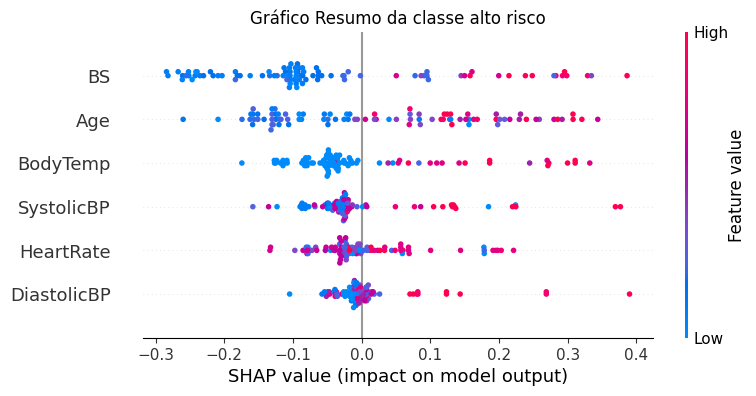

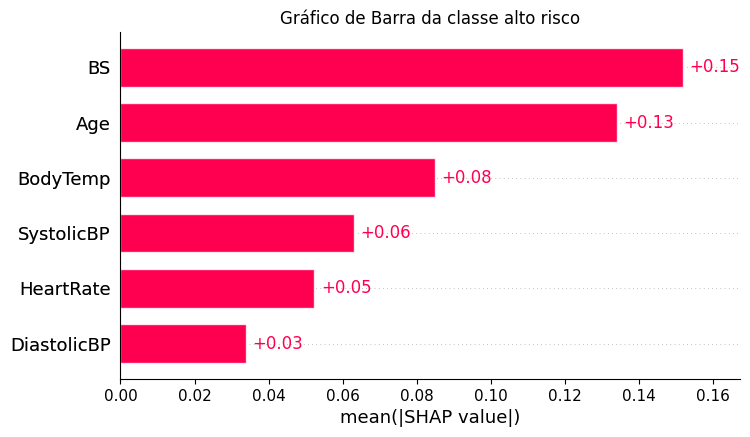

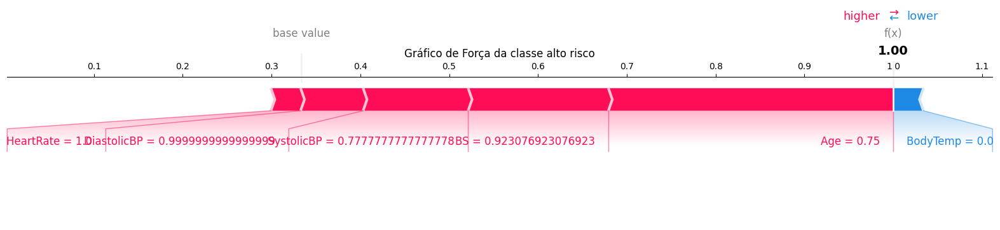

=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x


In [ ]:
# EXIBIÇÃO DOS GRÁFICOS SHAP
class_names = ['baixo risco', 'médio risco', 'alto risco']
explainer = shap.TreeExplainer(final_model)
shap_values = explainer(X_test)

# Gráfico resumo geral
shap.summary_plot(shap_values, X_test, feature_names = np.array(data_.columns[:6]), plot_type = 'bar', show = False, class_names = class_names, color = plt.get_cmap("tab20c"))
plt.title("Gráfico Resumo das Classes")
plt.show()
print('=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x')

# Gráficos de resumo, barra e de força de cada classe
instance_index = 0 # Seleciona a instancia a ser explicada (exemplo: primeira linha do teste (X_test[0]))
for i in range(0, len(class_names)):
  shap.summary_plot(shap_values[:, :, i], X_test, feature_names = np.array(data_.columns[:6]), show = False) # quanto mais para a direita mais a influencia para a classe i
  plt.title(f'Gráfico Resumo da classe {class_names[i]}')
  plt.show()

  shap.plots.bar(shap.Explanation(values = shap_values[:, :, i], base_values = shap_values.base_values, data = X_test, feature_names = np.array(data_.columns[:6])), max_display = 6, show = False)
  plt.title(f'Gráfico de Barra da classe {class_names[i]}')
  plt.show()

  # Escolhe a classe que você quer explicar (por exemplo, a classe 0)
  class_to_explain = i

  # SHAP values para a instância e classe escolhida
  shap_values_instance_class = shap_values[instance_index, :, class_to_explain]

  # Base value (expected_value) para a classe escolhida
  base_value_for_class = shap_values.base_values[class_to_explain]

  # Valores das features para a instância escolhida
  feature_values_instance = X_test[instance_index]

  explanation_for_instance = shap.Explanation(
      values = shap_values_instance_class,
      base_values = base_value_for_class,
      data = feature_values_instance,
      feature_names = np.array(data_.columns[:6])
  )
  shap.plots.force(explanation_for_instance, matplotlib = True, show = False)
  plt.title(f'Gráfico de Força da classe {class_names[i]}')
  plt.show()
  print('=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x')

# **XGBoost**

## Hold-Out #1

In [ ]:
''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''
_, X_train, X_test, y_train, y_test = func_data_3(output = False) # !!! escolha o dataset alterando o número após o func_data_ !!!
''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''

# TREINO E VALIDAÇÃO HOLD-OUT
# Hiperparâmetros para teste
n_est = [50, 100, 250, 500] #n_estimators
mdepth = [3,5,7,10] # max_depth
mchild_weight = [1,3,5,10] #min_child_weight
gama = [0,0.25,0.5]	#gamma
lamb = [0.1,0.5,1] #lambda
lr = [0.01, 0.1, 0.3] #learning rate

# Lista para armazenar os resultados
results = []

# EXECUÇÃO DO GRID SEARCH
for n_est, mdepth, mchild_weight, gama, lamb, lr in product(n_est, mdepth, mchild_weight, gama, lamb, lr):
  print( f'Testando: n_est = {n_est}, mdepth = {mdepth}, learning rate = {lr}, mchild_weight = {mchild_weight}, gamma = {gama}, lambda = {lamb}')
  # Instanciando o modelo com os hiperparâmetros atuais
  model = XGB.XGBClassifier(n_estimators = n_est, max_depth = mdepth, min_child_weight=mchild_weight, gamma=gama, reg_lambda=lamb, learning_rate=lr)
  # Treina o modelo
  model.fit(X_train, y_train)
  # Faz previsões no conjunto de teste
  y_pred = model.predict(X_test)
  # Calcula a acurácia
  acc = accuracy_score(y_test, y_pred)
  results.append(((n_est, mdepth, mchild_weight, gama, lamb, lr), acc))

Testando: n_est = 50, mdepth = 3, learning rate = 0.01, mchild_weight = 1, gamma = 0, lambda = 0.1
Testando: n_est = 50, mdepth = 3, learning rate = 0.1, mchild_weight = 1, gamma = 0, lambda = 0.1
Testando: n_est = 50, mdepth = 3, learning rate = 0.3, mchild_weight = 1, gamma = 0, lambda = 0.1
Testando: n_est = 50, mdepth = 3, learning rate = 0.01, mchild_weight = 1, gamma = 0, lambda = 0.5
Testando: n_est = 50, mdepth = 3, learning rate = 0.1, mchild_weight = 1, gamma = 0, lambda = 0.5
Testando: n_est = 50, mdepth = 3, learning rate = 0.3, mchild_weight = 1, gamma = 0, lambda = 0.5
Testando: n_est = 50, mdepth = 3, learning rate = 0.01, mchild_weight = 1, gamma = 0, lambda = 1
Testando: n_est = 50, mdepth = 3, learning rate = 0.1, mchild_weight = 1, gamma = 0, lambda = 1
Testando: n_est = 50, mdepth = 3, learning rate = 0.3, mchild_weight = 1, gamma = 0, lambda = 1
Testando: n_est = 50, mdepth = 3, learning rate = 0.01, mchild_weight = 1, gamma = 0.25, lambda = 0.1
Testando: n_est = 5

In [ ]:
# OBTER O MELHOR MODELO DA VALIDAÇÃO HOLD-OUT
best_model = max(results, key=lambda x: x[1])
n_est, mdepth, mchild_weight, gama, lamb, lr = best_model[0]
print(f'Melhor modelo: n_est = {n_est}, mdepth = {mdepth}, learning rate = {lr}, mchild_weight = {mchild_weight}, gamma = {gama}, lambda = {lamb}')

Melhor modelo: n_est = 50, mdepth = 3, learning rate = 0.3, mchild_weight = 10, gamma = 0.5, lambda = 0.5


In [ ]:
# AVALIAR 10x O MELHOR MODELO DA VALIDAÇÃO HOLD-OUT
final_model = XGB.XGBClassifier(n_estimators = n_est, max_depth = mdepth, min_child_weight=mchild_weight, gamma=gama, reg_lambda=lamb, learning_rate=lr)

classes = [0, 1, 2]
nome_classes = ['baixo risco', 'médio risco', 'alto risco']
n_classes = len(nome_classes)

cf_matrix_history = list()
accuracy_history = list()
precision_history = list()
precision_macro_history = list()
recall_history = list()
recall_macro_history = list()
f1_history = list()
f1_weighted_history = list()
f1_macro_history = list()
auc_history = list()

count = 0
for i in (0, 1, 2, 5, 10, 12, 123, 1234, 12345, 42):
  count += 1
  # Redefinindo os conjuntos de treino e teste
  ''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''
  data_, X_train, X_test, y_train, y_test = func_data_3(random_state = i, output = False) # !!! defina novamente o dataset a ser utilizado !!!
  ''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''

  history = final_model.fit(X_train, y_train)

  # Salvando os valores de acurácia geral e precision, recall e f1 de cada classe
  y_pred = model.predict(X_test)

  # salvando a matriz de confusão
  cm = confusion_matrix(y_test, y_pred)
  cm = pd.DataFrame(cm, index = nome_classes, columns = nome_classes)
  cm = cm.div(cm.sum(axis = 1), axis = 0) # normalizando a matriz de confusão
  cf_matrix_history.append(cm)

  # salvando a acurácia
  accuracy = accuracy_score(y_test, y_pred)
  accuracy_history.append(accuracy)

  # salvando a precisão de cada classe e a macro
  precision = precision_score(y_test, y_pred, average = None, zero_division = 0)
  precision_history.append(precision)
  precision = precision_score(y_test, y_pred, average = 'macro', zero_division = 0)
  precision_macro_history.append(precision)

  # salvando a recall de cada classe e a macro
  recall = recall_score(y_test, y_pred, average = None, zero_division = 0)
  recall_history.append(recall)
  recall = recall_score(y_test, y_pred, average = 'macro', zero_division = 0)
  recall_macro_history.append(recall)

  # salvando o f1-score de cada classe, o macro e o weighted
  f1 = f1_score(y_test, y_pred, average = None, zero_division = 0)
  f1_history.append(f1)
  f1 = f1_score(y_test, y_pred, average = 'weighted', zero_division = 0)
  f1_weighted_history.append(f1)
  f1 = f1_score(y_test, y_pred, average = 'macro', zero_division = 0)
  f1_macro_history.append(f1)

  # salvando a média auc macro
  y_score = final_model.predict_proba(X_test) # Previsões
  y_test_bin = preprocessing.label_binarize(y_test, classes = classes) # Binarizendo as classes verdadeiras
  auc_history.append(roc_auc_score(y_test_bin, y_score, average = 'macro'))

== Resultados Gerais ==
Acurácia: 0.71 ± 0.13
F1 Weighted: 0.70 ± 0.13
F1 Macro: 0.66 ± 0.13
Precision: 0.70 ± 0.08
Recall: 0.68 ± 0.11

== Resultados por Classe ==
Precision da classe baixo risco: 0.81 ± 0.05
Precision da classe médio risco: 0.55 ± 0.13
Precision da classe alto risco: 0.72 ± 0.20

Recall da classe baixo risco: 0.76 ± 0.20
Recall da classe médio risco: 0.42 ± 0.19
Recall da classe alto risco: 0.86 ± 0.05

F1 da classe baixo risco: 0.77 ± 0.14
F1 da classe médio risco: 0.46 ± 0.16
F1 da classe alto risco: 0.76 ± 0.14



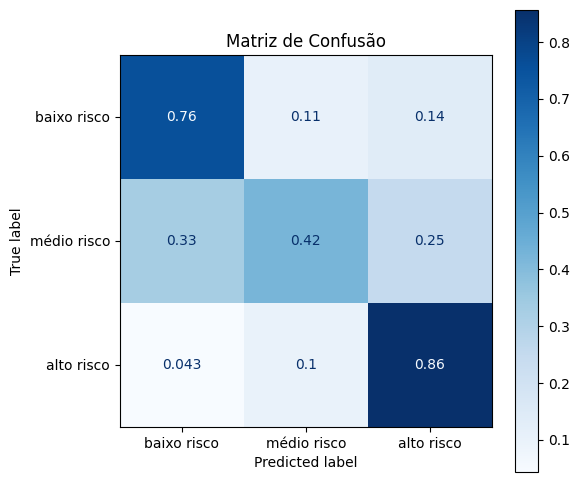

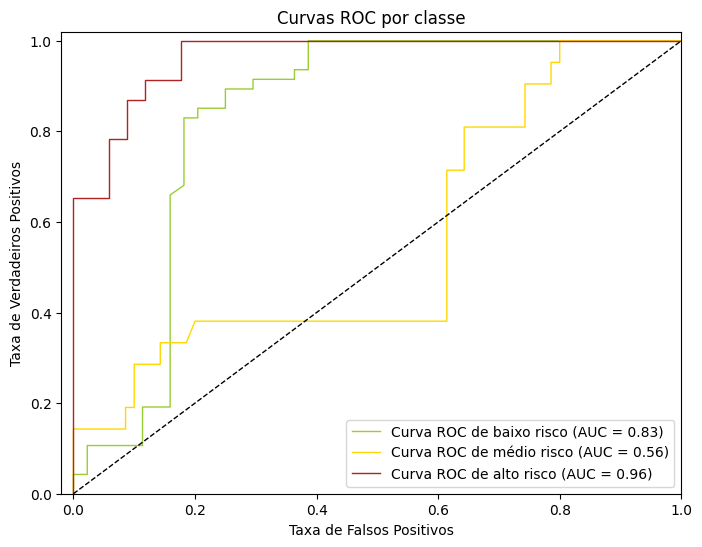

AUC geral: 0.78 ± 0.02


In [ ]:
# EXIBIÇÃO DAS MÉTRICAS
print('== Resultados Gerais ==')
print(f'Acurácia: {np.array(accuracy_history).mean():.2f} ± {np.array(accuracy_history).std():.2f}')
print(f'F1 Weighted: {np.array(f1_weighted_history).mean():.2f} ± {np.array(f1_weighted_history).std():.2f}')
print(f'F1 Macro: {np.array(f1_macro_history).mean():.2f} ± {np.array(f1_macro_history).std():.2f}')
print(f'Precision: {np.array(precision_macro_history).mean():.2f} ± {np.array(precision_macro_history).std():.2f}')
print(f'Recall: {np.array(recall_macro_history).mean():.2f} ± {np.array(recall_macro_history).std():.2f}')
print()
print('== Resultados por Classe ==')
for i in range(0, n_classes):
  print(f'Precision da classe {nome_classes[i]}: {np.array(precision_history).mean(axis=0)[i]:.2f} ± {np.array(precision_history).std(axis=0)[i]:.2f}')
print()
for i in range(0, n_classes):
  print(f'Recall da classe {nome_classes[i]}: {np.array(recall_history).mean(axis=0)[i]:.2f} ± {np.array(recall_history).std(axis=0)[i]:.2f}')
print()
for i in range(0, n_classes):
  print(f'F1 da classe {nome_classes[i]}: {np.array(f1_history).mean(axis=0)[i]:.2f} ± {np.array(f1_history).std(axis=0)[i]:.2f}')
print()

# EXIBIÇÃO DA MATRIZ DE CONFUSÃO
fig, ax = plt.subplots(figsize=(6, 6))
ax.set_title('Matriz de Confusão')
# Criação da matriz de confusão a partir da média obtida
cf_matrix = np.array(cf_matrix_history).mean(axis=0)
cm = ConfusionMatrixDisplay(confusion_matrix = cf_matrix, display_labels = nome_classes)
# Plotando a matriz de confusão
ax = cm.plot(ax=ax, cmap = 'Blues')

# EXIBIÇÃO DA CURVA ROC E SUA AUC
# Calculando fpr, tpr e auc para cada classe
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
  fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
  roc_auc[i] = auc(fpr[i], tpr[i])

# Plotagem
plt.figure(figsize=(8, 6))
for i in range(0, n_classes):
  plt.plot(fpr[i], tpr[i], color = paleta[i], label = f'Curva ROC de {nome_classes[i]} (AUC = {roc_auc[i]:.2f})', lw = 1)

plt.plot([0, 1], [0, 1], 'k--', lw = 1)
plt.xlabel('Taxa de Falsos Positivos')
plt.xlim([-0.02, 1.0])
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.ylim([0.0, 1.02])
plt.title('Curvas ROC por classe')
plt.legend(loc="lower right")
plt.show()
print(f'AUC geral: {np.array(auc_history).mean():.2f} ± {np.array(auc_history).std():.2f}')

## K-Fold #2

In [ ]:
# TREINO E VALIDAÇÃO CRUZADA K-FOLD
# Hiperparâmetros para teste (os melhores do grid hold-out)
param_grid = {'n_estimators': [n_est],
              'max_depth':[mdepth],
              'min_child_weight': [mchild_weight],
              'gamma':[gama]	,
              'lambda': [lamb],
              'learning_rate': [lr]
              }

# Lista para armazenar os resultados
results = []

# Aplicar GridSearchCV para K = 2, 3, ..., 5
for i in range(1, 5):
  K = i+1
  print(f'Validação K-Fold com {K} folds em andamento...')
  grid = GridSearchCV(estimator = XGBClassifier(), param_grid = param_grid, scoring = 'accuracy', cv = K, verbose = 0)
  grid_result = grid.fit(X_train, y_train)
  y_pred = grid.predict(X_test)
  results.append(accuracy_score(y_test, y_pred))
  print('Concluida.')

Validação K-Fold com 2 folds em andamento...
Concluida.
Validação K-Fold com 3 folds em andamento...
Concluida.
Validação K-Fold com 4 folds em andamento...
Concluida.
Validação K-Fold com 5 folds em andamento...
Concluida.


In [ ]:
# Exibindo todas as acurácias
for i in range(1, 5):
  print(f'{i+1}-Fold, acurácia:', results[i-1])
# Exibindo o melhor K e sua acurácia
print(f'Melhor K = {results.index(max(results)) + 2} com acurácia = {max(results)}')

2-Fold, acurácia: 0.7582417582417582
3-Fold, acurácia: 0.7582417582417582
4-Fold, acurácia: 0.7582417582417582
5-Fold, acurácia: 0.7582417582417582
Melhor K = 2 com acurácia = 0.7582417582417582


In [ ]:
# AVALIAR 10x O MELHOR K DA VALIDAÇÃO K-FOLD
K = results.index(max(results)) + 2

classes = [0, 1, 2]
nome_classes = ['baixo risco', 'médio risco', 'alto risco']
n_classes = len(nome_classes)

cf_matrix_history = list()
accuracy_history = list()
precision_history = list()
precision_macro_history = list()
recall_history = list()
recall_macro_history = list()
f1_history = list()
f1_weighted_history = list()
f1_macro_history = list()
auc_history = list()

count = 0
for i in (0, 1, 2, 5, 10, 12, 123, 1234, 12345, 42):
  count += 1

  # Redefinindo os conjuntos de treino e teste
  ''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''
  _, X_train, X_test, y_train, y_test = func_data_3(random_state = i, output = False) # !!! defina novamente o dataset a ser utilizado !!!
  ''' === DEFINIÇÃO DO DATASET A SER UTILIZADO ==='''

  # Treinando o modelo
  grid = GridSearchCV(estimator = XGBClassifier(), param_grid = param_grid, scoring = 'accuracy', cv = K, verbose = 0)
  grid_result = grid.fit(X_train, y_train)

  # Salvando os valores de acurácia geral e precision, recall e f1 de cada classe
  y_pred = grid.predict(X_test)

  # salvando a matriz de confusão
  cm = confusion_matrix(y_test, y_pred)
  cm = pd.DataFrame(cm, index = nome_classes, columns = nome_classes)
  cm = cm.div(cm.sum(axis = 1), axis = 0) # normalizando a matriz de confusão
  cf_matrix_history.append(cm)

  # salvando a acurácia
  accuracy = accuracy_score(y_test, y_pred)
  accuracy_history.append(accuracy)

  # salvando a precisão de cada classe e a macro
  precision = precision_score(y_test, y_pred, average = None, zero_division = 0)
  precision_history.append(precision)
  precision = precision_score(y_test, y_pred, average = 'macro', zero_division = 0)
  precision_macro_history.append(precision)

  # salvando a recall de cada classe e a macro
  recall = recall_score(y_test, y_pred, average = None, zero_division = 0)
  recall_history.append(recall)
  recall = recall_score(y_test, y_pred, average = 'macro', zero_division = 0)
  recall_macro_history.append(recall)

  # salvando o f1-score de cada classe, o macro e o weighted
  f1 = f1_score(y_test, y_pred, average = None, zero_division = 0)
  f1_history.append(f1)
  f1 = f1_score(y_test, y_pred, average = 'weighted', zero_division = 0)
  f1_weighted_history.append(f1)
  f1 = f1_score(y_test, y_pred, average = 'macro', zero_division = 0)
  f1_macro_history.append(f1)

  # salvando a média auc macro
  y_score = final_model.predict_proba(X_test) # Previsões
  y_test_bin = preprocessing.label_binarize(y_test, classes = classes) # Binarizendo as classes verdadeiras
  auc_history.append(roc_auc_score(y_test_bin, y_score, average = 'macro'))

== Resultados Gerais ==
Acurácia: 0.68 ± 0.04
F1 Weighted: 0.68 ± 0.04
F1 Macro: 0.63 ± 0.05
Precision: 0.63 ± 0.05
Recall: 0.63 ± 0.04

== Resultados por Classe ==
Precision da classe baixo risco: 0.76 ± 0.03
Precision da classe médio risco: 0.37 ± 0.09
Precision da classe alto risco: 0.76 ± 0.06

Recall da classe baixo risco: 0.79 ± 0.06
Recall da classe médio risco: 0.34 ± 0.10
Recall da classe alto risco: 0.77 ± 0.09

F1 da classe baixo risco: 0.78 ± 0.04
F1 da classe médio risco: 0.35 ± 0.10
F1 da classe alto risco: 0.76 ± 0.06



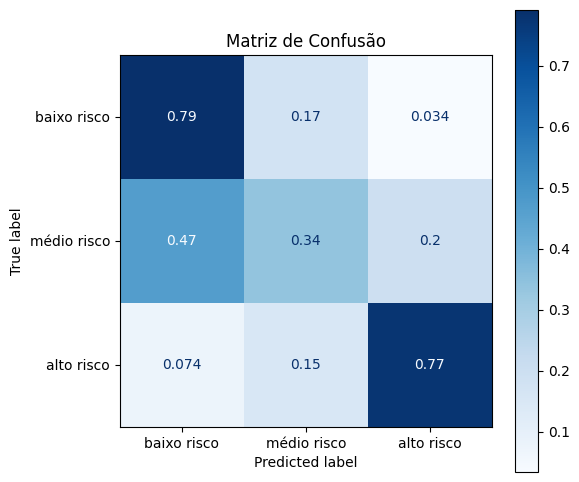

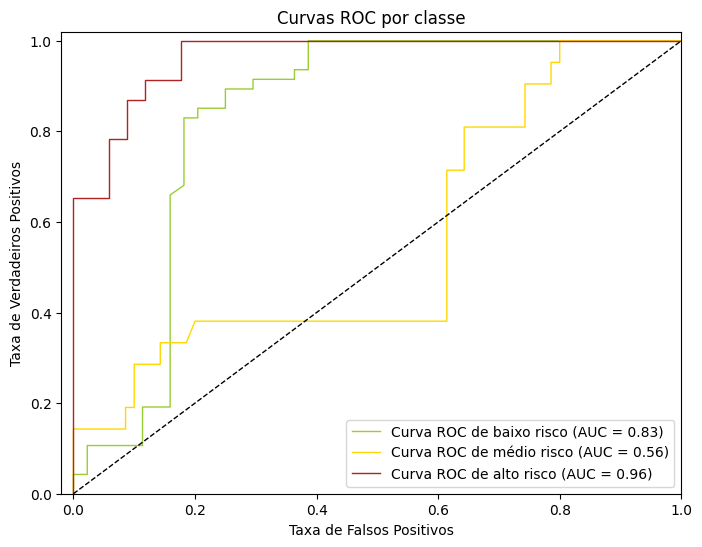

AUC geral: 0.84 ± 0.05


In [ ]:
# EXIBIÇÃO DAS MÉTRICAS
print('== Resultados Gerais ==')
print(f'Acurácia: {np.array(accuracy_history).mean():.2f} ± {np.array(accuracy_history).std():.2f}')
print(f'F1 Weighted: {np.array(f1_weighted_history).mean():.2f} ± {np.array(f1_weighted_history).std():.2f}')
print(f'F1 Macro: {np.array(f1_macro_history).mean():.2f} ± {np.array(f1_macro_history).std():.2f}')
print(f'Precision: {np.array(precision_macro_history).mean():.2f} ± {np.array(precision_macro_history).std():.2f}')
print(f'Recall: {np.array(recall_macro_history).mean():.2f} ± {np.array(recall_macro_history).std():.2f}')
print()
print('== Resultados por Classe ==')
for i in range(0, n_classes):
  print(f'Precision da classe {nome_classes[i]}: {np.array(precision_history).mean(axis=0)[i]:.2f} ± {np.array(precision_history).std(axis=0)[i]:.2f}')
print()
for i in range(0, n_classes):
  print(f'Recall da classe {nome_classes[i]}: {np.array(recall_history).mean(axis=0)[i]:.2f} ± {np.array(recall_history).std(axis=0)[i]:.2f}')
print()
for i in range(0, n_classes):
  print(f'F1 da classe {nome_classes[i]}: {np.array(f1_history).mean(axis=0)[i]:.2f} ± {np.array(f1_history).std(axis=0)[i]:.2f}')
print()

# EXIBIÇÃO DA MATRIZ DE CONFUSÃO
fig, ax = plt.subplots(figsize=(6, 6))
ax.set_title('Matriz de Confusão')
# Criação da matriz de confusão a partir da média obtida
cf_matrix = np.array(cf_matrix_history).mean(axis=0)
cm = ConfusionMatrixDisplay(confusion_matrix = cf_matrix, display_labels = nome_classes)
# Plotando a matriz de confusão
ax = cm.plot(ax=ax, cmap = 'Blues')

# EXIBIÇÃO DA CURVA ROC E SUA AUC
# Calculando fpr, tpr e auc para cada classe
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
  fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
  roc_auc[i] = auc(fpr[i], tpr[i])

# Plotagem
plt.figure(figsize=(8, 6))
for i in range(0, n_classes):
  plt.plot(fpr[i], tpr[i], color = paleta[i], label = f'Curva ROC de {nome_classes[i]} (AUC = {roc_auc[i]:.2f})', lw = 1)

plt.plot([0, 1], [0, 1], 'k--', lw = 1)
plt.xlabel('Taxa de Falsos Positivos')
plt.xlim([-0.02, 1.0])
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.ylim([0.0, 1.02])
plt.title('Curvas ROC por classe')
plt.legend(loc="lower right")
plt.show()
print(f'AUC geral: {np.array(auc_history).mean():.2f} ± {np.array(auc_history).std():.2f}')

## Gráficos SHAP

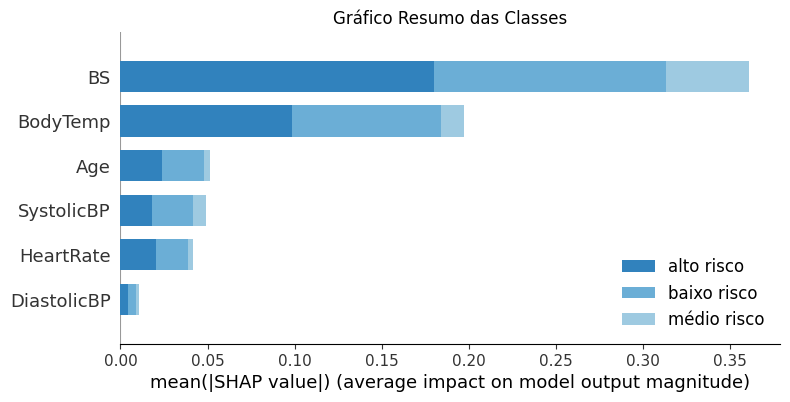

=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x


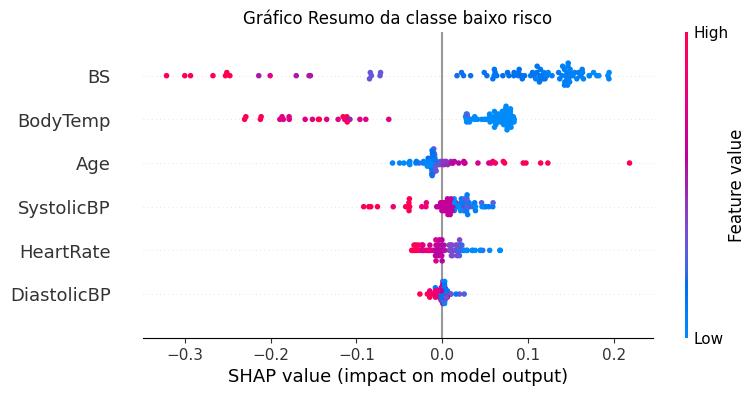

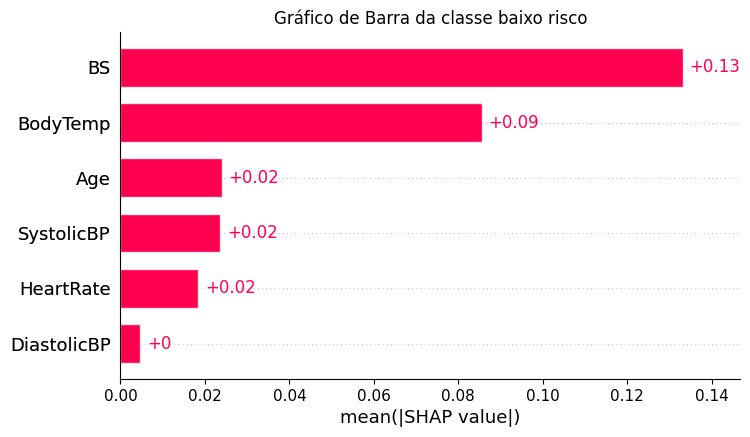

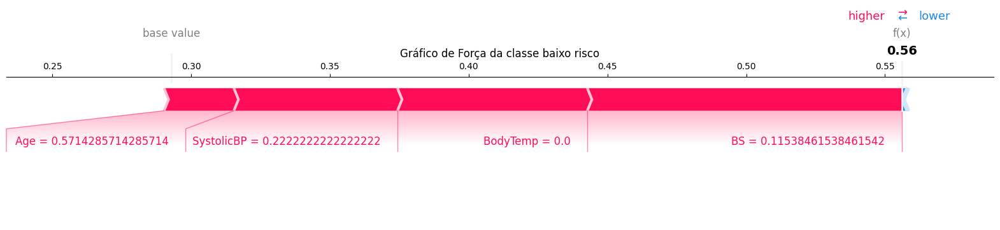

=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x


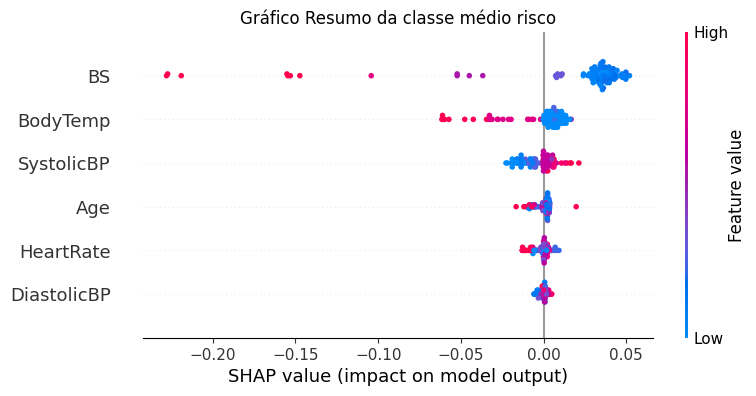

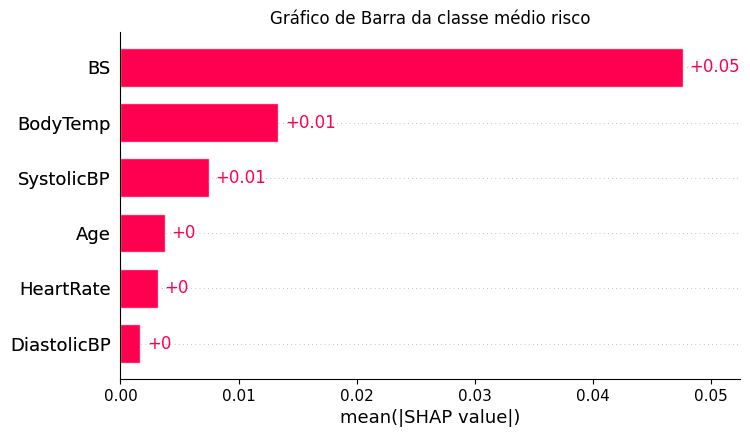

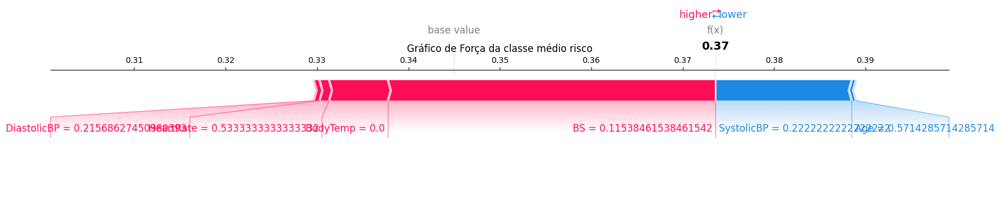

=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x


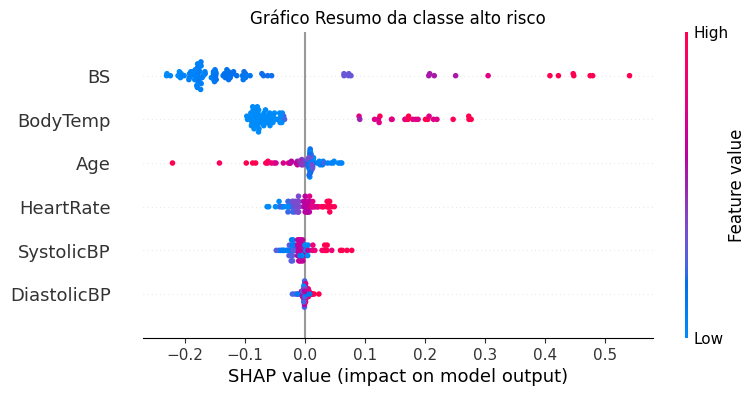

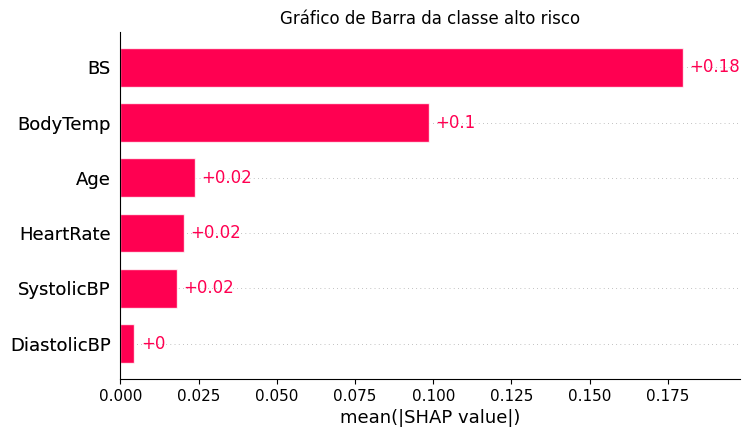

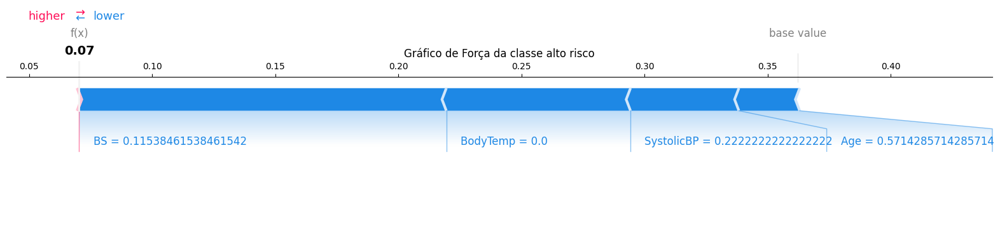

=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x


In [ ]:
# EXIBIÇÃO DOS GRÁFICOS SHAP
class_names = ['baixo risco', 'médio risco', 'alto risco']
explainer = shap.Explainer(final_model, X_train)
shap_values = explainer(X_test)

# Gráfico resumo geral
shap.summary_plot(shap_values, X_test, feature_names = np.array(data_.columns[:6]), plot_type = 'bar', show = False, class_names = class_names, color = plt.get_cmap("tab20c"))
plt.title("Gráfico Resumo das Classes")
plt.show()
print('=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x')

# Gráficos de resumo, barra e de força de cada classe
instance_index = 0 # Seleciona a instancia a ser explicada (exemplo: primeira linha do teste (X_test[0]))
for i in range(0, len(class_names)):
  shap.summary_plot(shap_values[:, :, i], X_test, feature_names = np.array(data_.columns[:6]), show = False) # quanto mais para a direita mais a influencia para a classe i
  plt.title(f'Gráfico Resumo da classe {class_names[i]}')
  plt.show()

  shap.plots.bar(shap.Explanation(values = shap_values[:, :, i], base_values = shap_values.base_values, data = X_test, feature_names = np.array(data_.columns[:6])), max_display = 6, show = False)
  plt.title(f'Gráfico de Barra da classe {class_names[i]}')
  plt.show()

  # Escolhe a classe que você quer explicar (por exemplo, a classe 0)
  class_to_explain = i

  # SHAP values para a instância e classe escolhida
  shap_values_instance_class = shap_values[instance_index, :, class_to_explain]

  # Base value (expected_value) para a classe escolhida
  base_value_for_class = shap_values.base_values[class_to_explain]

  # Valores das features para a instância escolhida
  feature_values_instance = X_test[instance_index]

  explanation_for_instance = shap.Explanation(
      values = shap_values_instance_class,
      base_values = base_value_for_class,
      data = feature_values_instance,
      feature_names = np.array(data_.columns[:6])
  )
  shap.plots.force(explanation_for_instance, matplotlib = True, show = False)
  plt.title(f'Gráfico de Força da classe {class_names[i]}')
  plt.show()
  print('=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x=x')

# ------------ LIXO (PROVAVELMENTE) ------------

## **Definições para o Grid Search

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input, Dropout

# DEFINIÇÃO DO DATASET A SER UTILIZADO
_, X_train, X_test, y_train, y_test = func_data_3(output = False) # !!! escolha o dataset alterando o número após o func_data_ !!!

# VALIDAÇÃO K-FOLD
callback_GS = tf.keras.callbacks.EarlyStopping(monitor = 'accuracy', patience = 10, restore_best_weights = True) # Ferramenta de early stopping
epc_GS = 200 # Número de épocas

# VALIDAÇÃO DO MELHOR MODELO
callback = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss', patience = 100, restore_best_weights = True) # Ferramenta de early stopping
epc = 500 # Número de épocas

# Definição de uma função para a compilação de um modelo variável
def build_model(activation, hidden1, learning_rate):
  model = Sequential([
      Input(shape = (6,)),
      Dense(hidden1, activation=activation),
      Dropout(0.4),
      Dense(hidden1, activation=activation),
      Dropout(0.4),
      Dense(hidden1, activation=activation),
      Dense(3, activation = 'softmax')
      ])
  model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate),
                loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
                metrics = ['accuracy'])
  return model

# GRID SEARCH PARA VALIDAÇÃO K-FOLD
# Hiperparâmetros para teste
param_grid = {
    'model__hidden1': [4, 8],
    'model__activation': ['relu'],
    'model__learning_rate': [0.001],
    'batch_size': [8]
}

## **Grid Search com Validação K-Fold

In [ ]:
# TREINO E VALIDAÇÃO CRUZADA K-FOLD
from scikeras.wrappers import KerasClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

# Valor do K
K = 5

# Criar classificador
clf = KerasClassifier(
    model = build_model,
    callbacks = callback_GS,
    epochs = epc_GS,
    verbose = 0
)

# EXECUÇÃO DO GRID SEARCH
# Aplicar GridSearchCV
grid = GridSearchCV(estimator = clf, param_grid=param_grid, scoring='accuracy', cv = K, verbose = 2)
grid_result = grid.fit(X_train, y_train)
print('Melhor modelo:', grid_result.best_params_)

Fitting 5 folds for each of 2 candidates, totalling 10 fits
[CV] END batch_size=8, model__activation=relu, model__hidden1=4, model__learning_rate=0.001; total time=   4.4s
[CV] END batch_size=8, model__activation=relu, model__hidden1=4, model__learning_rate=0.001; total time=  10.1s
[CV] END batch_size=8, model__activation=relu, model__hidden1=4, model__learning_rate=0.001; total time=  15.3s
[CV] END batch_size=8, model__activation=relu, model__hidden1=4, model__learning_rate=0.001; total time=  21.0s
[CV] END batch_size=8, model__activation=relu, model__hidden1=4, model__learning_rate=0.001; total time=  10.3s
[CV] END batch_size=8, model__activation=relu, model__hidden1=8, model__learning_rate=0.001; total time=  13.5s
[CV] END batch_size=8, model__activation=relu, model__hidden1=8, model__learning_rate=0.001; total time=  11.3s
[CV] END batch_size=8, model__activation=relu, model__hidden1=8, model__learning_rate=0.001; total time=  20.8s
[CV] END batch_size=8, model__activation=rel

## **Resultados

In [ ]:
from sklearn.metrics import recall_score, precision_score, f1_score, accuracy_score, confusion_matrix
import numpy as np

# AVALIAR O MELHOR MODELO DA VALIDAÇÃO CRUZADA K-FOLD
best_params = list(grid_result.best_params_.values())
batch_size = best_params[0]
best_params = best_params[1:]
final_model = build_model(*best_params)

nome_classes = ['baixo risco', 'médio risco', 'alto risco']
n_classes = len(nome_classes)

cf_matrix_history = list()
accuracy_history = list()
precision_history = list()
precision_macro_history = list()
recall_history = list()
recall_macro_history = list()
f1_history = list()
f1_weighted_history = list()
f1_macro_history = list()


for i in (0, 1, 2, 5, 10, 12, 42, 123, 1234, 12345):
  # Redefinindo os conjuntos de treino e teste
  _, X_train, X_test, y_train, y_test = func_data_3(random_state = i, output = False) # !!! defina novamente o dataset a ser utilizado !!!

  history = final_model.fit(X_train, y_train, epochs = epc, callbacks = callback, batch_size = batch_size, verbose = 0, validation_data = (X_test, y_test), shuffle = True)

  # Salvando os valores de acurácia geral e precision, recall e f1 de cada classe
  y_pred = np.argmax(final_model.predict(X_test), axis=1)

  # salvando a matriz de confusão
  cm = confusion_matrix(y_test, y_pred)
  cm = pd.DataFrame(cm, index = nome_classes, columns = nome_classes)
  cm = cm.div(cm.sum(axis = 1), axis = 0) # normalizando a matriz de confusão
  cf_matrix_history.append(cm)

  # salvando a acurácia
  accuracy = accuracy_score(y_test, y_pred)
  accuracy_history.append(accuracy)

  # salvando a precisão de cada classe e a macro
  precision = precision_score(y_test, y_pred, average = None, zero_division = 0)
  precision_history.append(precision)
  precision = precision_score(y_test, y_pred, average = 'macro', zero_division = 0)
  precision_macro_history.append(precision)

  # salvando a recall de cada classe e a macro
  recall = recall_score(y_test, y_pred, average = None, zero_division = 0)
  recall_history.append(recall)
  recall = recall_score(y_test, y_pred, average = 'macro', zero_division = 0)
  recall_macro_history.append(recall)

  # salvando o f1-score de cada classe, o macro e o weighted
  f1 = f1_score(y_test, y_pred, average = None, zero_division = 0)
  f1_history.append(f1)
  f1 = f1_score(y_test, y_pred, average = 'weighted', zero_division = 0)
  f1_weighted_history.append(f1)
  f1 = f1_score(y_test, y_pred, average = 'macro', zero_division = 0)
  f1_macro_history.append(f1)

KeyboardInterrupt: 

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# EXIBIÇÃO DAS MÉTRICAS
print('== Resultados Gerais ==')
print(f'Acurácia: {np.array(accuracy_history).mean():.2f} ± {np.array(accuracy_history).std():.2f}')
print(f'F1 Weighted: {np.array(f1_weighted_history).mean():.2f} ± {np.array(f1_weighted_history).std():.2f}')
print(f'F1 Macro: {np.array(f1_macro_history).mean():.2f} ± {np.array(f1_macro_history).std():.2f}')
print(f'Precision Macro: {np.array(precision_macro_history).mean():.2f} ± {np.array(precision_macro_history).std():.2f}')
print(f'Recall Macro: {np.array(recall_macro_history).mean():.2f} ± {np.array(recall_macro_history).std():.2f}')
print()
print('== Resultados por Classe ==')
for i in range(0, n_classes):
  print(f'Precision da classe {nome_classes[i]}: {np.array(precision_history).mean(axis=0)[i]:.2f} ± {np.array(precision_history).std(axis=0)[i]:.2f}')
print()
for i in range(0, n_classes):
  print(f'Recall da classe {nome_classes[i]}: {np.array(recall_history).mean(axis=0)[i]:.2f} ± {np.array(recall_history).std(axis=0)[i]:.2f}')
print()
for i in range(0, n_classes):
  print(f'F1 da classe {nome_classes[i]}: {np.array(f1_history).mean(axis=0)[i]:.2f} ± {np.array(f1_history).std(axis=0)[i]:.2f}')
print()
# EXIBIÇÃO DA MATRIZ DE CONFUSÃO
cf_matrix = np.array(cf_matrix_history).mean(axis=0)
sns.heatmap(cf_matrix, cmap = 'Blues', annot = True, linewidth=1, fmt = '.2f')
plt.title('Matriz de Confusão')
plt.xlabel('VALORES PREDITOS')
plt.ylabel('VALORES REAIS')
plt.show()

## **EXIBIÇÃO DAS MÉTRICAS DO MODELO DA ÚLTIMA ITERAÇÃO

In [ ]:
# BIBLIOTECAS
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize

# AVALIAÇÃO DO MODELO
loss, accuracy = final_model.evaluate(X_test, y_test) # Avalia o modelo no conjunto de teste
print(f'Loss: {loss:.4f}, Accuracy: {accuracy:.4f}') # Calcula e imprime a perda e acurácia final no conjunto de teste

# PREVISÕES E RALATÓRIO DE CLASSIFICAÇÃO
y_pred = np.argmax(final_model.predict(X_test), axis=1)
# Faz previsões no conjunto de teste
# Transforma esses valores preditos de X_test em True e False (binário) e em seguida transforma os resultados anteriores em 1 e 0
# Usa argmax porque o modelo retorna dois valores (um para cada classe)

print(classification_report(y_test, y_pred, zero_division=0)) # Exibe métricas de desempenho como precisão, recall, f1-score

# EXIBIÇÃO DOS RESULTADOS
nome_classes = ['baixo risco', 'médio risco', 'alto risco']
paleta = ['#a5c6e2', '#5b98ca', '#244d6f']
classes = [0, 1, 2]
n_classes = len(classes)

# Gráfico de loss de treino e validação
fig, ax = plt.subplots(ncols = 2, nrows = 1, figsize = (12, 4), tight_layout = True)
ax[0].set_title('Evolução do Loss por Época')
ax[0].plot(history.history['loss'], c = 'royalblue', label = 'Loss Treinamento')
ax[0].plot(history.history['val_loss'], c = 'firebrick', label = 'Loss Validação')
ax[0].set_xlabel('Épocas')
ax[0].set_ylabel('Loss')
ax[0].grid(True)
ax[0].legend()

# Gráfico da acurácia de treino e validação
ax[1].set_title('Evolução do Accuracy por Época')
ax[1].plot(history.history['accuracy'], c = 'royalblue', label = 'Accuracy Treinamento')
ax[1].plot(history.history['val_accuracy'], c = 'firebrick', label = 'Accuracy Validação')
ax[1].set_xlabel('Épocas')
ax[1].set_ylabel('Accuracy')
ax[1].grid(True)
ax[1].legend()
plt.show()

# CURVA ROC
# Previsões de probabilidade
y_score = final_model.predict(X_test)

# Binarizendo as classes verdadeiras
y_test_bin = label_binarize(y_test, classes = classes)

# Calculando fpr, tpr e auc para cada classe
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
  fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
  roc_auc[i] = auc(fpr[i], tpr[i])

# Plotagem
plt.figure(figsize=(8, 6))
for i in range(0, n_classes):
  plt.plot(fpr[i], tpr[i], color = paleta[i], label = f'Curva ROC de {nome_classes[i]} (AUC = {roc_auc[i]:.2f})', lw = 1)

plt.plot([0, 1], [0, 1], 'k--', lw = 1)
plt.xlabel('Taxa de Falsos Positivos')
plt.xlim([-0.02, 1.0])
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.ylim([0.0, 1.02])
plt.title('Curvas ROC por classe')
plt.legend(loc="lower right")
plt.show()

# MATRIZ DE CONFUSÃO
# Montando a matrix
cf_matrix = confusion_matrix(y_test, y_pred)
cf_matrix = pd.DataFrame(cf_matrix, index = nome_classes, columns = nome_classes)

# Normalizando a matriz
cf_matrix_normalized = cf_matrix.div(cf_matrix.sum(axis = 1), axis = 0)

# Criando a matriz através de um heatmap
sns.heatmap(cf_matrix_normalized, cmap = 'Blues', annot = True, linewidth=1, fmt = '.2f')
plt.title('Matriz de Confusão')
plt.xlabel('VALORES PREDITOS')
plt.ylabel('VALORES REAIS')
plt.show()